```
Inputs/File required to run the below code - time_series_60_min_singleindex.csv

All outputs from the below code (excel files and images) are saved in

1. packed and compressed zip file (available for downloading at the end of this colab)
2. the below one drive link
https://mahindraecolecentrale-my.sharepoint.com/:f:/g/personal/se23ucse014_mahindrauniversity_edu_in/IgCJxJV1a6QZQbgEGulWJI0lAQ9rwO1248AdsZOlxTM8_A4?e=cCDyyB

```

In [ ]:
!mkdir -p /content/outputs/

print("Created folder structure:")
!find /content/outputs -type d

In [1]:
!pip install pmdarima
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 9.9 MB/s eta 0:00:00


Library Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import itertools
import os
import warnings
import gc
import json
import time
import random
from datetime import datetime, timedelta
from typing import Dict, List, Tuple, Optional

from pmdarima import ARIMA

from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.tsa.seasonal import seasonal_decompose

import tensorflow as tf
from tensorflow.keras.models import Sequential, clone_model
from tensorflow.keras.layers import GRU, Dense, Dropout, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve, f1_score, auc, classification_report
from sklearn.model_selection import train_test_split

import lightgbm as lgb

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.simplefilter('ignore', UserWarning)
warnings.simplefilter('ignore', RuntimeWarning)
warnings.filterwarnings('ignore', category=UserWarning, module='lightgbm')

In [8]:
raw_data = pd.read_csv('/content/time_series_60min_singleindex.csv')
print(f'Shape of data file : {raw_data.shape}')
print(f'Columns: {list(raw_data.columns)}')

Shape of data file : (50401, 300)
Columns: ['utc_timestamp', 'cet_cest_timestamp', 'AT_load_actual_entsoe_transparency', 'AT_load_forecast_entsoe_transparency', 'AT_price_day_ahead', 'AT_solar_generation_actual', 'AT_wind_onshore_generation_actual', 'BE_load_actual_entsoe_transparency', 'BE_load_forecast_entsoe_transparency', 'BE_solar_generation_actual', 'BE_wind_generation_actual', 'BE_wind_offshore_generation_actual', 'BE_wind_onshore_generation_actual', 'BG_load_actual_entsoe_transparency', 'BG_load_forecast_entsoe_transparency', 'BG_solar_generation_actual', 'BG_wind_onshore_generation_actual', 'CH_load_actual_entsoe_transparency', 'CH_load_forecast_entsoe_transparency', 'CH_solar_capacity', 'CH_solar_generation_actual', 'CH_wind_onshore_capacity', 'CH_wind_onshore_generation_actual', 'CY_load_actual_entsoe_transparency', 'CY_load_forecast_entsoe_transparency', 'CY_wind_onshore_generation_actual', 'CZ_load_actual_entsoe_transparency', 'CZ_load_forecast_entsoe_transparency', 'CZ_so

Below, we are trying to find basic information such as
* number of columns per country
* what columns are there for each country
* How many null values are present in each column etc

This will help us pick the countries



In [9]:
col_counts = {}
col_names = {}

for col in raw_data.columns[2:]:
  country_code, col_name = col.split('_', 1)
  if country_code not in col_counts.keys():
    col_counts[country_code] = 1
    col_names[country_code] = [col_name]
  else:
    col_counts[country_code] += 1
    col_names[country_code].append(col_name)

print('NUMBER OF COLUMNS FOR A COUNTRY')
for key, values in col_counts.items():
  print(f'{key}: {values} columns')

print('='*100)

print('\n COLUMNS PER COUNTRY')
for key, values in col_names.items():
  print(f'{key}: {values}')

print('\n NULL VALUES PER COLUMN')
print(f"{'COLUMN':<50} {'NULL VALUE PERCENTAGE':<20}")
print('-'*100)
for col in raw_data.columns:
  print(f'{col:<50} {raw_data[col].isnull().sum()/raw_data.shape[0] * 100:<20}')

NUMBER OF COLUMNS FOR A COUNTRY
AT: 5 columns
BE: 6 columns
BG: 4 columns
CH: 6 columns
CY: 3 columns
CZ: 4 columns
DE: 41 columns
DK: 24 columns
EE: 4 columns
ES: 4 columns
FI: 3 columns
FR: 4 columns
GB: 30 columns
GR: 4 columns
HR: 4 columns
HU: 4 columns
IE: 7 columns
IT: 52 columns
LT: 4 columns
LU: 2 columns
LV: 3 columns
ME: 3 columns
NL: 6 columns
NO: 23 columns
PL: 4 columns
PT: 6 columns
RO: 4 columns
RS: 2 columns
SE: 22 columns
SI: 4 columns
SK: 4 columns
UA: 2 columns

 COLUMNS PER COUNTRY
AT: ['load_actual_entsoe_transparency', 'load_forecast_entsoe_transparency', 'price_day_ahead', 'solar_generation_actual', 'wind_onshore_generation_actual']
BE: ['load_actual_entsoe_transparency', 'load_forecast_entsoe_transparency', 'solar_generation_actual', 'wind_generation_actual', 'wind_offshore_generation_actual', 'wind_onshore_generation_actual']
BG: ['load_actual_entsoe_transparency', 'load_forecast_entsoe_transparency', 'solar_generation_actual', 'wind_onshore_generation_actual'


We are
1. finding the null percentages for each column (what percent of a particular column is filled with nulls)
2. then sorting them in ascending order of null percentages
   Lesser the null percentage means lesser the missing data
3. Then picking countries

In [10]:
def analyze_country_load_data(raw_data):
    country_codes = set()
    for col in raw_data.columns:
        if 'load' in col.lower():
            country_code = col.split('_')[0]
            country_codes.add(country_code)

    country_load_analysis = {}

    for country_code in sorted(country_codes):
        # Find only the specific load_actual column for this country
        load_cols = [col for col in raw_data.columns if col == f"{country_code}_load_actual_entsoe_transparency"]

        if not load_cols:
            continue

        # Calculate null percentage only for this load column
        total_load_cells = len(raw_data) * len(load_cols)
        total_load_nulls = sum(raw_data[col].isnull().sum() for col in load_cols)
        load_null_pct = (total_load_nulls / total_load_cells) * 100 if total_load_cells > 0 else 100

        country_load_analysis[country_code] = {
            'critical_null_pct': load_null_pct,
            'load_null_pct': load_null_pct,
            'num_load_columns': len(load_cols),
            'load_columns': load_cols
        }

    # Sort by critical null percentage (ascending - best countries first)
    sorted_countries = sorted(country_load_analysis.items(),
                            key=lambda x: x[1]['critical_null_pct'])

    return sorted_countries, country_load_analysis

# Usage
sorted_countries, country_load_analysis = analyze_country_load_data(raw_data)

print("COUNTRY LOAD DATA ANALYSIS")
print("="*40)
print(f"{'Country':<6} {'Null %':<15}")
print("-"*40)

for country, stats in sorted_countries:
    print(f"{country:<6} {stats['critical_null_pct']:<15.2f}")

# Show your selected countries
print("\n" + "="*30)
print("SELECTED COUNTRIES")
print("="*30)
selected_countries = ['FR', 'CH', 'AT']
for country in selected_countries:
    if country in country_load_analysis:
        stats = country_load_analysis[country]
        print(f"{country}: {stats['critical_null_pct']:.2f}% null values")
    else:
        print(f"{country}: Not found in data")

COUNTRY LOAD DATA ANALYSIS
Country Null %         
----------------------------------------
AT     0.00           
BE     0.00           
DE     0.00           
HU     0.00           
NL     0.00           
CH     0.01           
DK     0.01           
HR     0.01           
IT     0.01           
PL     0.01           
FI     0.03           
ES     0.05           
SK     0.06           
GR     0.08           
LV     0.08           
PT     0.08           
FR     0.09           
SI     0.12           
BG     0.13           
EE     0.16           
SE     0.19           
CZ     0.22           
NO     0.23           
RO     0.25           
LT     0.38           
IE     1.12           
LU     1.32           
ME     1.47           
RS     1.56           
CY     34.66          
UA     49.14          

SELECTED COUNTRIES
FR: 0.09% null values
CH: 0.01% null values
AT: 0.00% null values


**COUNTRIES CHOSEN: AT, CH, FR**



Now we are creating a dataframe for each country

Specifically:
1. collect all the columns for a country from our raw_data file and store it as country_cols
2. create a new dataframe, call it country_df
3. country_df will have columns = timestamps + country_cols
4. Rename the column {country}_load_actual_entsoe_transparency to load for our convinience
5. rename utc_timestamp to timestamp
6. sort data by timestamp -> ensures we preserve chronological order
7. Store the data in a dictionary (which is called country_dfs)

so final format of the dictionary:

{ 'AT' : dataframe of AT,  'CH' : dataframe of CH, 'FR' : dataframe of FR}

In [11]:
country_dfs = {}
countries = ['AT', 'CH', 'FR']

for country in countries:
  print(f"Creating DataFrame for {country}...")

  country_cols = [col for col in raw_data.columns if col.startswith(f"{country}_")]

  country_df = raw_data[['utc_timestamp'] + country_cols].copy()

  load_actual_col = f"{country}_load_actual_entsoe_transparency"
  if load_actual_col in country_df.columns:
      country_df = country_df.rename(columns={load_actual_col: 'load'})
      country_df = country_df.drop(f"{country}_load_forecast_entsoe_transparency", axis=1)

  country_df['timestamp'] = pd.to_datetime(country_df['utc_timestamp'], utc=True)
  country_df = country_df.drop(['utc_timestamp'], axis=1)

  cols = ['timestamp'] + [col for col in country_df.columns if col != 'timestamp']
  country_df = country_df[cols]

  country_df = country_df.sort_values('timestamp')
  country_df = country_df[country_df['timestamp'] >= country_df['timestamp'].max() - pd.DateOffset(years=2)]
  country_df = country_df.reset_index(drop=True)

  country_dfs[country] = country_df

  print(f"  {country}: {len(country_df)} rows, columns: {list(country_df.columns)}")


for country, df in country_dfs.items():
    print(f"\n{country} DataFrame:")
    print(f"  Shape: {df.shape}")
    print(f"  Time range: {df['timestamp'].min()} to {df['timestamp'].max()}")
    print(f"  Columns: {list(df.columns)}")

Creating DataFrame for AT...
  AT: 17545 rows, columns: ['timestamp', 'load', 'AT_price_day_ahead', 'AT_solar_generation_actual', 'AT_wind_onshore_generation_actual']
Creating DataFrame for CH...
  CH: 17545 rows, columns: ['timestamp', 'load', 'CH_solar_capacity', 'CH_solar_generation_actual', 'CH_wind_onshore_capacity', 'CH_wind_onshore_generation_actual']
Creating DataFrame for FR...
  FR: 17545 rows, columns: ['timestamp', 'load', 'FR_solar_generation_actual', 'FR_wind_onshore_generation_actual']

AT DataFrame:
  Shape: (17545, 5)
  Time range: 2018-09-30 23:00:00+00:00 to 2020-09-30 23:00:00+00:00
  Columns: ['timestamp', 'load', 'AT_price_day_ahead', 'AT_solar_generation_actual', 'AT_wind_onshore_generation_actual']

CH DataFrame:
  Shape: (17545, 6)
  Time range: 2018-09-30 23:00:00+00:00 to 2020-09-30 23:00:00+00:00
  Columns: ['timestamp', 'load', 'CH_solar_capacity', 'CH_solar_generation_actual', 'CH_wind_onshore_capacity', 'CH_wind_onshore_generation_actual']

FR DataFrame:


In [12]:
print('Number Of Unique Values\n')
for country, df in country_dfs.items():
    print(f"\n{country} ")
    for col in df.columns:
      print(f'{col}: {df[col].nunique()}')

print('\n', '-'*60)

print('Unique Values\n')
for country, df in country_dfs.items():
    print(f"\n{country} ")
    for col in df.columns:
      print(f'{col}: {list(df[col].unique())[:10]}')

print('\n', '-'*60)

print('\nPercentage Of Null Values\n')
for country, df in country_dfs.items():
    print(f"\n{country} ")
    for col in df.columns:
      print(f'{col}: {df[col].isnull().sum() / len(df[col]) * 100}')


Number Of Unique Values


AT 
timestamp: 17545
load: 5441
AT_price_day_ahead: 32
AT_solar_generation_actual: 980
AT_wind_onshore_generation_actual: 2837

CH 
timestamp: 17545
load: 17104
CH_solar_capacity: 1
CH_solar_generation_actual: 7704
CH_wind_onshore_capacity: 1
CH_wind_onshore_generation_actual: 3885

FR 
timestamp: 17545
load: 14158
FR_solar_generation_actual: 4636
FR_wind_onshore_generation_actual: 7394

 ------------------------------------------------------------
Unique Values


AT 
timestamp: [Timestamp('2018-09-30 23:00:00+0000', tz='UTC'), Timestamp('2018-10-01 00:00:00+0000', tz='UTC'), Timestamp('2018-10-01 01:00:00+0000', tz='UTC'), Timestamp('2018-10-01 02:00:00+0000', tz='UTC'), Timestamp('2018-10-01 03:00:00+0000', tz='UTC'), Timestamp('2018-10-01 04:00:00+0000', tz='UTC'), Timestamp('2018-10-01 05:00:00+0000', tz='UTC'), Timestamp('2018-10-01 06:00:00+0000', tz='UTC'), Timestamp('2018-10-01 07:00:00+0000', tz='UTC'), Timestamp('2018-10-01 08:00:00+0000', tz='UTC')]

Dropping any duplicate rows if they exist in our data frame

In [13]:
print('Checking And Dropping Duplicate Rows (If Any)')
for country, df in country_dfs.items():
  print(f"\n{country} ")
  print(f'Shape before dropping duplicates: {df.shape}')
  df.drop_duplicates(inplace=True)
  print(f'Shape after dropping duplicates: {df.shape}')

print('-'*60)

print('Dropping rows having NULL value in "load" ')
for country, df in country_dfs.items():
  print(f"\n{country} ")
  print(f'Shape before dropping NULL values: {df.shape}')
  df.dropna(subset=['load'], inplace=True)
  print(f'Shape after dropping NULL values: {df.shape}')

Checking And Dropping Duplicate Rows (If Any)

AT 
Shape before dropping duplicates: (17545, 5)
Shape after dropping duplicates: (17545, 5)

CH 
Shape before dropping duplicates: (17545, 6)
Shape after dropping duplicates: (17545, 6)

FR 
Shape before dropping duplicates: (17545, 4)
Shape after dropping duplicates: (17545, 4)
------------------------------------------------------------
Dropping rows having NULL value in "load" 

AT 
Shape before dropping NULL values: (17545, 5)
Shape after dropping NULL values: (17545, 5)

CH 
Shape before dropping NULL values: (17545, 6)
Shape after dropping NULL values: (17544, 6)

FR 
Shape before dropping NULL values: (17545, 4)
Shape after dropping NULL values: (17521, 4)


Splitting data into train, validation and test sets

In [14]:
def split_data(country_df):
    target_col = 'load'

    country_df = country_df.sort_values('timestamp').reset_index(drop=True)
    n = len(country_df)
    train_size = int(n * 0.8)
    val_size = int(n * 0.1)

    train = country_df[:train_size]
    val = country_df[train_size:train_size + val_size]
    test = country_df[train_size + val_size:]

    print(f"  Data split: Train={len(train)}, Val={len(val)}, Test={len(test)}")
    print(f" Train Data time range: {train['timestamp'].min()} to {train['timestamp'].max()}")
    print(f" Validation Data time range: {val['timestamp'].min()} to {val['timestamp'].max()}")
    print(f" Test Data time range: {test['timestamp'].min()} to {test['timestamp'].max()}")


    return train, val, test

def create_splits(processed_country_dfs):
    splits = {}

    for country, country_df in processed_country_dfs.items():
        print(f"\nSplitting data for {country}:")
        train, val, test = split_data(country_df)
        splits[country] = {
            "train": train,
            "val": val,
            "test": test
        }

    return splits

splits = create_splits(country_dfs)


Splitting data for AT:
  Data split: Train=14036, Val=1754, Test=1755
 Train Data time range: 2018-09-30 23:00:00+00:00 to 2020-05-07 18:00:00+00:00
 Validation Data time range: 2020-05-07 19:00:00+00:00 to 2020-07-19 20:00:00+00:00
 Test Data time range: 2020-07-19 21:00:00+00:00 to 2020-09-30 23:00:00+00:00

Splitting data for CH:
  Data split: Train=14035, Val=1754, Test=1755
 Train Data time range: 2018-09-30 23:00:00+00:00 to 2020-05-07 17:00:00+00:00
 Validation Data time range: 2020-05-07 18:00:00+00:00 to 2020-07-19 19:00:00+00:00
 Test Data time range: 2020-07-19 20:00:00+00:00 to 2020-09-30 22:00:00+00:00

Splitting data for FR:
  Data split: Train=14016, Val=1752, Test=1753
 Train Data time range: 2018-09-30 23:00:00+00:00 to 2020-05-07 18:00:00+00:00
 Validation Data time range: 2020-05-07 19:00:00+00:00 to 2020-07-19 18:00:00+00:00
 Test Data time range: 2020-07-19 19:00:00+00:00 to 2020-09-30 22:00:00+00:00


Plotting load vs timestamp for each country to check for seasonality and trend

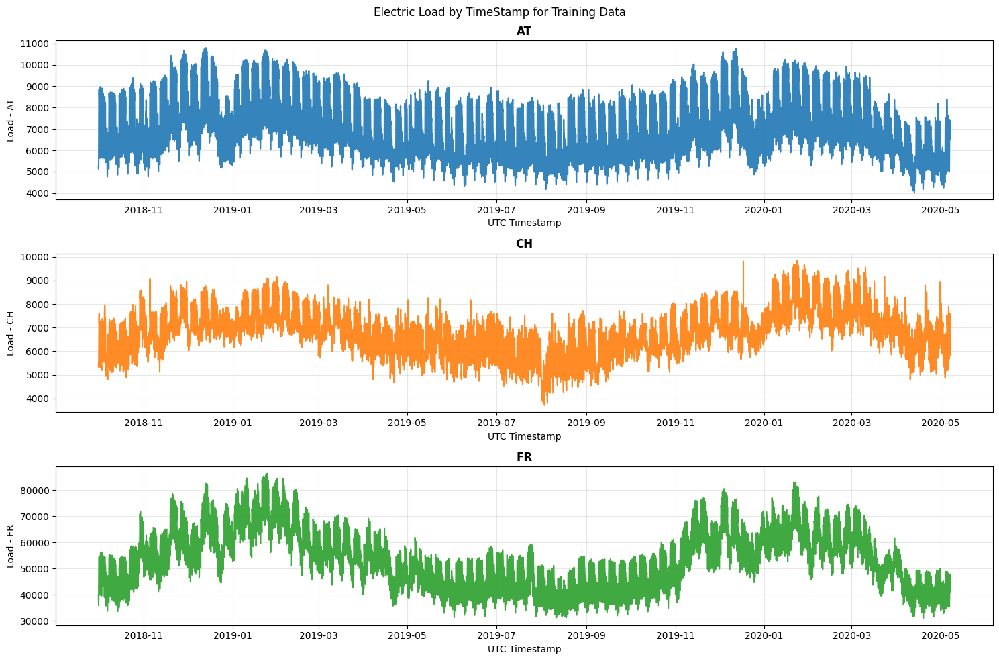

In [15]:
color_pal = sns.color_palette()

fig, axes = plt.subplots(3, 1, figsize=(15, 10))

for i, country in enumerate(['AT', 'CH', 'FR']):
    df = splits[country]
    axes[i].plot(df['train']['timestamp'], df['train']['load'], linewidth=1.5, alpha = 0.9, color = color_pal[i])
    axes[i].set_title(f'{country}', fontweight='bold')
    axes[i].set_ylabel(f"Load - {country}")
    axes[i].set_xlabel('UTC Timestamp')
    axes[i].grid(True, alpha = 0.3)

plt.suptitle('Electric Load by TimeStamp for Training Data')
plt.tight_layout()
plt.show()


CHECKING ENERGY RANGES
We are plotting the first 14 days and the last 14 days of the data

We are again plotting load vs timestamp this time to roughly find the ranges of load for each country. Also to ensure the ranges are in reasonable limits

From the below plots:
1. AT - 4500 TO 9000 (rough estimate)
2. CH - 4500 TO 9500 (rough estimate)
3. FR - 35000 TO 80000 (rough estimate)

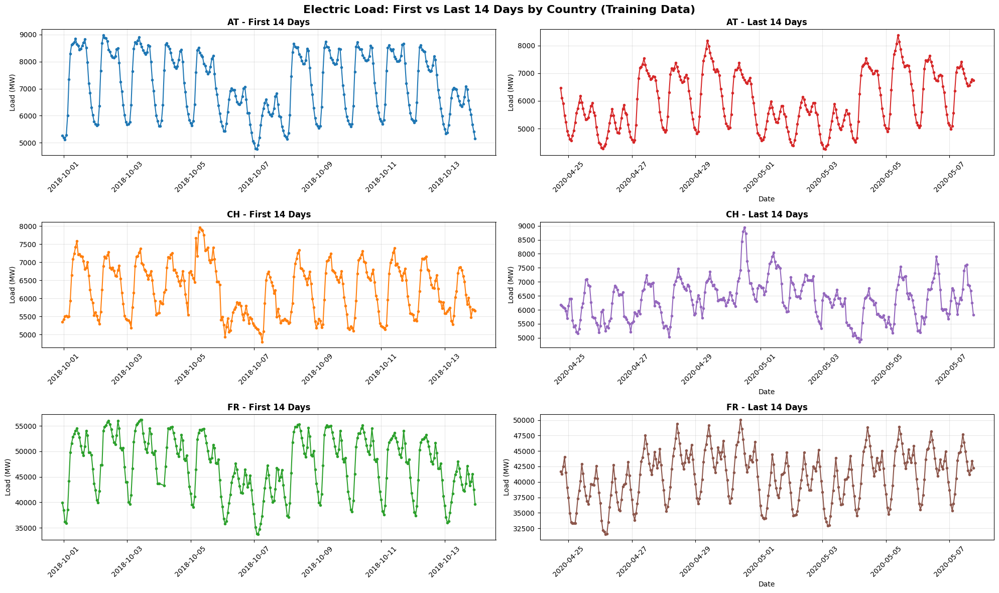

In [16]:
fig, axes = plt.subplots(3, 2, figsize=(20, 12))

for i, country in enumerate(['AT', 'CH', 'FR']):
    df = splits[country]['train'].copy()
    df['timestamp'] = pd.to_datetime(df['timestamp'])

    # Get first and last 14 days using date ranges
    first_date = df['timestamp'].min()
    last_date = df['timestamp'].max()

    first_14_days = df[df['timestamp'] <= first_date + pd.Timedelta(days=13)]
    last_14_days = df[df['timestamp'] >= last_date - pd.Timedelta(days=13)]

    # Plot first 14 days
    axes[i, 0].plot(first_14_days['timestamp'], first_14_days['load'],
                   linewidth=1.5, color=color_pal[i], marker='o', markersize=3)
    axes[i, 0].set_title(f'{country} - First 14 Days', fontweight='bold')
    axes[i, 0].set_ylabel('Load (MW)')
    axes[i, 0].grid(True, alpha=0.3)
    axes[i, 0].tick_params(axis='x', rotation=45)

    # Plot last 14 days
    axes[i, 1].plot(last_14_days['timestamp'], last_14_days['load'],
                   linewidth=1.5, color=color_pal[i+3], marker='o', markersize=3)
    axes[i, 1].set_title(f'{country} - Last 14 Days', fontweight='bold')
    axes[i, 1].set_ylabel('Load (MW)')
    axes[i, 1].set_xlabel('Date')
    axes[i, 1].grid(True, alpha=0.3)
    axes[i, 1].tick_params(axis='x', rotation=45)

plt.suptitle('Electric Load: First vs Last 14 Days by Country (Training Data)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

**STL DECOMPOSITION**

Decomposing load into trend, seasonality and residual components using the STL function for each country and plotting them



AT - First 30 days:
  Sample size: 720


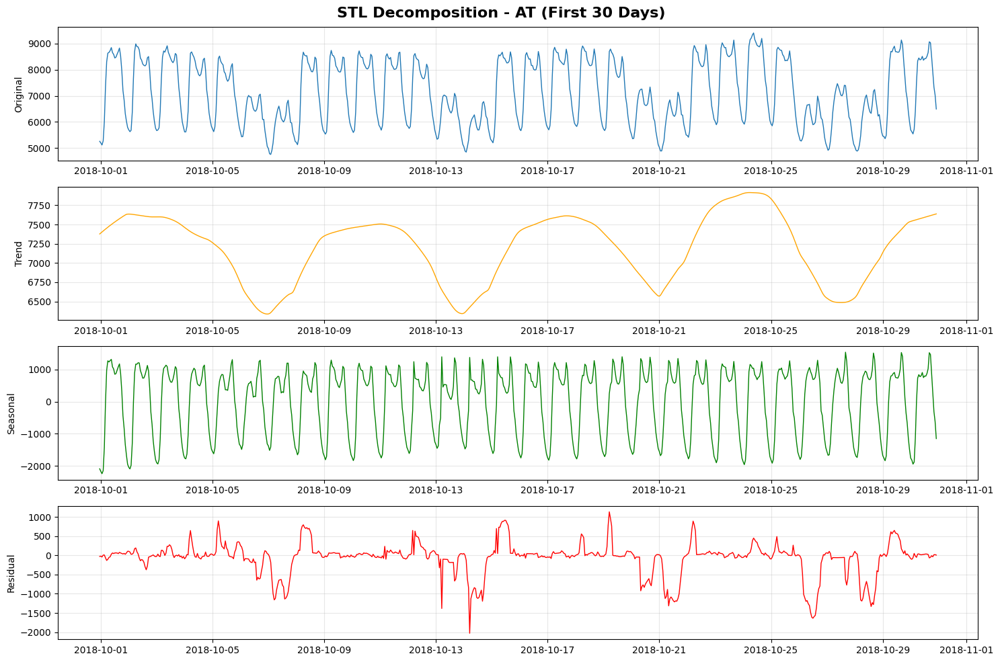


CH - First 30 days:
  Sample size: 720


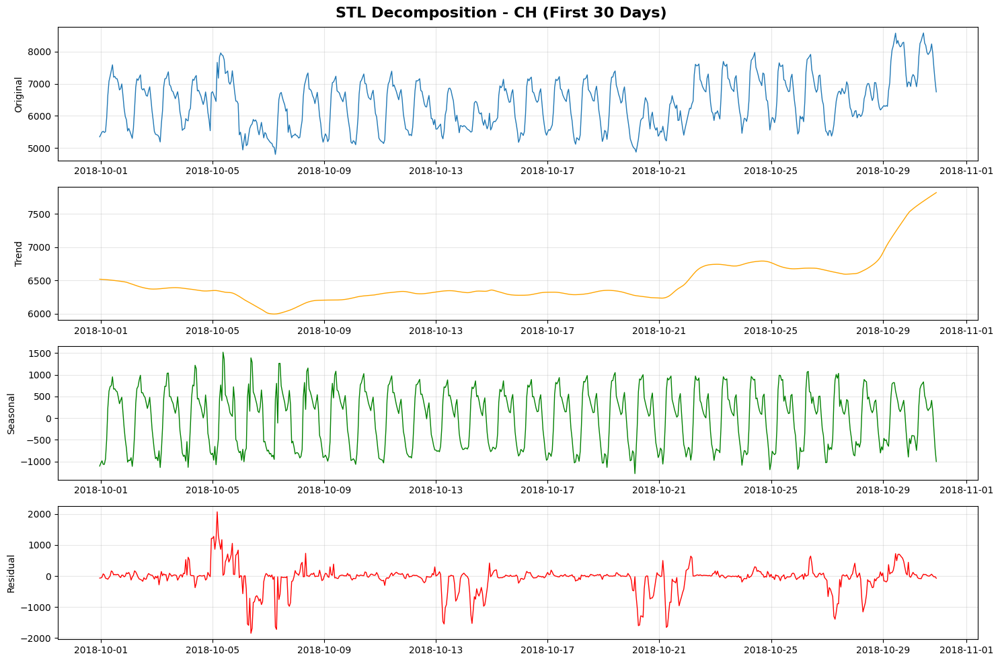


FR - First 30 days:
  Sample size: 720


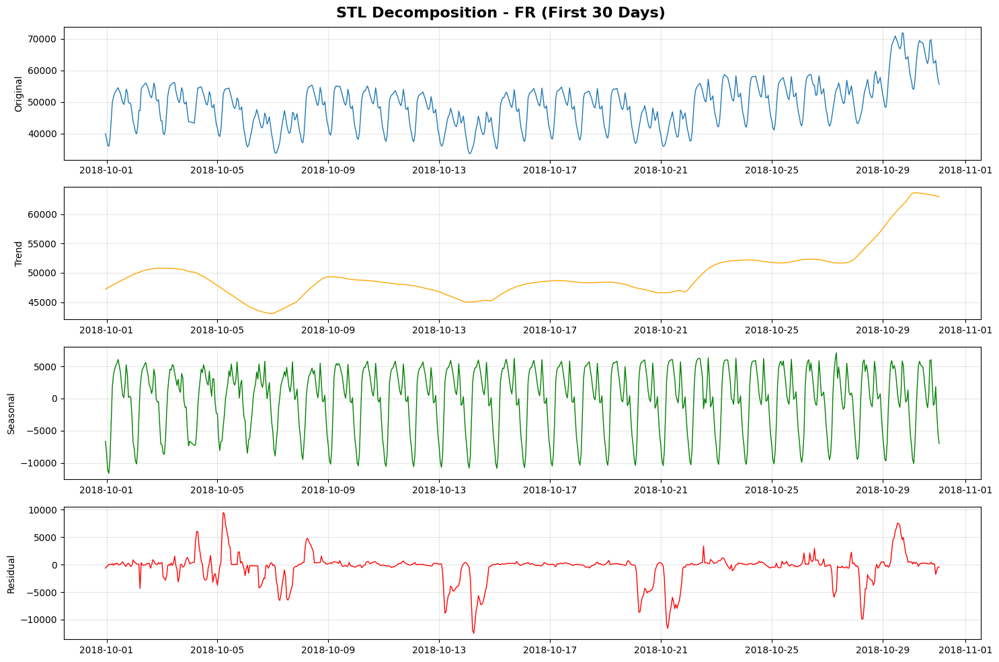

In [17]:
days = 30
period = 24

for country in ['AT', 'CH', 'FR']:
    df = splits[country]['train'].copy()
    df = df.sort_values('timestamp')
    df_temp = df.set_index('timestamp')

    sample_size = 24 * days
    sample_data = df_temp['load'].head(sample_size).dropna()

    print(f"\n{country} - First {days} days:")
    print(f"  Sample size: {len(sample_data)}")

    stl = STL(sample_data, period=period, robust=True)
    result = stl.fit()

    fig, axes = plt.subplots(4, 1, figsize=(15, 10))
    fig.suptitle(f'STL Decomposition - {country} (First {days} Days)', fontsize=16, fontweight='bold')

    axes[0].plot(sample_data.index, sample_data, linewidth=1)
    axes[0].set_ylabel('Original')

    axes[1].plot(sample_data.index, result.trend, linewidth=1, color='orange')
    axes[1].set_ylabel('Trend')

    axes[2].plot(sample_data.index, result.seasonal, linewidth=1, color='green')
    axes[2].set_ylabel('Seasonal')

    axes[3].plot(sample_data.index, result.resid, linewidth=1, color='red')
    axes[3].set_ylabel('Residual')

    for ax in axes:
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

CHECKING IF TIMESERIES IS STATIONARY OR NOT BY USING THE ADF TEST

Remember we want to run a SARIMA (p, d, q) x (P, D, Q, s)
where:

* p, q -> Regular ARIMA orders
* P, Q -> Seasonal ARIMA orders
* d -> regular differencing order
* D -> seasonal differencing order
* s -> season

Now we want to find D and then d values


In [22]:
os.makedirs('/content/outputs', exist_ok=True)


DIFFERENCING ANALYSIS FOR AT

STEP 1: Original data and ACF for AT


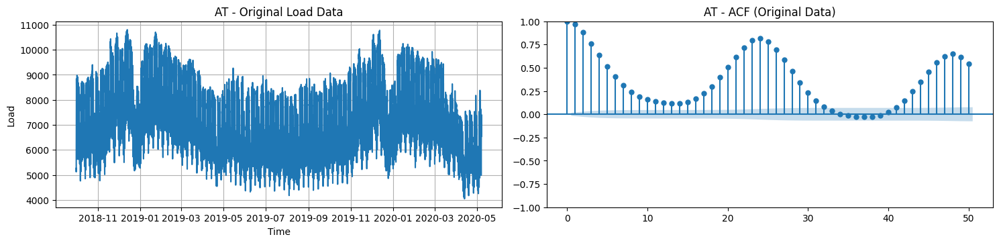


STEP 2: Finding seasonal differencing (D) for AT:
  ACF at seasonal lag 24: 0.818
  ADF test p-value: 0.0000
  Strong seasonality detected in original data -> testing D=1
  After 1st seasonal difference: ACF at lag 24: -0.040, ADF p-value: 0.0000
 First seasonal difference removes pattern -> D=1
Recommended D = 1


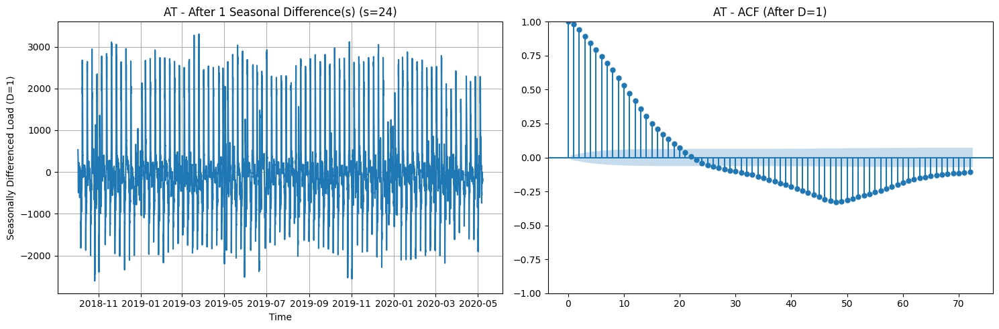


STEP 3: Finding regular differencing (d) for AT (after D=1):
  Checking stationarity after seasonal differencing:
    Data - ADF p-value: 0.0000
    ACF at lag 1: 0.983
    Signs of overdifferencing: False
  ~ Marginally stationary -> d=0
Recommended d = 0

FINAL RECOMMENDATION FOR AT:
   SARIMA(p,0,q)(P,1,Q)24

DIFFERENCING ANALYSIS FOR CH

STEP 1: Original data and ACF for CH


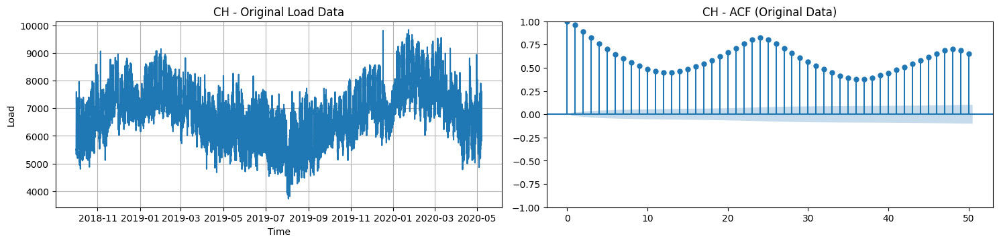


STEP 2: Finding seasonal differencing (D) for CH:
  ACF at seasonal lag 24: 0.821
  ADF test p-value: 0.0000
  Strong seasonality detected in original data -> testing D=1
  After 1st seasonal difference: ACF at lag 24: -0.166, ADF p-value: 0.0000
 First seasonal difference removes pattern -> D=1
Recommended D = 1


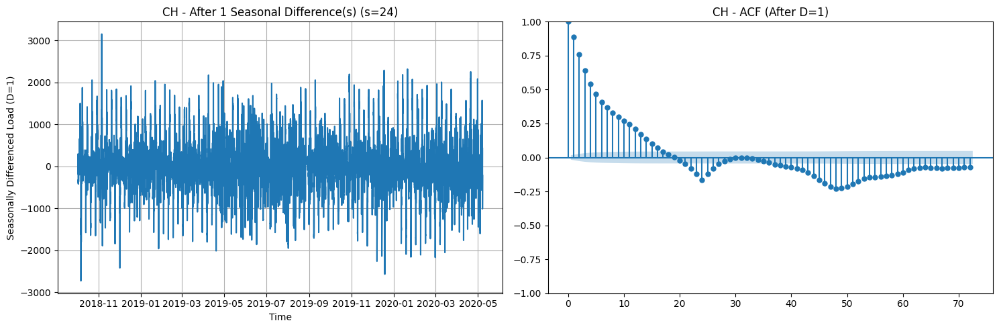


STEP 3: Finding regular differencing (d) for CH (after D=1):
  Checking stationarity after seasonal differencing:
    Data - ADF p-value: 0.0000
    ACF at lag 1: 0.888
    Signs of overdifferencing: False
  ~ Marginally stationary -> d=0
Recommended d = 0

FINAL RECOMMENDATION FOR CH:
   SARIMA(p,0,q)(P,1,Q)24

DIFFERENCING ANALYSIS FOR FR

STEP 1: Original data and ACF for FR


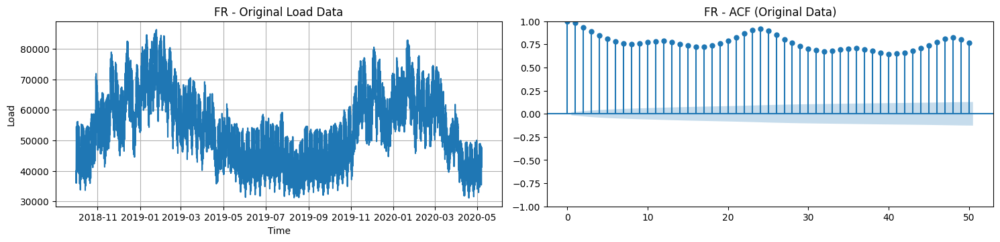


STEP 2: Finding seasonal differencing (D) for FR:
  ACF at seasonal lag 24: 0.916
  ADF test p-value: 0.0000
  Strong seasonality detected in original data -> testing D=1
  After 1st seasonal difference: ACF at lag 24: 0.057, ADF p-value: 0.0000
 First seasonal difference removes pattern -> D=1
Recommended D = 1


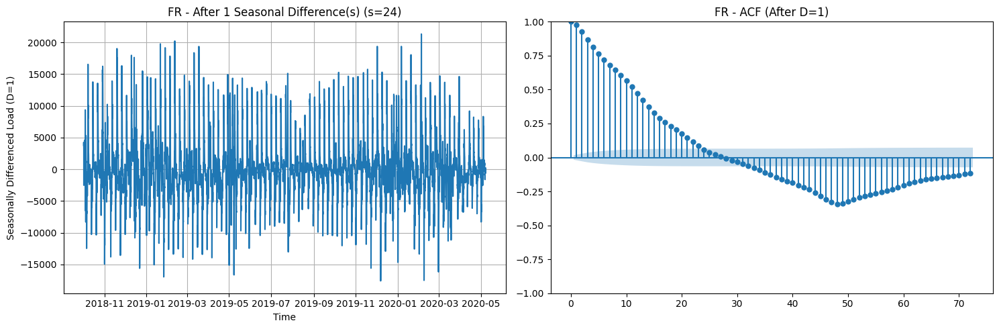


STEP 3: Finding regular differencing (d) for FR (after D=1):
  Checking stationarity after seasonal differencing:
    Data - ADF p-value: 0.0000
    ACF at lag 1: 0.977
    Signs of overdifferencing: False
  ~ Marginally stationary -> d=0
Recommended d = 0

FINAL RECOMMENDATION FOR FR:
   SARIMA(p,0,q)(P,1,Q)24


In [23]:
def differencing_analysis(country_dfs, s=24):
    results = {}

    for country in ['AT', 'CH', 'FR']:
        print(f"\n{'='*60}")
        print(f"DIFFERENCING ANALYSIS FOR {country}")
        print(f"{'='*60}")

        df = country_dfs[country]['train'].copy()
        data = df.set_index('timestamp')['load'].dropna()

        print(f"\nSTEP 1: Original data and ACF for {country}")
        plt.figure(figsize=(15, 10))

        plt.subplot(3, 2, 1)
        plt.plot(data)
        plt.title(f'{country} - Original Load Data')
        plt.xlabel('Time')
        plt.ylabel('Load')
        plt.grid(True)

        plt.subplot(3, 2, 2)
        plot_acf(data, ax=plt.gca(), lags=50, title=f'{country} - ACF (Original Data)')

        plt.tight_layout()
        plt.savefig(f'/content/outputs/{country}_differencing_original.png', dpi=300, bbox_inches='tight')
        plt.show()

        print(f"\nSTEP 2: Finding seasonal differencing (D) for {country}:")
        D = find_seasonal_differencing_order(data, s)
        print(f"Recommended D = {D}")

        if D > 0:
            seasonal_diff_data = data.copy()
            for i in range(D):
                seasonal_diff_data = seasonal_diff_data.diff(s).dropna()

            plt.figure(figsize=(15, 5))

            plt.subplot(1, 2, 1)
            plt.plot(seasonal_diff_data)
            plt.title(f'{country} - After {D} Seasonal Difference(s) (s={s})')
            plt.xlabel('Time')
            plt.ylabel(f'Seasonally Differenced Load (D={D})')
            plt.grid(True)

            plt.subplot(1, 2, 2)
            plot_acf(seasonal_diff_data, ax=plt.gca(), lags=3*s, title=f'{country} - ACF (After D={D})')

            plt.tight_layout()
            plt.savefig(f'/content/outputs/{country}_differencing_seasonal_D{D}.png', dpi=300, bbox_inches='tight')
            plt.show()
        else:
            seasonal_diff_data = data

        print(f"\nSTEP 3: Finding regular differencing (d) for {country} (after D={D}):")
        d = find_regular_differencing_order_after_seasonal(seasonal_diff_data)
        print(f"Recommended d = {d}")

        if d > 0:
            regular_diff_data = seasonal_diff_data.copy()
            for i in range(d):
                regular_diff_data = regular_diff_data.diff().dropna()

            plt.figure(figsize=(15, 5))

            plt.subplot(1, 2, 1)
            plt.plot(regular_diff_data)
            plt.title(f'{country} - After {d} Regular Difference(s) (on top of D={D})')
            plt.xlabel('Time')
            plt.ylabel(f'Differenced Load (d={d})')
            plt.grid(True)

            plt.subplot(1, 2, 2)
            plot_acf(regular_diff_data, ax=plt.gca(), lags=50, title=f'{country} - ACF (After d={d})')

            plt.tight_layout()
            plt.savefig(f'/content/outputs/{country}_differencing_regular_d{d}.png', dpi=300, bbox_inches='tight')
            plt.show()

        results[country] = {'d': d, 'D': D}

        print(f"\nFINAL RECOMMENDATION FOR {country}:")
        print(f"   SARIMA(p,{d},q)(P,{D},Q){s}")

    return results

def find_seasonal_differencing_order(data, s):

    acf_values = acf(data, nlags=3*s)
    seasonal_acf = acf_values[s]

    adf_stat, adf_p, _, _, _, _ = adfuller(data)

    print(f"  ACF at seasonal lag {s}: {seasonal_acf:.3f}")
    print(f"  ADF test p-value: {adf_p:.4f}")

    if abs(seasonal_acf) > 0.3:
        print(f"  Strong seasonality detected in original data -> testing D=1")

        seasonal_diff_1 = data.diff(s).dropna()
        seasonal_acf_diff_1 = acf(seasonal_diff_1, nlags=3*s)[s]

        adf_diff1_stat, adf_p_diff1, _, _, _, _ = adfuller(seasonal_diff_1)

        print(f"  After 1st seasonal difference: ACF at lag {s}: {seasonal_acf_diff_1:.3f}, ADF p-value: {adf_p_diff1:.4f}")

        if abs(seasonal_acf_diff_1) > 0.3:
            print(f"  Strong seasonality persists after 1st difference -> testing D=2")

            seasonal_diff_2 = seasonal_diff_1.diff(s).dropna()
            seasonal_acf_diff_2 = acf(seasonal_diff_2, nlags=3*s)[s]

            adf_diff2_stat, adf_p_diff2, _, _, _, _ = adfuller(seasonal_diff_2)

            print(f"  After 2nd seasonal difference: ACF at lag {s}: {seasonal_acf_diff_2:.3f}, ADF p-value: {adf_p_diff2:.4f}")

            if abs(seasonal_acf_diff_2) > 0.3:
                print(f"  Strong seasonality still persists -> D=2 (maximum recommended)")
                return 2
            else:
                print(f" Second seasonal difference removes pattern -> D=2")
                return 2
        else:
            print(f" First seasonal difference removes pattern -> D=1")
            return 1
    else:
        if adf_p > 0.05 and abs(seasonal_acf) > 0.1:
            print(f"  Mild seasonality detected with non-stationarity -> testing D=1")
            seasonal_diff_1 = data.diff(s).dropna()
            seasonal_acf_diff_1 = acf(seasonal_diff_1, nlags=3*s)[s]

            if abs(seasonal_acf_diff_1) < 0.2:
                print(f"  Mild seasonality removed -> D=1")
                return 1
            else:
                print(f"  No strong seasonality needed -> D=0")
                return 0
        else:
            print(f"  ✓ No strong seasonality detected -> D=0")
            return 0

def find_regular_differencing_order_after_seasonal(data):

    print("  Checking stationarity after seasonal differencing:")

    adf_original, adf_p_original, _, _, _, _ = adfuller(data)
    acf_original = acf(data, nlags=20)

    # Check for overdifferencing signs
    strong_negative_lag1 = abs(acf_original[1]) > 0.4 and acf_original[1] < -0.3
    alternating_pattern = (len(data) > 2 and
                          abs(acf_original[1]) > 0.3 and
                          abs(acf_original[2]) > 0.3 and
                          acf_original[1] * acf_original[2] < 0)

    print(f"    Data - ADF p-value: {adf_p_original:.4f}")
    print(f"    ACF at lag 1: {acf_original[1]:.3f}")
    print(f"    Signs of overdifferencing: {strong_negative_lag1 or alternating_pattern}")

    # If we see signs of overdifferencing, be conservative
    if strong_negative_lag1 or alternating_pattern:
        print(f"    Overdifferencing detected -> using d=0")
        return 0

    # More conservative stationarity check for data (since that's already seasonally differenced)
    acf_persistent = any(abs(acf_original[1:8]) > 0.7)

    if adf_p_original < 0.05 and not acf_persistent:
        print(f"  ✓ Data stationary -> d=0")
        return 0
    elif adf_p_original < 0.1:  # Relaxed criterion for seasonally differenced data
        print(f"  ~ Marginally stationary -> d=0")
        return 0

    # Test first difference carefully
    diff1 = data.diff().dropna()
    adf_diff1, adf_p_diff1, _, _, _, _ = adfuller(diff1)
    acf_diff1 = acf(diff1, nlags=20)

    # Check for overdifferencing in diff1
    overdifferenced = (abs(acf_diff1[1]) > 0.4 and acf_diff1[1] < -0.3)

    print(f"    First difference - ADF p-value: {adf_p_diff1:.4f}, ACF lag1: {acf_diff1[1]:.3f}")
    print(f"    Overdifferenced: {overdifferenced}")

    if adf_p_diff1 < 0.05 and not overdifferenced:
        print(f"  ✓ First difference stationary -> d=1")
        return 1
    else:
        print(f"  ~ Using d=0 to avoid overdifferencing")
        return 0

final_recommendations = differencing_analysis(splits, s=24)

From above:
* AT: SARIMA(p,0,q)(P,1,Q)24
* CH: SARIMA(p,0,q)(P,1,Q)24
* FR: SARIMA(p,0,q)(P,1,Q)24

In [24]:
for country, val in splits.items():
    train_data = val['train']['load']

    print(f"\nCOUNTRY : {country}")
    print(f"  Data points: {len(train_data)}")
    print(f"  Data range: {train_data.min():.2f} to {train_data.max():.2f}")
    print(f"  Mean: {train_data.mean():.2f}")
    print(f"  Std: {train_data.std():.2f}")
    print(f"  Missing values: {train_data.isnull().sum()}")

    zero_or_negative = (train_data <= 0).sum()
    if zero_or_negative > 0:
        print(f"    Warning: {zero_or_negative} zero/negative values")

    if train_data.max() > 10000:
        print(f"   Large values detected - consider scaling")


COUNTRY : AT
  Data points: 14036
  Data range: 4044.00 to 10803.00
  Mean: 7261.97
  Std: 1403.34
  Missing values: 0
   Large values detected - consider scaling

COUNTRY : CH
  Data points: 14035
  Data range: 3722.44 to 9839.16
  Mean: 6815.39
  Std: 955.24
  Missing values: 0

COUNTRY : FR
  Data points: 14016
  Data range: 31091.00 to 86341.00
  Mean: 54445.70
  Std: 11142.61
  Missing values: 0
   Large values detected - consider scaling


Scaling load values for the countries

In [25]:
scalers = {}
scaled_splits = {}

for country in ['AT', 'CH', 'FR']:
    scaler = MinMaxScaler(feature_range=(0, 1))

    train_data = splits[country]['train']['load'].values.reshape(-1, 1)
    scaler.fit(train_data)
    scalers[country] = scaler

    scaled_splits[country] = {}

    for split_name in ['train', 'val', 'test']:
        original_data = splits[country][split_name]['load'].values.reshape(-1, 1)
        scaled_data = scaler.transform(original_data).flatten()

        scaled_df = splits[country][split_name].copy()
        scaled_df['load_scaled'] = scaled_data
        scaled_splits[country][split_name] = scaled_df

    print(f"{country}: Original range [{train_data.min():.1f}, {train_data.max():.1f}] -> Scaled range [{scaled_data.min():.3f}, {scaled_data.max():.3f}]")

AT: Original range [4044.0, 10803.0] -> Scaled range [-0.006, 0.641]
CH: Original range [3722.4, 9839.2] -> Scaled range [0.137, 0.774]
FR: Original range [31091.0, 86341.0] -> Scaled range [-0.010, 0.481]


USING ACF AND PACF (BOTH SEASONAL AND NON SEASONAL) TO FIND p, q, P, Q

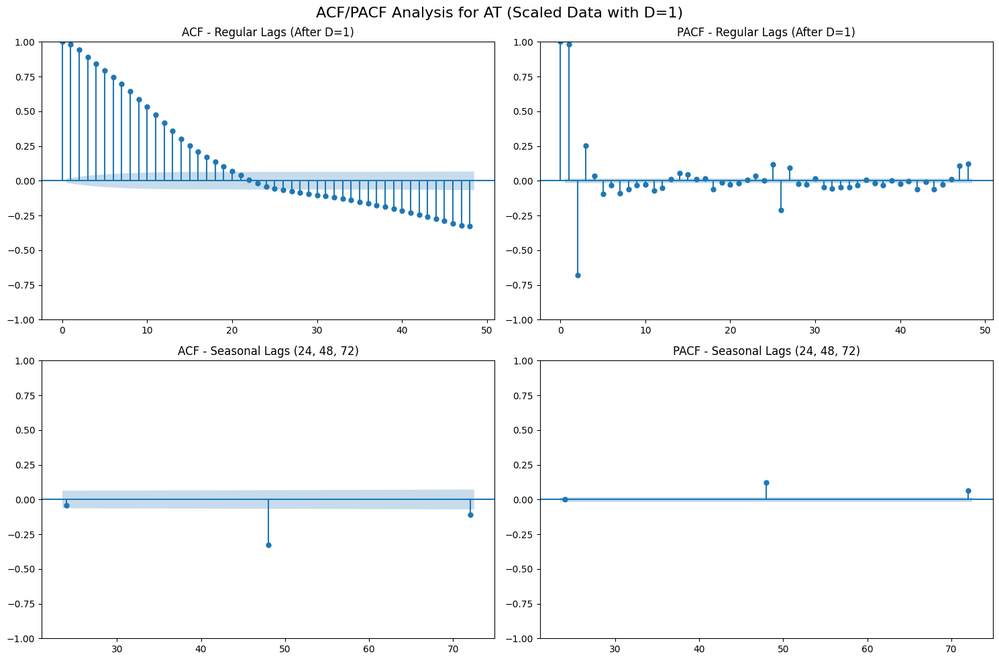

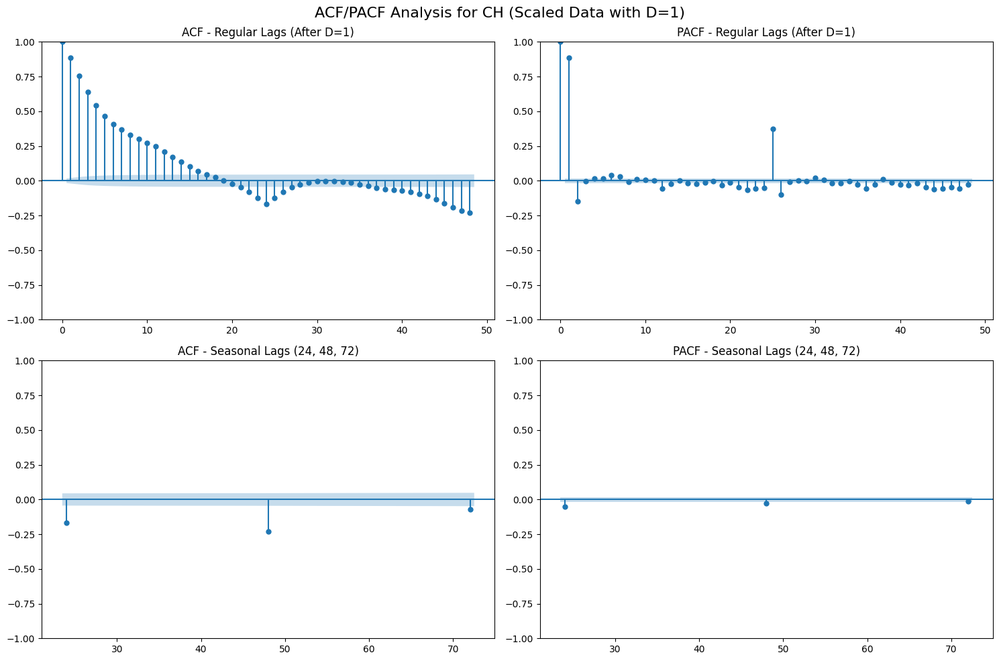

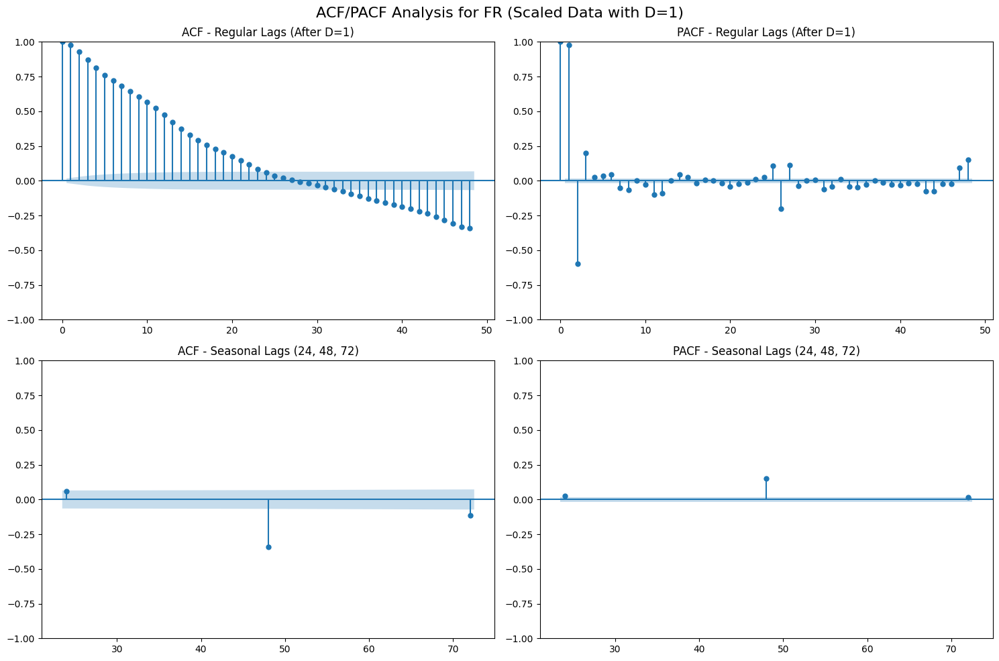

In [26]:
def analyze_scaled_series(scaled_data, country, lags=48):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'ACF/PACF Analysis for {country} (Scaled Data with D=1)', fontsize=16)

    seasonal_diff = scaled_data.diff(24).dropna()

    plot_acf(seasonal_diff, ax=axes[0,0], lags=lags, title=f'ACF - Regular Lags (After D=1)')
    plot_pacf(seasonal_diff, ax=axes[0,1], lags=lags, title=f'PACF - Regular Lags (After D=1)', method='ywm')

    seasonal_lags = [24, 48, 72]

    plot_acf(seasonal_diff, ax=axes[1,0], lags=seasonal_lags, title=f'ACF - Seasonal Lags (24, 48, 72)')
    plot_pacf(seasonal_diff, ax=axes[1,1], lags=seasonal_lags, title=f'PACF - Seasonal Lags (24, 48, 72)', method='ywm')

    plt.tight_layout()
    plt.savefig(f'/content/outputs/{country}_acf_pacf_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    return seasonal_diff

for country in ['AT', 'CH', 'FR']:
    scaled_train = scaled_splits[country]['train']['load_scaled']
    seasonal_diff = analyze_scaled_series(scaled_train, country)

```
From the above:
AT:
p - 0, 1, 2
q - 0 (plot shows gradual decay)
P - 0, 1
Q - 0, 1

CH:
p - 0, 1
q - 0  (plot shows gradual decay)
P - 0, 1
Q - 0, 1

FR:
p - 0, 1, 2
q - 0  (plot shows gradual decay)
P - 0, 1
Q - 0, 1
```

In [19]:
def manual_safe_search(load_data, country):

    all_combinations = list(itertools.product(
        [0, 1, 2],  # p
        [0],         # q
        [0, 1],      # P
        [0, 1]       # Q
    ))

    successful_models = []

    for p, q, P, Q in all_combinations:
        try:
            print(f"Testing SARIMA({p},0,{q})({P},1,{Q})[24]...")
            model = ARIMA(
                order=(p, 0, q),
                seasonal_order=(P, 1, Q, 24)
            )
            fitted_model = model.fit(load_data)

            bic = fitted_model.bic()
            successful_models.append({
                'params': (p, q, P, Q),
                'bic': bic,
                'model': fitted_model
            })
            print(f"  ✅ SUCCESS - BIC: {bic:.2f}")

        except Exception as e:
            print(f"   FAILED - {type(e).__name__}: {e}")
            continue

    if successful_models:
        best_model = min(successful_models, key=lambda x: x['bic'])
        p, q, P, Q = best_model['params']
        print(f"\n {country} - BEST MODEL: SARIMA({p},0,{q})({P},1,{Q})[24]")
        print(f"BIC: {best_model['bic']:.2f}")
        return best_model['model']
    else:
        print(f"\n {country} - All models failed!")
        return None

country = 'AT'
print(f"\n{'='*50}")
print(f"Manual search for {country}")
print(f"{'='*50}")

df = scaled_splits[country]['train']
load_data = df['load_scaled'].values

#model = manual_safe_search(load_data, country)


Manual search for AT


In [ ]:
print('AT SARIMA search crashes at SARIMA(1,0,0)(0,1,1)[24]...')

AT SARIMA search crashes at SARIMA(1,0,0)(0,1,1)[24]...


In [ ]:
def continue_skipping_crash_AT(load_data, country):

    # Format: (p, q, P, Q)
    remaining_combinations = [
        (1, 0, 1, 0),  # SARIMA(1,0,0)(1,1,0)[24]
        (1, 0, 1, 1),  # SARIMA(1,0,0)(1,1,1)[24]
        (2, 0, 0, 0),  # SARIMA(2,0,0)(0,1,0)[24]
        (2, 0, 0, 1),  # SARIMA(2,0,0)(0,1,1)[24]
        (2, 0, 1, 0),  # SARIMA(2,0,0)(1,1,0)[24]
        (2, 0, 1, 1),  # SARIMA(2,0,0)(1,1,1)[24]
    ]

    # successful models so far
    successful_models = [
        ((0, 0, 0, 0), -18532.17),  # SARIMA(0,0,0)(0,1,0)[24]
        ((0, 0, 0, 1), -18597.48),  # SARIMA(0,0,0)(0,1,1)[24]
        ((0, 0, 1, 0), -18545.35),  # SARIMA(0,0,0)(1,1,0)[24]
        ((0, 0, 1, 1), -19114.91),  # SARIMA(0,0,0)(1,1,1)[24]
        ((1, 0, 0, 0), -65769.97),  # SARIMA(1,0,0)(0,1,0)[24]
    ]

    best_bic = min(bic for _, bic in successful_models)
    best_params = successful_models[0][0]

    # Update with actual best
    for params, bic in successful_models:
        if bic < best_bic:
            best_bic = bic
            best_params = params

    print(f"Current best: SARIMA({best_params[0]},0,{best_params[1]})({best_params[2]},1,{best_params[3]})[24] with BIC: {best_bic:.2f}")

    # Test remaining models
    for p, q, P, Q in remaining_combinations:
        try:
            print(f"Testing SARIMA({p},0,{q})({P},1,{Q})[24]...")
            model = ARIMA(
                order=(p, 0, q),
                seasonal_order=(P, 1, Q, 24)
            )
            fitted_model = model.fit(load_data)

            bic = fitted_model.bic()
            successful_models.append(((p, q, P, Q), bic))

            print(f"   SUCCESS - BIC: {bic:.2f}")

            if bic < best_bic:
                best_bic = bic
                best_params = (p, q, P, Q)
                print(f"  NEW BEST!")

        except Exception as e:
            print(f"   FAILED - {type(e).__name__}: {e}")
            continue

    p, q, P, Q = best_params
    print(f"\n {country} - FINAL BEST MODEL: SARIMA({p},0,{q})({P},1,{Q})[24]")
    print(f"BIC: {best_bic:.2f}")

    print(f"\n TOP 5 MODELS:")
    successful_models.sort(key=lambda x: x[1])
    for i, (params, bic) in enumerate(successful_models[:5]):
        p, q, P, Q = params
        print(f"{i+1}. SARIMA({p},0,{q})({P},1,{Q})[24] - BIC: {bic:.2f}")

    return best_params, best_bic

country = 'AT'
print(f"\n{'='*50}")
print(f"Continuing search for {country}")
print(f"{'='*50}")

df = scaled_splits[country]['train']
load_data = df['load_scaled'].values

best_params, best_bic = continue_skipping_crash_AT(load_data, country)


Continuing search for AT


```
AT - FINAL BEST MODEL: SARIMA(2,0,0)(1,1,1)[24]
BIC: -78293.01

 TOP 5 MODELS:
1. SARIMA(2,0,0)(1,1,1)[24] - BIC: -78293.01
2. SARIMA(2,0,0)(0,1,1)[24] - BIC: -77087.12
3. SARIMA(2,0,0)(1,1,0)[24] - BIC: -75044.93
4. SARIMA(2,0,0)(0,1,0)[24] - BIC: -74416.99
5. SARIMA(1,0,0)(1,1,1)[24] - BIC: -70353.09
```

In [ ]:
def manual_safe_search(load_data, country):

    all_combinations = list(itertools.product(
        [0, 1],  # p
        [0],     # q
        [0, 1],  # P
        [0, 1]  # Q
    ))

    successful_models = []

    for p, q, P, Q in all_combinations:
        try:
            print(f"Testing SARIMA({p},0,{q})({P},1,{Q})[24]...")
            model = ARIMA(
                order=(p, 0, q),
                seasonal_order=(P, 1, Q, 24)
            )
            fitted_model = model.fit(load_data)

            bic = fitted_model.bic()
            successful_models.append({
                'params': (p, q, P, Q),
                'bic': bic,
                'model': fitted_model
            })
            print(f"   SUCCESS - BIC: {bic:.2f}")

        except Exception as e:
            print(f"   FAILED - {type(e).__name__}: {e}")
            continue

    if successful_models:
        best_model = min(successful_models, key=lambda x: x['bic'])
        p, q, P, Q = best_model['params']
        print(f"\n {country} - BEST MODEL: SARIMA({p},0,{q})({P},1,{Q})[24]")
        print(f"BIC: {best_model['bic']:.2f}")
        return best_model['model']
    else:
        print(f"\n {country} - All models failed!")
        return None

country = 'CH'
print(f"\n{'='*50}")
print(f"Manual search for {country}")
print(f"{'='*50}")

df = scaled_splits[country]['train']
load_data = df['load_scaled'].values

#model = manual_safe_search(load_data, country)


Manual search for CH


In [ ]:
print('CH Crashed - SARIMA(0,0,0)(1,1,0)[24]')

CH Crashed - SARIMA(0,0,0)(1,1,0)[24]


In [ ]:
def continue_skipping_crash_CH(load_data, country):

    # Remaining models to test
    remaining_combinations = [
        (0, 0, 1, 1),  # SARIMA(0,0,0)(1,1,1)[24]
        (1, 0, 0, 0),  # SARIMA(1,0,0)(0,1,0)[24]
        (1, 0, 0, 1),  # SARIMA(1,0,0)(0,1,1)[24]
        (1, 0, 1, 0),  # SARIMA(1,0,0)(1,1,0)[24]
        (1, 0, 1, 1),  # SARIMA(1,0,0)(1,1,1)[24]
    ]

    # Include already successful models
    successful_models = [
        ((0, 0, 0, 0), -26704.43),  # SARIMA(0,0,0)(0,1,0)[24]
        ((0, 0, 0, 1), -28222.15),  # SARIMA(0,0,0)(0,1,1)[24]
    ]

    best_bic = min(bic for _, bic in successful_models)
    best_params = successful_models[0][0]  # Initialize with first model

    for params, bic in successful_models:
        if bic < best_bic:
            best_bic = bic
            best_params = params

    p, q, P, Q = best_params
    print(f"Current best: SARIMA({p},0,{q})({P},1,{Q})[24] with BIC: {best_bic:.2f}")

    for p, q, P, Q in remaining_combinations:
        try:
            print(f"Testing SARIMA({p},0,{q})({P},1,{Q})[24]...")
            model = ARIMA(
                order=(p, 0, q),
                seasonal_order=(P, 1, Q, 24)
            )
            fitted_model = model.fit(load_data)

            bic = fitted_model.bic()
            successful_models.append(((p, q, P, Q), bic))

            print(f"   SUCCESS - BIC: {bic:.2f}")

            if bic < best_bic:
                best_bic = bic
                best_params = (p, q, P, Q)
                print(f"   NEW BEST!")

        except Exception as e:
            print(f"   FAILED")
            continue

    p, q, P, Q = best_params
    print(f"\n {country} - FINAL BEST MODEL: SARIMA({p},0,{q})({P},1,{Q})[24]")
    print(f"BIC: {best_bic:.2f}")

    print(f"\n TOP 5 MODELS:")
    successful_models.sort(key=lambda x: x[1])
    for i, (params, bic) in enumerate(successful_models[:5]):
        p, q, P, Q = params
        print(f"{i+1}. SARIMA({p},0,{q})({P},1,{Q})[24] - BIC: {bic:.2f}")

    return best_params, best_bic

country = 'CH'
print(f"\n{'='*50}")
print(f"Continuing search for {country}")
print(f"{'='*50}")

df = scaled_splits[country]['train']
load_data = df['load_scaled'].values

best_params, best_bic = continue_skipping_crash_CH(load_data, country)


Continuing search for CH


```

 CH - FINAL BEST MODEL: SARIMA(1,0,0)(1,1,1)[24]
BIC: -54753.93

 TOP 5 MODELS:
1. SARIMA(1,0,0)(1,1,1)[24] - BIC: -54753.93
2. SARIMA(1,0,0)(0,1,1)[24] - BIC: -54437.35
3. SARIMA(1,0,0)(1,1,0)[24] - BIC: -50640.88
4. SARIMA(1,0,0)(0,1,0)[24] - BIC: -48470.55
5. SARIMA(0,0,0)(1,1,1)[24] - BIC: -30027.35
```

In [ ]:
def manual_safe_search(load_data, country):

    all_combinations = list(itertools.product(
        [0, 1, 2],  # p
        [0],         # q
        [0, 1],      # P
        [0, 1]       # Q
    ))

    successful_models = []

    for p, q, P, Q in all_combinations:
        try:
            print(f"Testing SARIMA({p},0,{q})({P},1,{Q})[24]...")
            model = ARIMA(
                order=(p, 0, q),
                seasonal_order=(P, 1, Q, 24)
            )
            fitted_model = model.fit(load_data)

            bic = fitted_model.bic()
            successful_models.append({
                'params': (p, q, P, Q),
                'bic': bic,
                'model': fitted_model
            })
            print(f"   SUCCESS - BIC: {bic:.2f}")

        except Exception as e:
            print(f"   FAILED - {type(e).__name__}: {e}")
            continue

    if successful_models:
        best_model = min(successful_models, key=lambda x: x['bic'])
        p, q, P, Q = best_model['params']
        print(f"\n {country} - BEST MODEL: SARIMA({p},0,{q})({P},1,{Q})[24]")
        print(f"BIC: {best_model['bic']:.2f}")
        return best_model['model']
    else:
        print(f"\n {country} - All models failed!")
        return None

country = 'FR'
print(f"\n{'='*50}")
print(f"Manual search for {country}")
print(f"{'='*50}")

df = scaled_splits[country]['train']
load_data = df['load_scaled'].values

#model = manual_safe_search(load_data, country)


Manual search for FR


In [ ]:
print('FR crashed testing SARIMA(0,0,0)(1,1,1)[24]...')

FR crashed testing SARIMA(0,0,0)(1,1,1)[24]...


In [20]:
def continue_skipping_crash_FR(load_data, country):

    # All remaining models to test
    remaining_combinations = [
        (0, 0, 1, 0),  # SARIMA(0,0,0)(1,1,0)[24]
        (0, 0, 1, 1),  # SARIMA(0,0,0)(1,1,1)[24]
        (1, 0, 0, 0),  # SARIMA(1,0,0)(0,1,0)[24]
        (1, 0, 0, 1),  # SARIMA(1,0,0)(0,1,1)[24]
        (1, 0, 1, 0),  # SARIMA(1,0,0)(1,1,0)[24]
        (1, 0, 1, 1),  # SARIMA(1,0,0)(1,1,1)[24]
        (2, 0, 0, 0),  # SARIMA(2,0,0)(0,1,0)[24]
        (2, 0, 0, 1),  # SARIMA(2,0,0)(0,1,1)[24]
        (2, 0, 1, 0),  # SARIMA(2,0,0)(1,1,0)[24]
        (2, 0, 1, 1),  # SARIMA(2,0,0)(1,1,1)[24]
    ]

    # Include already successful models
    successful_models = [
        ((0, 0, 0, 0), -30296.66),  # SARIMA(0,0,0)(0,1,0)[24]
        ((0, 0, 0, 1), -30422.16),  # SARIMA(0,0,0)(0,1,1)[24]
    ]

    best_bic = min(bic for _, bic in successful_models)
    best_params = successful_models[0][0]

    for params, bic in successful_models:
        if bic < best_bic:
            best_bic = bic
            best_params = params

    p, q, P, Q = best_params
    print(f"Current best: SARIMA({p},0,{q})({P},1,{Q})[24] with BIC: {best_bic:.2f}")
    print(f"All models successful so far for FR! Continuing with remaining {len(remaining_combinations)} models...")

    for p, q, P, Q in remaining_combinations:
        try:
            print(f"Testing SARIMA({p},0,{q})({P},1,{Q})[24]...")
            model = ARIMA(
                order=(p, 0, q),
                seasonal_order=(P, 1, Q, 24)
            )
            fitted_model = model.fit(load_data)

            bic = fitted_model.bic()
            successful_models.append(((p, q, P, Q), bic))

            print(f"   SUCCESS - BIC: {bic:.2f}")

            if bic < best_bic:
                best_bic = bic
                best_params = (p, q, P, Q)
                print(f"   NEW BEST!")

        except Exception as e:
            print(f"   FAILED - {type(e).__name__}: {e}")
            continue

    p, q, P, Q = best_params
    print(f"\n {country} - FINAL BEST MODEL: SARIMA({p},0,{q})({P},1,{Q})[24]")
    print(f"BIC: {best_bic:.2f}")

    print(f"\n TOP 5 MODELS:")
    successful_models.sort(key=lambda x: x[1])
    for i, (params, bic) in enumerate(successful_models[:5]):
        p, q, P, Q = params
        print(f"{i+1}. SARIMA({p},0,{q})({P},1,{Q})[24] - BIC: {bic:.2f}")

    return best_params, best_bic

=country = 'FR'
print(f"\n{'='*50}")
print(f"Continuing search for {country}")
print(f"{'='*50}")

df = scaled_splits[country]['train']
load_data = df['load_scaled'].values

best_params, best_bic = continue_skipping_crash_FR(load_data, country)


Continuing search for FR


```
 FR - FINAL BEST MODEL: SARIMA(2,0,0)(1,1,1)[24]
BIC: -82020.35

 TOP 5 MODELS:
1. SARIMA(2,0,0)(1,1,1)[24] - BIC: -82020.35
2. SARIMA(2,0,0)(0,1,1)[24] - BIC: -81106.78
3. SARIMA(2,0,0)(1,1,0)[24] - BIC: -80288.65
4. SARIMA(2,0,0)(0,1,0)[24] - BIC: -79732.27
5. SARIMA(1,0,0)(1,1,1)[24] - BIC: -75924.16
```

In [27]:
best_models = {
    'AT': {
        'order': (2, 0, 0),  # (p, d, q)
        'seasonal_order': (1, 1, 1, 24),  # (P, D, Q, s)
        'bic': -78293.01
    },
    'CH': {
        'order': (1, 0, 0),
        'seasonal_order': (1, 1, 1, 24),
        'bic': -54753.93
    },
    'FR': {
        'order': (2, 0, 0),
        'seasonal_order': (1, 1, 1, 24),
        'bic': -82020.35
    }
}

print("Best models stored:")
for country, model_info in best_models.items():
    print(f"{country}: SARIMA{model_info['order']}{model_info['seasonal_order']} - BIC: {model_info['bic']}")

Best models stored:
AT: SARIMA(2, 0, 0)(1, 1, 1, 24) - BIC: -78293.01
CH: SARIMA(1, 0, 0)(1, 1, 1, 24) - BIC: -54753.93
FR: SARIMA(2, 0, 0)(1, 1, 1, 24) - BIC: -82020.35


**WARNING**
Below backtesting took 9 hours to run

In [28]:
def mase_custom(y_true, y_pred, y_train, seasonality=24):
    """Calculate MASE (Mean Absolute Scaled Error)"""
    naive_errors = np.abs(y_train[seasonality:] - y_train[:-seasonality])
    mean_naive_error = np.mean(naive_errors)
    forecast_errors = np.abs(y_true - y_pred)
    return np.mean(forecast_errors) / mean_naive_error if mean_naive_error != 0 else np.mean(forecast_errors)

def smape(y_true, y_pred):
    """Calculate sMAPE (Symmetric Mean Absolute Percentage Error)"""
    denominator = (np.abs(y_true) + np.abs(y_pred))
    # Avoid division by zero
    denominator = np.where(denominator == 0, 1, denominator)
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / denominator)

def calculate_coverage(y_true, lower, upper):
    """Calculate prediction interval coverage"""
    if lower is None or upper is None:
        return None
    return np.mean((y_true >= lower) & (y_true <= upper))

def calculate_all_metrics(y_true, y_pred, y_train, lower=None, upper=None):
    mask = ~np.isnan(y_pred) & ~np.isnan(y_true)
    if np.sum(mask) == 0:
        return {metric: np.nan for metric in ['mase', 'smape', 'mse', 'rmse', 'mape', 'coverage']}

    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]

    return {
        'mase': mase_custom(y_true_clean, y_pred_clean, y_train, 24),
        'smape': smape(y_true_clean, y_pred_clean),
        'mse': mean_squared_error(y_true_clean, y_pred_clean),
        'rmse': np.sqrt(mean_squared_error(y_true_clean, y_pred_clean)),
        'mape': 100 * np.mean(np.abs((y_true_clean - y_pred_clean) / y_true_clean)),
        'coverage': calculate_coverage(y_true_clean, lower[mask], upper[mask]) if lower is not None else None
    }


In [ ]:
def expanding_window_backtest_memory_optimized(country, train_data, val_data, test_data, order, seasonal_order,
                                             horizon=24, stride=24, warm_up_days=60):

    train_load = train_data['load_scaled'].values
    val_load = val_data['load_scaled'].values
    test_load = test_data['load_scaled'].values

    train_timestamps = train_data['timestamp'].values
    val_timestamps = val_data['timestamp'].values
    test_timestamps = test_data['timestamp'].values

    val_size = ((len(val_data) - horizon) // stride + 1) * horizon
    test_size = ((len(test_data) - horizon) // stride + 1) * horizon

    # Initialize pre-allocated arrays
    val_results = {
        'timestamps': np.empty(val_size, dtype=object),
        'true': np.empty(val_size, dtype=np.float64),
        'forecasts': np.empty(val_size, dtype=np.float64),
        'lower': np.empty(val_size, dtype=np.float64),
        'upper': np.empty(val_size, dtype=np.float64),
        'horizon': np.empty(val_size, dtype=np.int32),
        'train_end': np.empty(val_size, dtype=object)
    }

    test_results = {
        'timestamps': np.empty(test_size, dtype=object),
        'true': np.empty(test_size, dtype=np.float64),
        'forecasts': np.empty(test_size, dtype=np.float64),
        'lower': np.empty(test_size, dtype=np.float64),
        'upper': np.empty(test_size, dtype=np.float64),
        'horizon': np.empty(test_size, dtype=np.int32),
        'train_end': np.empty(test_size, dtype=object)
    }

    print(f"Starting memory-optimized backtest for {country}...")

    # DEV SET BACKTEST - Using incremental training data
    print("  Backtesting on validation set...")
    current_train_load = train_load.copy()
    val_start_idx = 0
    val_result_idx = 0

    while val_start_idx + horizon <= len(val_data):
        try:
            model = SARIMAX(
                current_train_load,
                order=order,
                seasonal_order=seasonal_order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            fitted_model = model.fit(
                disp=False,
                method='lbfgs',
                maxiter=50,
                start_params=None,
                cov_type=None
            )

            forecast_result = fitted_model.get_forecast(steps=horizon)
            forecast_mean = forecast_result.predicted_mean
            forecast_ci = forecast_result.conf_int(alpha=0.2)

            start_idx = val_result_idx
            end_idx = val_result_idx + horizon

            val_results['timestamps'][start_idx:end_idx] = val_timestamps[val_start_idx:val_start_idx+horizon]
            val_results['true'][start_idx:end_idx] = val_load[val_start_idx:val_start_idx+horizon]
            val_results['forecasts'][start_idx:end_idx] = forecast_mean
            val_results['lower'][start_idx:end_idx] = forecast_ci[:, 0]
            val_results['upper'][start_idx:end_idx] = forecast_ci[:, 1]
            val_results['horizon'][start_idx:end_idx] = np.arange(1, horizon + 1)
            val_results['train_end'][start_idx:end_idx] = train_timestamps[-1]

            val_result_idx = end_idx

        except Exception as e:
            print(f"    Error at step {val_start_idx}: {e}")
            start_idx = val_result_idx
            end_idx = val_result_idx + horizon

            val_results['timestamps'][start_idx:end_idx] = val_timestamps[val_start_idx:val_start_idx+horizon]
            val_results['true'][start_idx:end_idx] = val_load[val_start_idx:val_start_idx+horizon]
            val_results['forecasts'][start_idx:end_idx] = np.nan
            val_results['lower'][start_idx:end_idx] = np.nan
            val_results['upper'][start_idx:end_idx] = np.nan
            val_results['horizon'][start_idx:end_idx] = np.arange(1, horizon + 1)
            val_results['train_end'][start_idx:end_idx] = train_timestamps[-1]

            val_result_idx = end_idx

        if val_start_idx + stride <= len(val_data):
            new_data = val_load[val_start_idx:val_start_idx + stride]
            current_train_load = np.concatenate([current_train_load, new_data])

        val_start_idx += stride

        if val_start_idx % (stride * 10) == 0:
            gc.collect()

    val_results = {k: v[:val_result_idx] for k, v in val_results.items()}

    # TEST SET BACKTEST
    print("  Backtesting on test set...")
    full_train_load = np.concatenate([train_load, val_load])
    current_train_load = full_train_load.copy()
    test_start_idx = 0
    test_result_idx = 0

    while test_start_idx + horizon <= len(test_data):
        try:
            model = SARIMAX(
                current_train_load,
                order=order,
                seasonal_order=seasonal_order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            fitted_model = model.fit(
                disp=False,
                method='lbfgs',
                maxiter=50,
                start_params=None,
                cov_type=None
            )

            forecast_result = fitted_model.get_forecast(steps=horizon)
            forecast_mean = forecast_result.predicted_mean
            forecast_ci = forecast_result.conf_int(alpha=0.2)

            start_idx = test_result_idx
            end_idx = test_result_idx + horizon

            test_results['timestamps'][start_idx:end_idx] = test_timestamps[test_start_idx:test_start_idx+horizon]
            test_results['true'][start_idx:end_idx] = test_load[test_start_idx:test_start_idx+horizon]
            test_results['forecasts'][start_idx:end_idx] = forecast_mean
            test_results['lower'][start_idx:end_idx] = forecast_ci[:, 0]
            test_results['upper'][start_idx:end_idx] = forecast_ci[:, 1]
            test_results['horizon'][start_idx:end_idx] = np.arange(1, horizon + 1)
            test_results['train_end'][start_idx:end_idx] = val_timestamps[-1]

            test_result_idx = end_idx

        except Exception as e:
            print(f"    Error at test step {test_start_idx}: {e}")
            start_idx = test_result_idx
            end_idx = test_result_idx + horizon

            test_results['timestamps'][start_idx:end_idx] = test_timestamps[test_start_idx:test_start_idx+horizon]
            test_results['true'][start_idx:end_idx] = test_load[test_start_idx:test_start_idx+horizon]
            test_results['forecasts'][start_idx:end_idx] = np.nan
            test_results['lower'][start_idx:end_idx] = np.nan
            test_results['upper'][start_idx:end_idx] = np.nan
            test_results['horizon'][start_idx:end_idx] = np.arange(1, horizon + 1)
            test_results['train_end'][start_idx:end_idx] = val_timestamps[-1]

            test_result_idx = end_idx

        if test_start_idx + stride <= len(test_data):
            new_data = test_load[test_start_idx:test_start_idx + stride]
            current_train_load = np.concatenate([current_train_load, new_data])

        test_start_idx += stride

        if test_start_idx % (stride * 10) == 0:
            gc.collect()

    test_results = {k: v[:test_result_idx] for k, v in test_results.items()}

    val_metrics = calculate_all_metrics(
        val_results['true'], val_results['forecasts'], train_load,
        val_results['lower'], val_results['upper']
    )

    test_metrics = calculate_all_metrics(
        test_results['true'], test_results['forecasts'], full_train_load,
        test_results['lower'], test_results['upper']
    )

    gc.collect()

    return {
        'val': {**val_results, 'metrics': val_metrics},
        'test': {**test_results, 'metrics': test_metrics}
    }


# Store the best SARIMA models for each country
best_models = {
    'AT': {'order': (2, 0, 0), 'seasonal_order': (1, 1, 1, 24), 'bic': -78293.01},
    'CH': {'order': (1, 0, 0), 'seasonal_order': (1, 1, 1, 24), 'bic': -54753.93},
    'FR': {'order': (2, 0, 0), 'seasonal_order': (1, 1, 1, 24), 'bic': -82020.35}
}

backtest_results = {}

countries = ['AT', 'CH', 'FR']
for country in countries:
    print(f"\n{'='*50}")
    print(f"BACKTESTING FOR {country}")
    print(f"{'='*50}")

    train_data = scaled_splits[country]['train']
    val_data = scaled_splits[country]['val']
    test_data = scaled_splits[country]['test']

    results = expanding_window_backtest_memory_optimized(
        country=country,
        train_data=train_data,
        val_data=val_data,
        test_data=test_data,
        order=best_models[country]['order'],
        seasonal_order=best_models[country]['seasonal_order'],
        horizon=24,
        stride=24,
        warm_up_days=60
    )

    backtest_results[country] = results

    print(f"\n{country} Validation Metrics:")
    for metric, value in results['val']['metrics'].items():
        if value is not None:
            print(f"  {metric.upper()}: {value:.4f}")

    print(f"\n{country} Test Metrics:")
    for metric, value in results['test']['metrics'].items():
        if value is not None:
            print(f"  {metric.upper()}: {value:.4f}")

print("\nMemory-optimized backtesting completed!")


BACKTESTING FOR AT
Starting memory-optimized backtest for AT...
  Backtesting on validation set...
  Backtesting on test set...

AT Validation Metrics:
  MASE: 0.8684
  SMAPE: 23.9613
  MSE: 0.0099
  RMSE: 0.0997
  MAPE: 51.9225
  COVERAGE: 0.8076

AT Test Metrics:
  MASE: 0.8205
  SMAPE: 22.1534
  MSE: 0.0084
  RMSE: 0.0914
  MAPE: 30.1239
  COVERAGE: 0.7928

BACKTESTING FOR CH
Starting memory-optimized backtest for CH...
  Backtesting on validation set...
  Backtesting on test set...

CH Validation Metrics:
  MASE: 0.7236
  SMAPE: 11.8664
  MSE: 0.0041
  RMSE: 0.0641
  MAPE: 12.7418
  COVERAGE: 0.8744

CH Test Metrics:
  MASE: 0.7935
  SMAPE: 12.7426
  MSE: 0.0049
  RMSE: 0.0699
  MAPE: 13.4413
  COVERAGE: 0.8390

BACKTESTING FOR FR
Starting memory-optimized backtest for FR...
  Backtesting on validation set...
  Backtesting on test set...

FR Validation Metrics:
  MASE: 0.8300
  SMAPE: 29.9657
  MSE: 0.0072
  RMSE: 0.0848
  MAPE: 45.9389
  COVERAGE: 0.8533

FR Test Metrics:
  MASE:

```

==================================================
BACKTESTING FOR AT
==================================================
Starting memory-optimized backtest for AT...
  Backtesting on validation set...
  Backtesting on test set...

AT Validation Metrics:
  MASE: 0.8684
  SMAPE: 23.9613
  MSE: 0.0099
  RMSE: 0.0997
  MAPE: 51.9225
  COVERAGE: 0.8076

AT Test Metrics:
  MASE: 0.8205
  SMAPE: 22.1534
  MSE: 0.0084
  RMSE: 0.0914
  MAPE: 30.1239
  COVERAGE: 0.7928

==================================================
BACKTESTING FOR CH
==================================================
Starting memory-optimized backtest for CH...
  Backtesting on validation set...
  Backtesting on test set...

CH Validation Metrics:
  MASE: 0.7236
  SMAPE: 11.8664
  MSE: 0.0041
  RMSE: 0.0641
  MAPE: 12.7418
  COVERAGE: 0.8744

CH Test Metrics:
  MASE: 0.7935
  SMAPE: 12.7426
  MSE: 0.0049
  RMSE: 0.0699
  MAPE: 13.4413
  COVERAGE: 0.8390

==================================================
BACKTESTING FOR FR
==================================================
Starting memory-optimized backtest for FR...
  Backtesting on validation set...
  Backtesting on test set...

FR Validation Metrics:
  MASE: 0.8300
  SMAPE: 29.9657
  MSE: 0.0072
  RMSE: 0.0848
  MAPE: 45.9389
  COVERAGE: 0.8533

FR Test Metrics:
  MASE: 0.6922
  SMAPE: 22.7590
  MSE: 0.0029
  RMSE: 0.0537
  MAPE: 42.2216
  COVERAGE: 0.8801

Memory-optimized backtesting completed!
```

In [ ]:
os.makedirs('/content/outputs', exist_ok=True)

def save_forecasts_to_csv(backtest_results, countries):

    for country in countries:
        if country in backtest_results:
            # Save validation forecasts
            val_df = pd.DataFrame({
                'timestamp': backtest_results[country]['val']['timestamps'],
                'y_true': backtest_results[country]['val']['true'],
                'yhat': backtest_results[country]['val']['forecasts'],
                'lo': backtest_results[country]['val']['lower'],
                'hi': backtest_results[country]['val']['upper'],
                'horizon': backtest_results[country]['val']['horizon'],
                'train_end': backtest_results[country]['val']['train_end']
            })
            val_df.to_csv(f'/content/outputs/{country}_SARIMA_forecasts_dev.csv', index=False)

            # Save test forecasts
            test_df = pd.DataFrame({
                'timestamp': backtest_results[country]['test']['timestamps'],
                'y_true': backtest_results[country]['test']['true'],
                'yhat': backtest_results[country]['test']['forecasts'],
                'lo': backtest_results[country]['test']['lower'],
                'hi': backtest_results[country]['test']['upper'],
                'horizon': backtest_results[country]['test']['horizon'],
                'train_end': backtest_results[country]['test']['train_end']
            })
            test_df.to_csv(f'/content/outputs/{country}_SARIMA_forecasts_test.csv', index=False)

            print(f"Saved forecasts for {country}")

save_forecasts_to_csv(backtest_results, countries)

Saved forecasts for AT
Saved forecasts for CH
Saved forecasts for FR


In [31]:
summary_data = []
for country in countries:
    if country in backtest_results:
        val_metrics = backtest_results[country]['val']['metrics']
        test_metrics = backtest_results[country]['test']['metrics']

        summary_data.append({
            'Country': country,
            'Val_MASE': val_metrics['mase'],
            'Test_MASE': test_metrics['mase'],
            'Val_sMAPE': val_metrics['smape'],
            'Test_sMAPE': test_metrics['smape'],
            'Val_RMSE': val_metrics['rmse'],
            'Test_RMSE': test_metrics['rmse'],
            'Val_MAPE': val_metrics['mape'],
            'Test_MAPE': test_metrics['mape'],
            'Val_Coverage': val_metrics['coverage'],
            'Test_Coverage': test_metrics['coverage']
        })

summary_df = pd.DataFrame(summary_data)
print("\nSUMMARY TABLE ACROSS COUNTRIES:")
print(summary_df.round(4))

summary_df.to_csv('/content/outputs/SARIMA_forecast_summary.csv', index=False)

'summary_df = pd.DataFrame(summary_data)\nprint("\nSUMMARY TABLE ACROSS COUNTRIES:")\nprint(summary_df.round(4))\n'

```

SARIMA SUMMARY TABLE ACROSS COUNTRIES:
  Country  Val_MASE  Test_MASE  Val_sMAPE  Test_sMAPE  Val_RMSE  Test_RMSE  \
0      AT    0.8684     0.8205    23.9613     22.1534    0.0997     0.0914   
1      CH    0.7236     0.7935    11.8664     12.7426    0.0641     0.0699   
2      FR    0.8300     0.6922    29.9657     22.7590    0.0848     0.0537   

   Val_MAPE  Test_MAPE  Val_Coverage  Test_Coverage  
0   51.9225    30.1239        0.8076         0.7928  
1   12.7418    13.4413        0.8744         0.8390  
2   45.9389    42.2216        0.8533         0.8801  
```

GRU


In [32]:
def create_sequences(data, sequence_length=168, horizon=24):
    X, y = [], []
    for i in range(len(data) - sequence_length - horizon + 1):
        X.append(data[i:(i + sequence_length)])
        y.append(data[(i + sequence_length):(i + sequence_length + horizon)])
    return np.array(X), np.array(y)

def mase_custom(y_true, y_pred, y_train, seasonality=24):
    naive_errors = np.abs(y_train[seasonality:] - y_train[:-seasonality])
    mean_naive_error = np.mean(naive_errors)
    forecast_errors = np.abs(y_true - y_pred)
    return np.mean(forecast_errors) / mean_naive_error if mean_naive_error != 0 else np.mean(forecast_errors)

def smape(y_true, y_pred):
    denominator = (np.abs(y_true) + np.abs(y_pred))
    denominator = np.where(denominator == 0, 1, denominator)
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / denominator)

def calculate_all_metrics(y_true, y_pred, y_train):
    mask = ~np.isnan(y_pred) & ~np.isnan(y_true)
    if np.sum(mask) == 0:
        return {metric: np.nan for metric in ['mase', 'smape', 'mse', 'rmse', 'mape']}

    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]

    return {
        'mase': mase_custom(y_true_clean, y_pred_clean, y_train, 24),
        'smape': smape(y_true_clean, y_pred_clean),
        'mse': mean_squared_error(y_true_clean, y_pred_clean),
        'rmse': np.sqrt(mean_squared_error(y_true_clean, y_pred_clean)),
        'mape': 100 * np.mean(np.abs((y_true_clean - y_pred_clean) / y_true_clean))
    }

In [33]:
country_configs = {
    'AT': {
        'sequence_length': 168,
        'gru_units': [64, 32],
        'dropout_rate': 0.2,
        'batch_size': 64,
        'learning_rate': 0.001
    },
    'CH': {
        'sequence_length': 168,
        'gru_units': [32, 16],
        'dropout_rate': 0.2,
        'batch_size': 64,
        'learning_rate': 0.001
    },
    'FR': {
        'sequence_length': 168,
        'gru_units': [64, 32],
        'dropout_rate': 0.2,
        'batch_size': 64,
        'learning_rate': 0.001
    }
}

def build_gru_model(sequence_length, gru_units=[64, 32], dropout_rate=0.2, learning_rate=0.001):
    model = Sequential()

    # First GRU layer
    model.add(GRU(gru_units[0], return_sequences=len(gru_units) > 1,
                  input_shape=(sequence_length, 1)))
    model.add(Dropout(dropout_rate))

    # Additional GRU layers (if needed)
    for i, units in enumerate(gru_units[1:]):
        return_sequences = i < len(gru_units[1:]) - 1
        model.add(GRU(units, return_sequences=return_sequences))
        model.add(Dropout(dropout_rate))

    # Output layer for 24-hour forecast
    model.add(Dense(24))

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='mse', metrics=['mae'])
    return model

In [30]:
class ModelManager:
    """Manages model training and memory efficiently"""
    def __init__(self, max_models=5):
        self.max_models = max_models
        self.trained_models = []

    def train_model(self, country, X_train, y_train, X_val, y_val, config):
        print(f"Training GRU model for {country}...")

        model = build_gru_model(
            sequence_length=config['sequence_length'],
            gru_units=config['gru_units'],
            dropout_rate=config['dropout_rate'],
            learning_rate=config['learning_rate']
        )

        callbacks = [
            EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
            ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-6, verbose=1)
        ]

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=30,
            batch_size=config['batch_size'],
            callbacks=callbacks,
            verbose=1
        )

        model_weights = model.get_weights()
        model_info = {
            'country': country,
            'weights': model_weights,
            'config': config,
            'val_loss': min(history.history['val_loss'])
        }

        self.trained_models.append(model_info)
        self.trained_models.sort(key=lambda x: x['val_loss'])

        # Keep only best models
        if len(self.trained_models) > self.max_models:
            self.trained_models = self.trained_models[:self.max_models]

        del model
        tf.keras.backend.clear_session()
        gc.collect()

        return model_weights, history.history

    def load_model(self, model_info):
        model = build_gru_model(
            sequence_length=model_info['config']['sequence_length'],
            gru_units=model_info['config']['gru_units'],
            dropout_rate=model_info['config']['dropout_rate'],
            learning_rate=model_info['config']['learning_rate']
        )
        model.set_weights(model_info['weights'])
        return model

model_manager = ModelManager(max_models=5)

In [31]:
def gru_direct_forecast_backtest(country, train_data, val_data, test_data, config,
                                 horizon=24, stride=24, target_column='load_scaled'):
    print(f"Starting direct GRU forecasting for {country}...")

    train_load = train_data[target_column].values
    val_load = val_data[target_column].values
    test_load = test_data[target_column].values

    train_timestamps = train_data['timestamp'].values
    val_timestamps = val_data['timestamp'].values
    test_timestamps = test_data['timestamp'].values

    def initialize_results_dict(data_length, timestamps):
        size = ((data_length - horizon) // stride + 1) * horizon
        return {
            'timestamps': np.empty(size, dtype=object),
            'true': np.empty(size, dtype=np.float64),
            'forecasts': np.empty(size, dtype=np.float64),
            'horizon': np.empty(size, dtype=np.int32),
            'train_end': np.empty(size, dtype=object)
        }

    val_results = initialize_results_dict(len(val_data), val_timestamps)
    test_results = initialize_results_dict(len(test_data), test_timestamps)

    print("Training initial model...")
    X_train_full, y_train_full = create_sequences(train_load, config['sequence_length'], horizon)
    X_train_full = X_train_full.reshape((X_train_full.shape[0], config['sequence_length'], 1))

    recent_samples = min(90 * 24, len(X_train_full))
    X_train_recent = X_train_full[-recent_samples:]
    y_train_recent = y_train_full[-recent_samples:]

    model_weights, _ = model_manager.train_model(
        country, X_train_recent, y_train_recent, X_train_recent, y_train_recent, config
    )

    print("Forecasting on validation set...")
    current_train_data = train_load.copy()
    val_result_idx = 0

    for val_start in range(0, len(val_data) - horizon + 1, stride):
        try:
            # Reconstruct model
            model = build_gru_model(
                sequence_length=config['sequence_length'],
                gru_units=config['gru_units'],
                dropout_rate=config['dropout_rate'],
                learning_rate=config['learning_rate']
            )
            model.set_weights(model_weights)

            if len(current_train_data) >= config['sequence_length']:
                input_sequence = current_train_data[-config['sequence_length']:]
                input_sequence = input_sequence.reshape((1, config['sequence_length'], 1))

                forecast = model.predict(input_sequence, verbose=0)[0]
            else:
                forecast = np.full(horizon, np.nan)

            end_idx = val_result_idx + horizon
            val_results['timestamps'][val_result_idx:end_idx] = val_timestamps[val_start:val_start+horizon]
            val_results['true'][val_result_idx:end_idx] = val_load[val_start:val_start+horizon]
            val_results['forecasts'][val_result_idx:end_idx] = forecast
            val_results['horizon'][val_result_idx:end_idx] = np.arange(1, horizon + 1)
            val_results['train_end'][val_result_idx:end_idx] = train_timestamps[-1]

            val_result_idx = end_idx

            # Update training data
            if val_start + stride <= len(val_data):
                current_train_data = np.concatenate([
                    current_train_data,
                    val_load[val_start:val_start + stride]
                ])

            del model
            if val_start % (stride * 10) == 0:
                tf.keras.backend.clear_session()
                gc.collect()

        except Exception as e:
            print(f"Error at validation step {val_start}: {e}")
            end_idx = val_result_idx + horizon
            val_results['forecasts'][val_result_idx:end_idx] = np.nan
            val_result_idx = end_idx

    val_results = {k: v[:val_result_idx] for k, v in val_results.items()}

    print("Forecasting on test set...")
    full_train_data = np.concatenate([train_load, val_load])
    current_test_data = full_train_data.copy()
    test_result_idx = 0

    # Retrain on full data (train + validation)
    X_full, y_full = create_sequences(full_train_data, config['sequence_length'], horizon)
    X_full = X_full.reshape((X_full.shape[0], config['sequence_length'], 1))

    recent_samples = min(90 * 24, len(X_full))
    model_weights, _ = model_manager.train_model(
        country, X_full[-recent_samples:], y_full[-recent_samples:],
        X_full[-recent_samples:], y_full[-recent_samples:], config
    )

    for test_start in range(0, len(test_data) - horizon + 1, stride):
        try:
            model = build_gru_model(
                sequence_length=config['sequence_length'],
                gru_units=config['gru_units'],
                dropout_rate=config['dropout_rate'],
                learning_rate=config['learning_rate']
            )
            model.set_weights(model_weights)

            if len(current_test_data) >= config['sequence_length']:
                input_sequence = current_test_data[-config['sequence_length']:]
                input_sequence = input_sequence.reshape((1, config['sequence_length'], 1))

                forecast = model.predict(input_sequence, verbose=0)[0]
            else:
                forecast = np.full(horizon, np.nan)

            end_idx = test_result_idx + horizon
            test_results['timestamps'][test_result_idx:end_idx] = test_timestamps[test_start:test_start+horizon]
            test_results['true'][test_result_idx:end_idx] = test_load[test_start:test_start+horizon]
            test_results['forecasts'][test_result_idx:end_idx] = forecast
            test_results['horizon'][test_result_idx:end_idx] = np.arange(1, horizon + 1)
            test_results['train_end'][test_result_idx:end_idx] = val_timestamps[-1]

            test_result_idx = end_idx

            if test_start + stride <= len(test_data):
                current_test_data = np.concatenate([
                    current_test_data,
                    test_load[test_start:test_start + stride]
                ])

            del model
            if test_start % (stride * 10) == 0:
                tf.keras.backend.clear_session()
                gc.collect()

        except Exception as e:
            print(f"Error at test step {test_start}: {e}")
            end_idx = test_result_idx + horizon
            test_results['forecasts'][test_result_idx:end_idx] = np.nan
            test_result_idx = end_idx

    test_results = {k: v[:test_result_idx] for k, v in test_results.items()}

    val_metrics = calculate_all_metrics(val_results['true'], val_results['forecasts'], train_load)
    test_metrics = calculate_all_metrics(test_results['true'], test_results['forecasts'], full_train_data)

    return {
        'val': {**val_results, 'metrics': val_metrics},
        'test': {**test_results, 'metrics': test_metrics}
    }

In [32]:
os.makedirs('/content/outputs', exist_ok=True)

gru_backtest_results = {}

for country in ['AT', 'CH', 'FR']:
    print(f"\n{'='*60}")
    print(f"DIRECT GRU MULTI-HORIZON FORECASTING FOR {country}")
    print(f"{'='*60}")

    train_data = scaled_splits[country]['train']
    val_data = scaled_splits[country]['val']
    test_data = scaled_splits[country]['test']

    results = gru_direct_forecast_backtest(
        country=country,
        train_data=train_data,
        val_data=val_data,
        test_data=test_data,
        config=country_configs[country],
        horizon=24,
        stride=24,
        target_column='load_scaled'
    )

    gru_backtest_results[country] = results

    print(f"\n{country} Validation Metrics:")
    for metric, value in results['val']['metrics'].items():
        print(f"  {metric.upper()}: {value:.4f}")

    print(f"\n{country} Test Metrics:")
    for metric, value in results['test']['metrics'].items():
        print(f"  {metric.upper()}: {value:.4f}")

tf.keras.backend.clear_session()
gc.collect()


DIRECT GRU MULTI-HORIZON FORECASTING FOR AT
Starting direct GRU forecasting for AT...
Training initial model...
Training GRU model for AT...
Epoch 1/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 16s 328ms/step - loss: 0.1295 - mae: 0.2992 - val_loss: 0.0275 - val_mae: 0.1346 - learning_rate: 0.0010
Epoch 2/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 20s 301ms/step - loss: 0.0409 - mae: 0.1611 - val_loss: 0.0253 - val_mae: 0.1295 - learning_rate: 0.0010
Epoch 3/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 302ms/step - loss: 0.0348 - mae: 0.1493 - val_loss: 0.0238 - val_mae: 0.1258 - learning_rate: 0.0010
Epoch 4/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 11s 311ms/step - loss: 0.0335 - mae: 0.1459 - val_loss: 0.0229 - val_mae: 0.1237 - learning_rate: 0.0010
Epoch 5/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 308ms/step - loss: 0.0297 - mae: 0.1379 - val_loss: 0.0233 - val_mae: 0.1234 - learning_rate: 0.0010
Epoch 6/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 11s 336ms/step - loss: 0.0285 - mae: 0.1349 - val_loss: 0.0211 - val_mae: 0.1186 - learning_rate: 0.0010


Forecasting on test set...
Training GRU model for AT...
Epoch 1/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 16s 287ms/step - loss: 0.0882 - mae: 0.2453 - val_loss: 0.0278 - val_mae: 0.1388 - learning_rate: 0.0010
Epoch 2/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 12s 336ms/step - loss: 0.0359 - mae: 0.1541 - val_loss: 0.0253 - val_mae: 0.1339 - learning_rate: 0.0010
Epoch 3/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 303ms/step - loss: 0.0313 - mae: 0.1458 - val_loss: 0.0245 - val_mae: 0.1313 - learning_rate: 0.0010
Epoch 4/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 302ms/step - loss: 0.0282 - mae: 0.1386 - val_loss: 0.0219 - val_mae: 0.1248 - learning_rate: 0.0010
Epoch 5/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 303ms/step - loss: 0.0257 - mae: 0.1317 - val_loss: 0.0179 - val_mae: 0.1085 - learning_rate: 0.0010
Epoch 6/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 283ms/step - loss: 0.0214 - mae: 0.1174 - val_loss: 0.0136 - val_mae: 0.0941 - learning_rate: 0.0010
Epoch 7/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 382ms/step - loss: 0.0186 - mae: 0.1090 - va

0

In [ ]:
def save_gru_results(backtest_results, countries):

    for country in countries:
        if country in backtest_results:
            val_df = pd.DataFrame({
                'timestamp': backtest_results[country]['val']['timestamps'],
                'y_true': backtest_results[country]['val']['true'],
                'yhat': backtest_results[country]['val']['forecasts'],
                'horizon': backtest_results[country]['val']['horizon'],
                'train_end': backtest_results[country]['val']['train_end']
            })
            val_df.to_csv(f'/content/outputs/{country}_GRU_forecasts_val.csv', index=False)

            test_df = pd.DataFrame({
                'timestamp': backtest_results[country]['test']['timestamps'],
                'y_true': backtest_results[country]['test']['true'],
                'yhat': backtest_results[country]['test']['forecasts'],
                'horizon': backtest_results[country]['test']['horizon'],
                'train_end': backtest_results[country]['test']['train_end']
            })
            test_df.to_csv(f'/content/outputs/{country}_GRU_forecasts_test.csv', index=False)

            print(f"Saved GRU forecasts for {country}")

    summary_data = []
    for country in countries:
        if country in backtest_results:
            val_metrics = backtest_results[country]['val']['metrics']
            test_metrics = backtest_results[country]['test']['metrics']

            summary_data.append({
                'Country': country,
                'Val_MASE': val_metrics['mase'],
                'Test_MASE': test_metrics['mase'],
                'Val_sMAPE': val_metrics['smape'],
                'Test_sMAPE': test_metrics['smape'],
                'Val_RMSE': val_metrics['rmse'],
                'Test_RMSE': test_metrics['rmse'],
                'Val_MAPE': val_metrics['mape'],
                'Test_MAPE': test_metrics['mape']
            })

    summary_df = pd.DataFrame(summary_data)
    print("\nGRU DIRECT MULTI-HORIZON FORECASTING SUMMARY:")
    print(summary_df.round(4))

    summary_df.to_csv('/content/outputs/GRU_direct_forecast_summary.csv', index=False)
    return summary_df

gru_summary = save_gru_results(gru_backtest_results, ['AT', 'CH', 'FR'])
print("\nForecasting completed successfully!")

Saved GRU forecasts for AT
Saved GRU forecasts for CH
Saved GRU forecasts for FR

GRU DIRECT MULTI-HORIZON FORECASTING SUMMARY:
  Country  Val_MASE  Test_MASE  Val_sMAPE  Test_sMAPE  Val_RMSE  Test_RMSE  \
0      AT    0.9420     0.7864    27.5108     22.9897    0.1033     0.0880   
1      CH    1.4475     0.9382    22.6534     15.0254    0.1169     0.0764   
2      FR    1.4948     0.7165    46.3609     22.6630    0.1177     0.0521   

   Val_MAPE  Test_MAPE  
0   88.4408    33.1752  
1   27.5222    16.0254  
2  168.4881    42.4565  

Forecasting completed successfully!


```
GRU DIRECT MULTI-HORIZON FORECASTING SUMMARY:
  Country  Val_MASE  Test_MASE  Val_sMAPE  Test_sMAPE  Val_RMSE  Test_RMSE  \
0      AT    0.9420     0.7864    27.5108     22.9897    0.1033     0.0880   
1      CH    1.4475     0.9382    22.6534     15.0254    0.1169     0.0764   
2      FR    1.4948     0.7165    46.3609     22.6630    0.1177     0.0521   

   Val_MAPE  Test_MAPE  
0   88.4408    33.1752  
1   27.5222    16.0254  
2  168.4881    42.4565
```

LSTM


In [33]:
country_configs_lstm = {
    'AT': {
        'sequence_length': 168,
        'lstm_units': [64, 32],
        'dropout_rate': 0.2,
        'batch_size': 64,
        'learning_rate': 0.001
    },
    'CH': {
        'sequence_length': 168,
        'lstm_units': [32, 16],
        'dropout_rate': 0.2,
        'batch_size': 64,
        'learning_rate': 0.001
    },
    'FR': {
        'sequence_length': 168,
        'lstm_units': [64, 32],
        'dropout_rate': 0.2,
        'batch_size': 64,
        'learning_rate': 0.001
    }
}

def build_lstm_model(sequence_length, lstm_units=[64, 32], dropout_rate=0.2, learning_rate=0.001):
    model = Sequential()

    model.add(LSTM(lstm_units[0], return_sequences=len(lstm_units) > 1,
                   input_shape=(sequence_length, 1)))
    model.add(Dropout(dropout_rate))

    for i, units in enumerate(lstm_units[1:]):
        return_sequences = i < len(lstm_units[1:]) - 1
        model.add(LSTM(units, return_sequences=return_sequences))
        model.add(Dropout(dropout_rate))

    model.add(Dense(24))

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='mse', metrics=['mae'])
    return model

In [34]:
class LSTMModelManager:
    def __init__(self, max_models=5):
        self.max_models = max_models
        self.trained_models = []

    def train_model(self, country, X_train, y_train, X_val, y_val, config):
        print(f"Training LSTM model for {country}...")

        model = build_lstm_model(
            sequence_length=config['sequence_length'],
            lstm_units=config['lstm_units'],
            dropout_rate=config['dropout_rate'],
            learning_rate=config['learning_rate']
        )

        callbacks = [
            EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
            ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-6, verbose=1)
        ]

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=30,
            batch_size=config['batch_size'],
            callbacks=callbacks,
            verbose=1
        )

        model_weights = model.get_weights()
        model_info = {
            'country': country,
            'weights': model_weights,
            'config': config,
            'val_loss': min(history.history['val_loss'])
        }

        self.trained_models.append(model_info)
        self.trained_models.sort(key=lambda x: x['val_loss'])

        # Keep only best models
        if len(self.trained_models) > self.max_models:
            self.trained_models = self.trained_models[:self.max_models]

        del model
        tf.keras.backend.clear_session()
        gc.collect()

        return model_weights, history.history

    def load_model(self, model_info):
        model = build_lstm_model(
            sequence_length=model_info['config']['sequence_length'],
            lstm_units=model_info['config']['lstm_units'],
            dropout_rate=model_info['config']['dropout_rate'],
            learning_rate=model_info['config']['learning_rate']
        )
        model.set_weights(model_info['weights'])
        return model

lstm_model_manager = LSTMModelManager(max_models=5)

In [35]:
def lstm_direct_forecast_backtest(country, train_data, val_data, test_data, config,
                                  horizon=24, stride=24, target_column='load_scaled'):

    print(f"Starting direct LSTM forecasting for {country}...")

    train_load = train_data[target_column].values
    val_load = val_data[target_column].values
    test_load = test_data[target_column].values

    train_timestamps = train_data['timestamp'].values
    val_timestamps = val_data['timestamp'].values
    test_timestamps = test_data['timestamp'].values

    def initialize_results_dict(data_length, timestamps):
        size = ((data_length - horizon) // stride + 1) * horizon
        return {
            'timestamps': np.empty(size, dtype=object),
            'true': np.empty(size, dtype=np.float64),
            'forecasts': np.empty(size, dtype=np.float64),
            'horizon': np.empty(size, dtype=np.int32),
            'train_end': np.empty(size, dtype=object)
        }

    val_results = initialize_results_dict(len(val_data), val_timestamps)
    test_results = initialize_results_dict(len(test_data), test_timestamps)

    print("Training initial LSTM model...")
    X_train_full, y_train_full = create_sequences(train_load, config['sequence_length'], horizon)
    X_train_full = X_train_full.reshape((X_train_full.shape[0], config['sequence_length'], 1))

    recent_samples = min(90 * 24, len(X_train_full))
    X_train_recent = X_train_full[-recent_samples:]
    y_train_recent = y_train_full[-recent_samples:]

    model_weights, _ = lstm_model_manager.train_model(
        country, X_train_recent, y_train_recent, X_train_recent, y_train_recent, config
    )

    print("LSTM forecasting on validation set...")
    current_train_data = train_load.copy()
    val_result_idx = 0

    for val_start in range(0, len(val_data) - horizon + 1, stride):
        try:
            model = build_lstm_model(
                sequence_length=config['sequence_length'],
                lstm_units=config['lstm_units'],
                dropout_rate=config['dropout_rate'],
                learning_rate=config['learning_rate']
            )
            model.set_weights(model_weights)

            if len(current_train_data) >= config['sequence_length']:
                input_sequence = current_train_data[-config['sequence_length']:]
                input_sequence = input_sequence.reshape((1, config['sequence_length'], 1))

                forecast = model.predict(input_sequence, verbose=0)[0]
            else:
                forecast = np.full(horizon, np.nan)

            end_idx = val_result_idx + horizon
            val_results['timestamps'][val_result_idx:end_idx] = val_timestamps[val_start:val_start+horizon]
            val_results['true'][val_result_idx:end_idx] = val_load[val_start:val_start+horizon]
            val_results['forecasts'][val_result_idx:end_idx] = forecast
            val_results['horizon'][val_result_idx:end_idx] = np.arange(1, horizon + 1)
            val_results['train_end'][val_result_idx:end_idx] = train_timestamps[-1]

            val_result_idx = end_idx

            if val_start + stride <= len(val_data):
                current_train_data = np.concatenate([
                    current_train_data,
                    val_load[val_start:val_start + stride]
                ])

            del model
            if val_start % (stride * 10) == 0:
                tf.keras.backend.clear_session()
                gc.collect()

        except Exception as e:
            print(f"Error at validation step {val_start}: {e}")
            end_idx = val_result_idx + horizon
            val_results['forecasts'][val_result_idx:end_idx] = np.nan
            val_result_idx = end_idx

    val_results = {k: v[:val_result_idx] for k, v in val_results.items()}

    print("LSTM forecasting on test set...")
    full_train_data = np.concatenate([train_load, val_load])
    current_test_data = full_train_data.copy()
    test_result_idx = 0

    # Retrain on full data (train + validation)
    X_full, y_full = create_sequences(full_train_data, config['sequence_length'], horizon)
    X_full = X_full.reshape((X_full.shape[0], config['sequence_length'], 1))

    recent_samples = min(90 * 24, len(X_full))
    model_weights, _ = lstm_model_manager.train_model(
        country, X_full[-recent_samples:], y_full[-recent_samples:],
        X_full[-recent_samples:], y_full[-recent_samples:], config
    )

    for test_start in range(0, len(test_data) - horizon + 1, stride):
        try:
            model = build_lstm_model(
                sequence_length=config['sequence_length'],
                lstm_units=config['lstm_units'],
                dropout_rate=config['dropout_rate'],
                learning_rate=config['learning_rate']
            )
            model.set_weights(model_weights)

            if len(current_test_data) >= config['sequence_length']:
                input_sequence = current_test_data[-config['sequence_length']:]
                input_sequence = input_sequence.reshape((1, config['sequence_length'], 1))

                forecast = model.predict(input_sequence, verbose=0)[0]
            else:
                forecast = np.full(horizon, np.nan)

            end_idx = test_result_idx + horizon
            test_results['timestamps'][test_result_idx:end_idx] = test_timestamps[test_start:test_start+horizon]
            test_results['true'][test_result_idx:end_idx] = test_load[test_start:test_start+horizon]
            test_results['forecasts'][test_result_idx:end_idx] = forecast
            test_results['horizon'][test_result_idx:end_idx] = np.arange(1, horizon + 1)
            test_results['train_end'][test_result_idx:end_idx] = val_timestamps[-1]

            test_result_idx = end_idx

            if test_start + stride <= len(test_data):
                current_test_data = np.concatenate([
                    current_test_data,
                    test_load[test_start:test_start + stride]
                ])

            del model
            if test_start % (stride * 10) == 0:
                tf.keras.backend.clear_session()
                gc.collect()

        except Exception as e:
            print(f"Error at test step {test_start}: {e}")
            end_idx = test_result_idx + horizon
            test_results['forecasts'][test_result_idx:end_idx] = np.nan
            test_result_idx = end_idx

    test_results = {k: v[:test_result_idx] for k, v in test_results.items()}

    val_metrics = calculate_all_metrics(val_results['true'], val_results['forecasts'], train_load)
    test_metrics = calculate_all_metrics(test_results['true'], test_results['forecasts'], full_train_data)

    return {
        'val': {**val_results, 'metrics': val_metrics},
        'test': {**test_results, 'metrics': test_metrics}
    }

In [36]:
os.makedirs('/content/outputs', exist_ok=True)

lstm_backtest_results = {}

for country in ['AT', 'CH', 'FR']:
    print(f"\n{'='*60}")
    print(f"DIRECT LSTM MULTI-HORIZON FORECASTING FOR {country}")
    print(f"{'='*60}")

    train_data = scaled_splits[country]['train']
    val_data = scaled_splits[country]['val']
    test_data = scaled_splits[country]['test']

    results = lstm_direct_forecast_backtest(
        country=country,
        train_data=train_data,
        val_data=val_data,
        test_data=test_data,
        config=country_configs_lstm[country],
        horizon=24,
        stride=24,
        target_column='load_scaled'
    )

    lstm_backtest_results[country] = results

    print(f"\n{country} LSTM Validation Metrics:")
    for metric, value in results['val']['metrics'].items():
        print(f"  {metric.upper()}: {value:.4f}")

    print(f"\n{country} LSTM Test Metrics:")
    for metric, value in results['test']['metrics'].items():
        print(f"  {metric.upper()}: {value:.4f}")

tf.keras.backend.clear_session()
gc.collect()


DIRECT LSTM MULTI-HORIZON FORECASTING FOR AT
Starting direct LSTM forecasting for AT...
Training initial LSTM model...
Training LSTM model for AT...
Epoch 1/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - loss: 0.1456 - mae: 0.3195 - val_loss: 0.0298 - val_mae: 0.1375 - learning_rate: 0.0010
Epoch 2/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0407 - mae: 0.1597 - val_loss: 0.0243 - val_mae: 0.1268 - learning_rate: 0.0010
Epoch 3/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 11s 266ms/step - loss: 0.0355 - mae: 0.1490 - val_loss: 0.0235 - val_mae: 0.1242 - learning_rate: 0.0010
Epoch 4/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 11s 321ms/step - loss: 0.0314 - mae: 0.1400 - val_loss: 0.0220 - val_mae: 0.1204 - learning_rate: 0.0010
Epoch 5/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - loss: 0.0298 - mae: 0.1366 - val_loss: 0.0221 - val_mae: 0.1186 - learning_rate: 0.0010
Epoch 6/30
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - loss: 0.0280 - mae: 0.1322 - val_loss: 0.0191 - val_mae: 0.1094 - learning_rate: 0

0

In [ ]:
def save_lstm_results(backtest_results, countries):

    for country in countries:
        if country in backtest_results:

            val_df = pd.DataFrame({
                'timestamp': backtest_results[country]['val']['timestamps'],
                'y_true': backtest_results[country]['val']['true'],
                'yhat': backtest_results[country]['val']['forecasts'],
                'horizon': backtest_results[country]['val']['horizon'],
                'train_end': backtest_results[country]['val']['train_end']
            })
            val_df.to_csv(f'/content/outputs/{country}_LSTM_forecasts_val.csv', index=False)

            test_df = pd.DataFrame({
                'timestamp': backtest_results[country]['test']['timestamps'],
                'y_true': backtest_results[country]['test']['true'],
                'yhat': backtest_results[country]['test']['forecasts'],
                'horizon': backtest_results[country]['test']['horizon'],
                'train_end': backtest_results[country]['test']['train_end']
            })
            test_df.to_csv(f'/content/outputs/{country}_LSTM_forecasts_test.csv', index=False)

            print(f"Saved LSTM forecasts for {country}")

    summary_data = []
    for country in countries:
        if country in backtest_results:
            val_metrics = backtest_results[country]['val']['metrics']
            test_metrics = backtest_results[country]['test']['metrics']

            summary_data.append({
                'Country': country,
                'Val_MASE': val_metrics['mase'],
                'Test_MASE': test_metrics['mase'],
                'Val_sMAPE': val_metrics['smape'],
                'Test_sMAPE': test_metrics['smape'],
                'Val_RMSE': val_metrics['rmse'],
                'Test_RMSE': test_metrics['rmse'],
                'Val_MAPE': val_metrics['mape'],
                'Test_MAPE': test_metrics['mape']
            })

    summary_df = pd.DataFrame(summary_data)
    print("\nLSTM DIRECT MULTI-HORIZON FORECASTING SUMMARY:")
    print(summary_df.round(4))

    summary_df.to_csv('/content/outputs/LSTM_direct_forecast_summary.csv', index=False)
    return summary_df

lstm_summary = save_lstm_results(lstm_backtest_results, ['AT', 'CH', 'FR'])
print("\nLSTM Forecasting completed successfully!")

Saved LSTM forecasts for AT
Saved LSTM forecasts for CH
Saved LSTM forecasts for FR

LSTM DIRECT MULTI-HORIZON FORECASTING SUMMARY:
  Country  Val_MASE  Test_MASE  Val_sMAPE  Test_sMAPE  Val_RMSE  Test_RMSE  \
0      AT    1.0352     0.5634    31.5097     16.1795    0.1094     0.0652   
1      CH    1.3595     0.9463    21.4758     15.1174    0.1093     0.0769   
2      FR    1.2621     0.6525    43.3945     23.3831    0.1017     0.0483   

   Val_MAPE  Test_MAPE  
0  108.2080    23.3882  
1   25.2087    16.1140  
2   96.7370    38.4059  

LSTM Forecasting completed successfully!


```
LSTM DIRECT MULTI-HORIZON FORECASTING SUMMARY:
  Country  Val_MASE  Test_MASE  Val_sMAPE  Test_sMAPE  Val_RMSE  Test_RMSE  \
0      AT    1.0352     0.5634    31.5097     16.1795    0.1094     0.0652   
1      CH    1.3595     0.9463    21.4758     15.1174    0.1093     0.0769   
2      FR    1.2621     0.6525    43.3945     23.3831    0.1017     0.0483   

   Val_MAPE  Test_MAPE  
0  108.2080    23.3882  
1   25.2087    16.1140  
2   96.7370    38.4059  
```

In [37]:
comparison_data = []

comparison_data.append({'Country': 'AT', 'Model': 'SARIMA', 'Val_MASE': 0.8684, 'Test_MASE': 0.8205,
                       'Val_sMAPE': 23.9613, 'Test_sMAPE': 22.1534, 'Val_RMSE': 0.0997, 'Test_RMSE': 0.0914,
                       'Val_MAPE': 51.9225, 'Test_MAPE': 30.1239, 'Coverage': '79-81%'})

comparison_data.append({'Country': 'CH', 'Model': 'SARIMA', 'Val_MASE': 0.7236, 'Test_MASE': 0.7935,
                       'Val_sMAPE': 11.8664, 'Test_sMAPE': 12.7426, 'Val_RMSE': 0.0641, 'Test_RMSE': 0.0699,
                       'Val_MAPE': 12.7418, 'Test_MAPE': 13.4413, 'Coverage': '84-87%'})

comparison_data.append({'Country': 'FR', 'Model': 'SARIMA', 'Val_MASE': 0.8300, 'Test_MASE': 0.6922,
                       'Val_sMAPE': 29.9657, 'Test_sMAPE': 22.7590, 'Val_RMSE': 0.0848, 'Test_RMSE': 0.0537,
                       'Val_MAPE': 45.9389, 'Test_MAPE': 42.2216, 'Coverage': '85-88%'})

comparison_data.append({'Country': 'AT', 'Model': 'GRU', 'Val_MASE': 0.9420, 'Test_MASE': 0.7864,
                       'Val_sMAPE': 27.5108, 'Test_sMAPE': 22.9897, 'Val_RMSE': 0.1033, 'Test_RMSE': 0.0880,
                       'Val_MAPE': 88.4408, 'Test_MAPE': 33.1752, 'Coverage': '-'})

comparison_data.append({'Country': 'CH', 'Model': 'GRU', 'Val_MASE': 1.4475, 'Test_MASE': 0.9382,
                       'Val_sMAPE': 22.6534, 'Test_sMAPE': 15.0254, 'Val_RMSE': 0.1169, 'Test_RMSE': 0.0764,
                       'Val_MAPE': 27.5222, 'Test_MAPE': 16.0254, 'Coverage': '-'})

comparison_data.append({'Country': 'FR', 'Model': 'GRU', 'Val_MASE': 1.4948, 'Test_MASE': 0.7165,
                       'Val_sMAPE': 46.3609, 'Test_sMAPE': 22.6630, 'Val_RMSE': 0.1177, 'Test_RMSE': 0.0521,
                       'Val_MAPE': 168.4881, 'Test_MAPE': 42.4565, 'Coverage': '-'})

comparison_data.append({'Country': 'AT', 'Model': 'LSTM', 'Val_MASE': 1.0352, 'Test_MASE': 0.5634,
                       'Val_sMAPE': 31.5097, 'Test_sMAPE': 16.1795, 'Val_RMSE': 0.1094, 'Test_RMSE': 0.0652,
                       'Val_MAPE': 108.2080, 'Test_MAPE': 23.3882, 'Coverage': '-'})

comparison_data.append({'Country': 'CH', 'Model': 'LSTM', 'Val_MASE': 1.3595, 'Test_MASE': 0.9463,
                       'Val_sMAPE': 21.4758, 'Test_sMAPE': 15.1174, 'Val_RMSE': 0.1093, 'Test_RMSE': 0.0769,
                       'Val_MAPE': 25.2087, 'Test_MAPE': 16.1140, 'Coverage': '-'})

comparison_data.append({'Country': 'FR', 'Model': 'LSTM', 'Val_MASE': 1.2621, 'Test_MASE': 0.6525,
                       'Val_sMAPE': 43.3945, 'Test_sMAPE': 23.3831, 'Val_RMSE': 0.1017, 'Test_RMSE': 0.0483,
                       'Val_MAPE': 96.7370, 'Test_MAPE': 38.4059, 'Coverage': '-'})

comparison_df = pd.DataFrame(comparison_data)

print("COMPREHENSIVE MODEL COMPARISON")
print("=" * 100)
print(comparison_df.round(4))

print("\n" + "=" * 100)
print("BEST PERFORMERS BY COUNTRY AND METRIC")
print("=" * 100)

metrics = ['Test_MASE', 'Test_sMAPE', 'Test_RMSE', 'Test_MAPE']
best_performers = {}

for country in ['AT', 'CH', 'FR']:
    country_data = comparison_df[comparison_df['Country'] == country]
    best_performers[country] = {}

    for metric in metrics:
        if metric == 'Test_MAPE':
            best_idx = country_data[metric].idxmin()
        else:
            best_idx = country_data[metric].idxmin()
        best_model = country_data.loc[best_idx, 'Model']
        best_value = country_data.loc[best_idx, metric]
        best_performers[country][metric] = (best_model, best_value)

for country in best_performers:
    print(f"\n{country}:")
    for metric, (model, value) in best_performers[country].items():
        metric_name = metric.replace('Test_', '')
        print(f"  {metric_name}: {model} ({value:.4f})")

print("\n" + "=" * 100)
print("OVERALL RECOMMENDATIONS")
print("=" * 100)

recommendations = {
    'AT': 'LSTM (Best MASE, sMAPE, RMSE)',
    'CH': 'SARIMA (Most consistent, best validation metrics)',
    'FR': 'LSTM (Best MASE and RMSE)'
}

for country, rec in recommendations.items():
    print(f"{country}: {rec}")

comparison_df.to_csv('/content/outputs/model_comparison_comprehensive.csv', index=False)
print(f"\nComparison table saved to: /content/outputs/model_comparison_comprehensive.csv")

COMPREHENSIVE MODEL COMPARISON
  Country   Model  Val_MASE  Test_MASE  Val_sMAPE  Test_sMAPE  Val_RMSE  \
0      AT  SARIMA    0.8684     0.8205    23.9613     22.1534    0.0997   
1      CH  SARIMA    0.7236     0.7935    11.8664     12.7426    0.0641   
2      FR  SARIMA    0.8300     0.6922    29.9657     22.7590    0.0848   
3      AT     GRU    0.9420     0.7864    27.5108     22.9897    0.1033   
4      CH     GRU    1.4475     0.9382    22.6534     15.0254    0.1169   
5      FR     GRU    1.4948     0.7165    46.3609     22.6630    0.1177   
6      AT    LSTM    1.0352     0.5634    31.5097     16.1795    0.1094   
7      CH    LSTM    1.3595     0.9463    21.4758     15.1174    0.1093   
8      FR    LSTM    1.2621     0.6525    43.3945     23.3831    0.1017   

   Test_RMSE  Val_MAPE  Test_MAPE Coverage  
0     0.0914   51.9225    30.1239   79-81%  
1     0.0699   12.7418    13.4413   84-87%  
2     0.0537   45.9389    42.2216   85-88%  
3     0.0880   88.4408    33.1752     

ANOMALY DETECTION

In [38]:
def calculate_residuals(y_true: np.ndarray, y_pred: np.ndarray) -> np.ndarray:
    return y_true - y_pred

def rolling_zscore(residuals: np.ndarray, window: int = 336, min_periods: int = 168) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:

    z_scores = np.full_like(residuals, np.nan)
    rolling_means = np.full_like(residuals, np.nan)
    rolling_stds = np.full_like(residuals, np.nan)

    for i in range(min_periods, len(residuals)):
        start_idx = max(0, i - window)
        window_data = residuals[start_idx:i]

        if len(window_data) >= min_periods:
            mean_val = np.mean(window_data)
            std_val = np.std(window_data)

            if std_val > 0:
                z_scores[i] = (residuals[i] - mean_val) / std_val
            else:
                z_scores[i] = 0

            rolling_means[i] = mean_val
            rolling_stds[i] = std_val

    return z_scores, rolling_means, rolling_stds

def flag_anomalies_zscore(z_scores: np.ndarray, threshold: float = 3.0) -> np.ndarray:
    anomalies = np.zeros_like(z_scores, dtype=int)
    anomalies[np.abs(z_scores) >= threshold] = 1
    return anomalies

In [39]:
class SimpleAnomalyDetector:

    def __init__(self, window: int = 336, min_periods: int = 168, z_threshold: float = 3.0):
        self.window = window
        self.min_periods = min_periods
        self.z_threshold = z_threshold

        self.results = {}

    def detect_anomalies(self, country: str, timestamps: np.ndarray,
                        y_true: np.ndarray, y_pred: np.ndarray) -> Dict:

        print(f"Detecting anomalies for {country}...")

        residuals = calculate_residuals(y_true, y_pred)

        valid_mask = ~np.isnan(residuals) & ~np.isnan(y_true) & ~np.isnan(y_pred)
        residuals_clean = residuals[valid_mask]
        timestamps_clean = timestamps[valid_mask]
        y_true_clean = y_true[valid_mask]
        y_pred_clean = y_pred[valid_mask]

        print(f"  Valid samples: {len(residuals_clean)}/{len(residuals)}")

        z_scores, rolling_means, rolling_stds = rolling_zscore(
            residuals_clean, self.window, self.min_periods
        )

        z_anomalies = flag_anomalies_zscore(z_scores, self.z_threshold)

        self.results[country] = {
            'timestamps': timestamps_clean,
            'y_true': y_true_clean,
            'y_pred': y_pred_clean,
            'residuals': residuals_clean,
            'z_scores': z_scores,
            'rolling_means': rolling_means,
            'rolling_stds': rolling_stds,
            'z_anomalies': z_anomalies,
            'anomaly_stats': self._calculate_anomaly_stats(z_anomalies, len(residuals_clean))
        }

        return self.results[country]

    def _calculate_anomaly_stats(self, z_anomalies: np.ndarray, total_samples: int) -> Dict:
        z_count = np.sum(z_anomalies == 1)

        return {
            'z_anomaly_count': z_count,
            'z_anomaly_rate': z_count / total_samples * 100,
            'total_samples': total_samples
        }

    def save_anomaly_csv(self, country: str, output_dir: str = '/content/outputs'):

        if country not in self.results:
            print(f"No results found for {country}")
            return

        results = self.results[country]

        anomaly_df = pd.DataFrame({
            'timestamp': results['timestamps'],
            'y_true': results['y_true'],
            'yhat': results['y_pred'],
            'z_resid': results['z_scores'],
            'flag_z': results['z_anomalies']
        })

        os.makedirs(output_dir, exist_ok=True)

        csv_path = f'{output_dir}/{country}_anomalies.csv'
        anomaly_df.to_csv(csv_path, index=False)
        print(f"Saved anomalies to: {csv_path}")

        return csv_path

    def get_anomaly_summary(self) -> pd.DataFrame:
        summary_data = []

        for country, result in self.results.items():
            stats = result['anomaly_stats']
            summary_data.append({
                'Country': country,
                'Total_Samples': stats['total_samples'],
                'Z_Anomalies': stats['z_anomaly_count'],
                'Z_Rate (%)': stats['z_anomaly_rate']
            })

        return pd.DataFrame(summary_data)

In [40]:
class AnomalyVisualizer:

    @staticmethod
    def plot_anomaly_detection(country: str, results: Dict, save_path: str = None):

        fig, axes = plt.subplots(3, 1, figsize=(15, 10))
        fig.suptitle(f'Anomaly Detection - {country}', fontsize=16, fontweight='bold')

        axes[0].plot(results['timestamps'], results['y_true'],
                    label='Actual', alpha=0.7, linewidth=1)
        axes[0].plot(results['timestamps'], results['y_pred'],
                    label='Predicted', alpha=0.7, linewidth=1)

        anomaly_mask = results['z_anomalies'] == 1
        axes[0].scatter(results['timestamps'][anomaly_mask],
                       results['y_true'][anomaly_mask],
                       color='red', s=20, label='Anomalies', alpha=0.6)
        axes[0].set_ylabel('Load')
        axes[0].legend()
        axes[0].set_title('Actual vs Predicted with Anomalies')

        # Plot 2: Residuals
        axes[1].plot(results['timestamps'], results['residuals'],
                    label='Residuals', alpha=0.7, linewidth=1)
        axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
        axes[1].scatter(results['timestamps'][anomaly_mask],
                       results['residuals'][anomaly_mask],
                       color='red', s=20, label='Anomalies', alpha=0.6)
        axes[1].set_ylabel('Residuals')
        axes[1].legend()
        axes[1].set_title('Residuals')

        # Plot 3: Z-scores with threshold
        axes[2].plot(results['timestamps'], results['z_scores'],
                    label='Z-scores', alpha=0.7, linewidth=1)
        axes[2].axhline(y=results['z_scores'].mean(), color='green',
                       linestyle='--', alpha=0.7, label='Mean')
        axes[2].axhline(y=3, color='red', linestyle='--', alpha=0.7,
                       label=f'Threshold (±{3})')
        axes[2].axhline(y=-3, color='red', linestyle='--', alpha=0.7)
        axes[2].set_ylabel('Z-score')
        axes[2].set_xlabel('Timestamp')
        axes[2].legend()
        axes[2].set_title('Rolling Z-scores')

        plt.tight_layout()

        plt.savefig(f'/content/outputs/{country}_anomaly_detection_plot.png', dpi=300, bbox_inches='tight')  # ← ADDED

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Plot saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_anomaly_distribution(results: Dict, country: str):

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(f'Anomaly Distributions - {country}', fontsize=14)

        residuals = results['residuals']
        axes[0].hist(residuals, bins=50, alpha=0.7, density=True)
        axes[0].axvline(residuals.mean(), color='red', linestyle='--',
                       label=f'Mean: {residuals.mean():.4f}')
        axes[0].set_xlabel('Residuals')
        axes[0].set_ylabel('Density')
        axes[0].set_title('Residuals Distribution')
        axes[0].legend()

        z_scores = results['z_scores'][~np.isnan(results['z_scores'])]
        axes[1].hist(z_scores, bins=50, alpha=0.7, density=True)
        axes[1].axvline(z_scores.mean(), color='red', linestyle='--',
                       label=f'Mean: {z_scores.mean():.4f}')
        axes[1].axvline(3, color='orange', linestyle='--',
                       label='Threshold ±3')
        axes[1].axvline(-3, color='orange', linestyle='--')
        axes[1].set_xlabel('Z-scores')
        axes[1].set_ylabel('Density')
        axes[1].set_title('Z-scores Distribution')
        axes[1].legend()

        plt.tight_layout()
        plt.savefig(f'/content/outputs/{country}_anomaly_distribution.png', dpi=300, bbox_inches='tight')
        plt.show()

Running anomaly detection for LSTM models...
ANOMALY DETECTION - LSTM (Z-score only)

Processing AT...
Detecting anomalies for AT...
  Valid samples: 1752/1752
Plot saved to: outputs/AT_LSTM_anomalies_plot.png


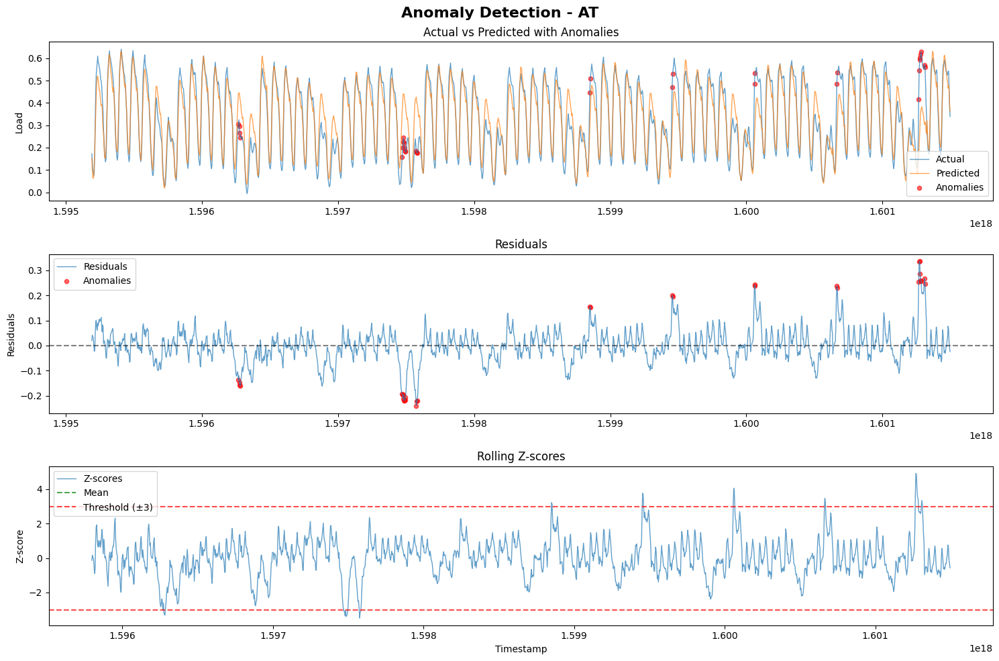

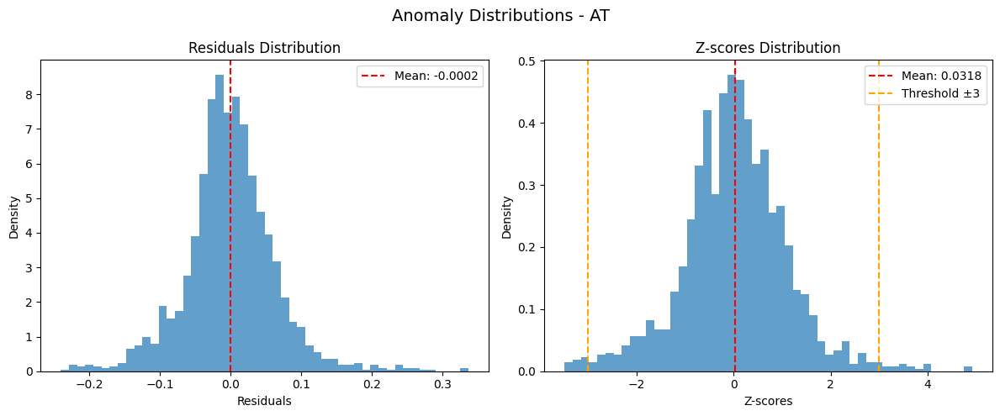

  Z-score anomalies: 31 (1.77%)

Processing CH...
Detecting anomalies for CH...
  Valid samples: 1752/1752
Plot saved to: outputs/CH_LSTM_anomalies_plot.png


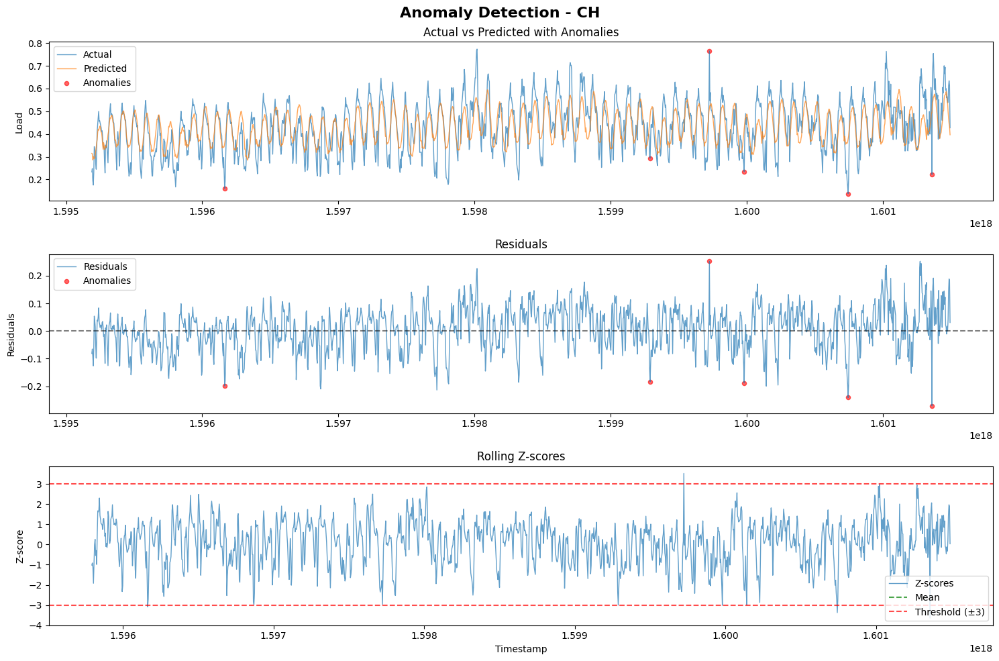

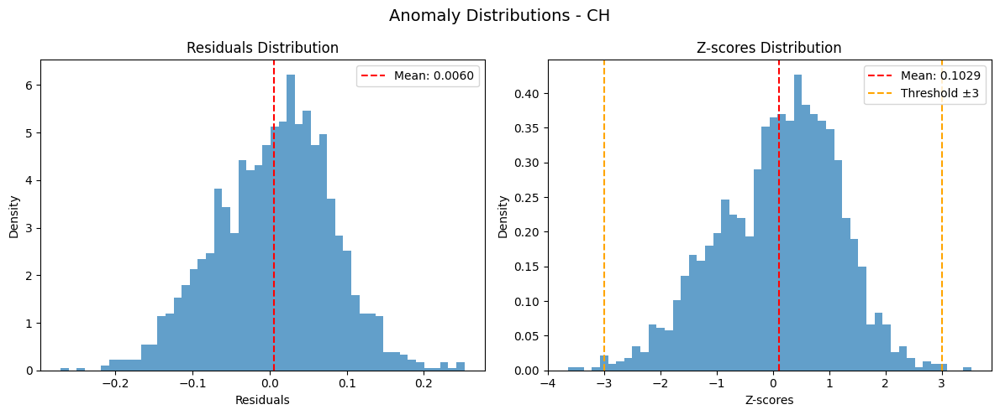

  Z-score anomalies: 6 (0.34%)

Processing FR...
Detecting anomalies for FR...
  Valid samples: 1752/1752
Plot saved to: outputs/FR_LSTM_anomalies_plot.png


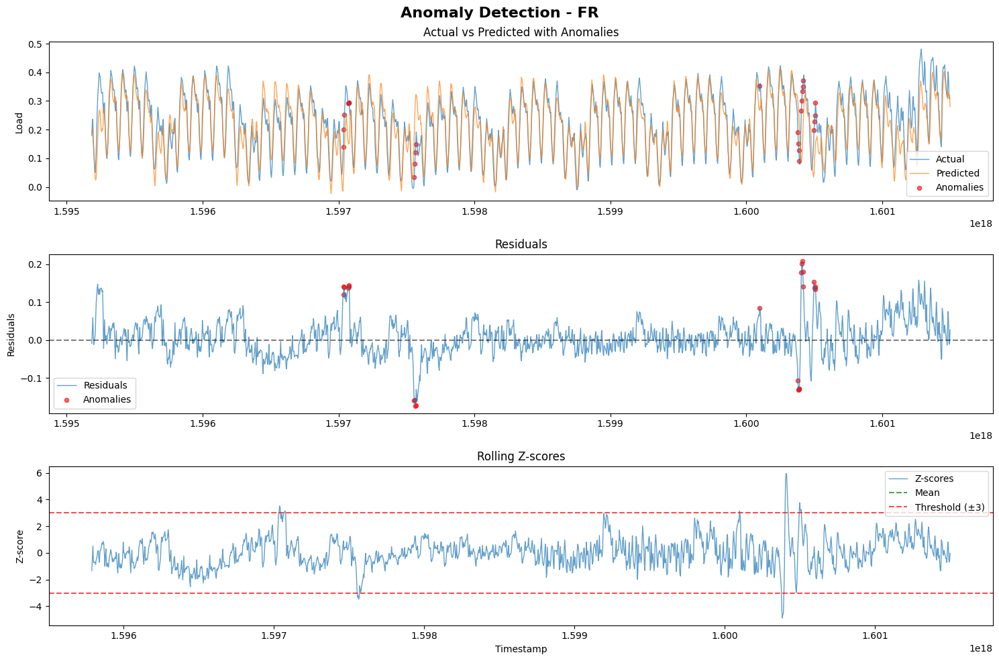

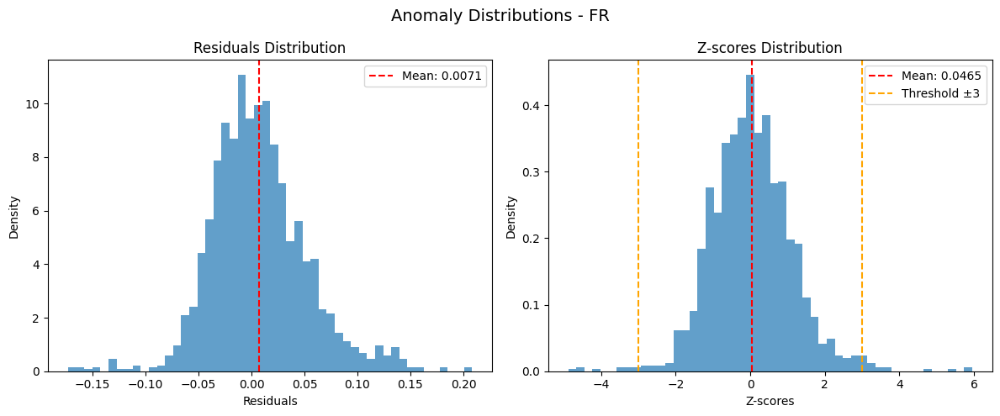

  Z-score anomalies: 24 (1.37%)

LSTM ANOMALY DETECTION SUMMARY:
  Country  Total_Samples  Z_Anomalies  Z_Rate (%)
0      AT           1752           31      1.7694
1      CH           1752            6      0.3425
2      FR           1752           24      1.3699

Running anomaly detection for GRU models...
ANOMALY DETECTION - GRU (Z-score only)

Processing AT...
Detecting anomalies for AT...
  Valid samples: 1752/1752
Plot saved to: outputs/AT_GRU_anomalies_plot.png


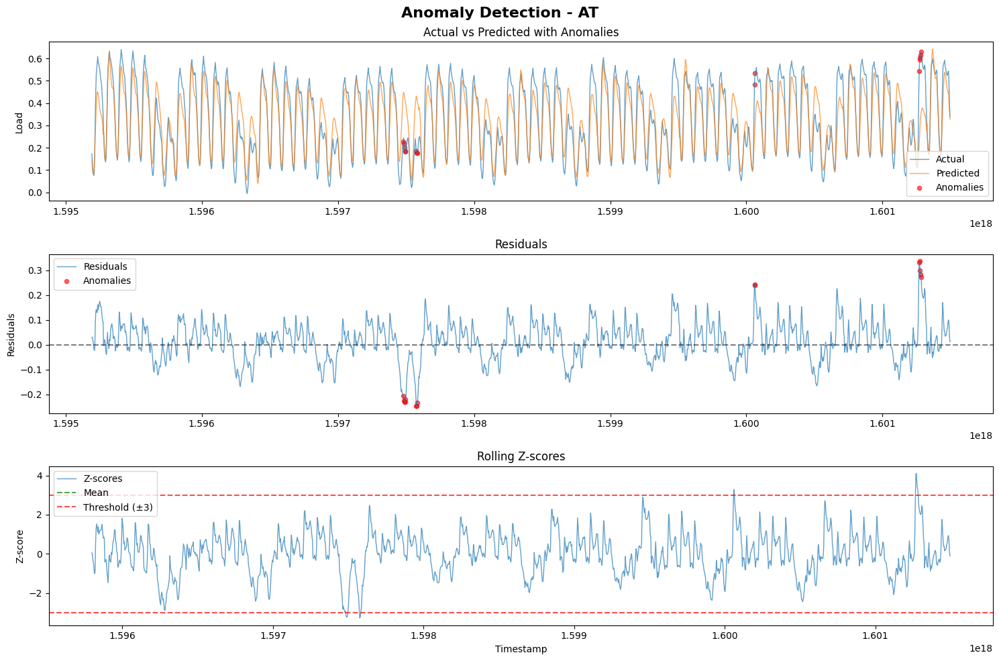

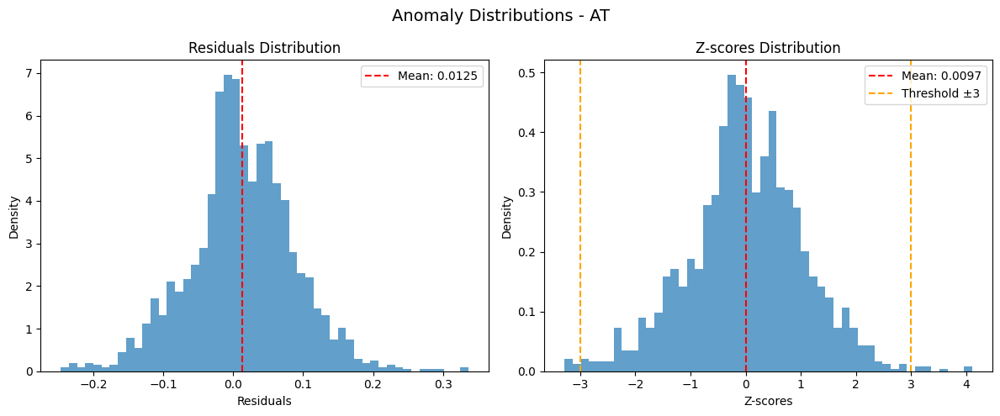

  Z-score anomalies: 15 (0.86%)

Processing CH...
Detecting anomalies for CH...
  Valid samples: 1752/1752
Plot saved to: outputs/CH_GRU_anomalies_plot.png


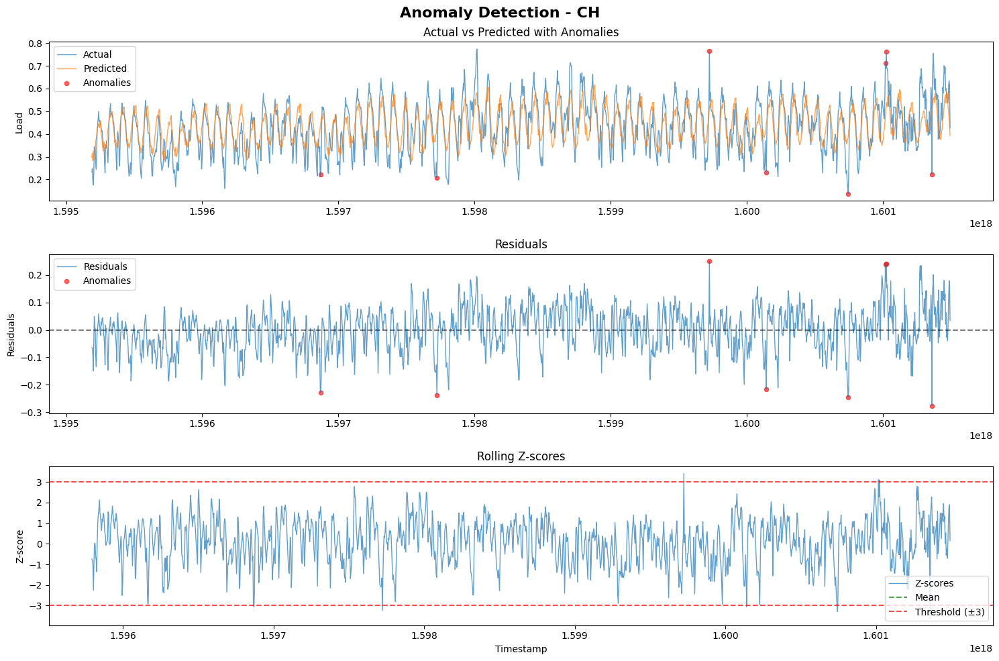

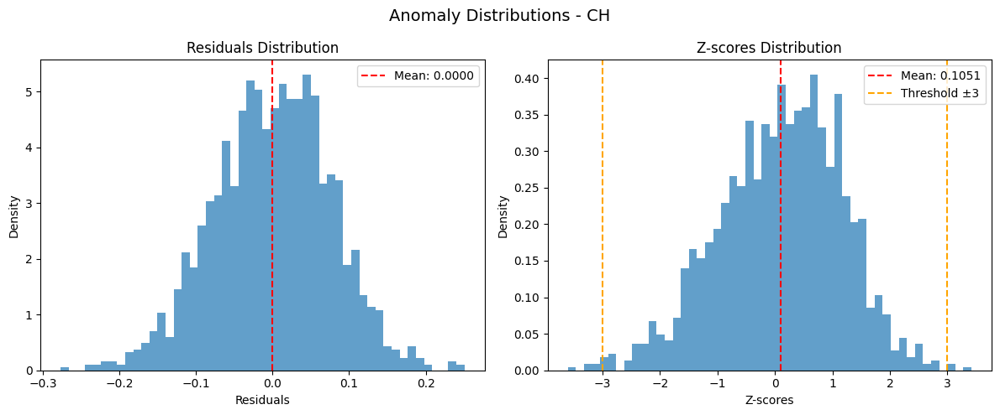

  Z-score anomalies: 8 (0.46%)

Processing FR...
Detecting anomalies for FR...
  Valid samples: 1752/1752
Plot saved to: outputs/FR_GRU_anomalies_plot.png


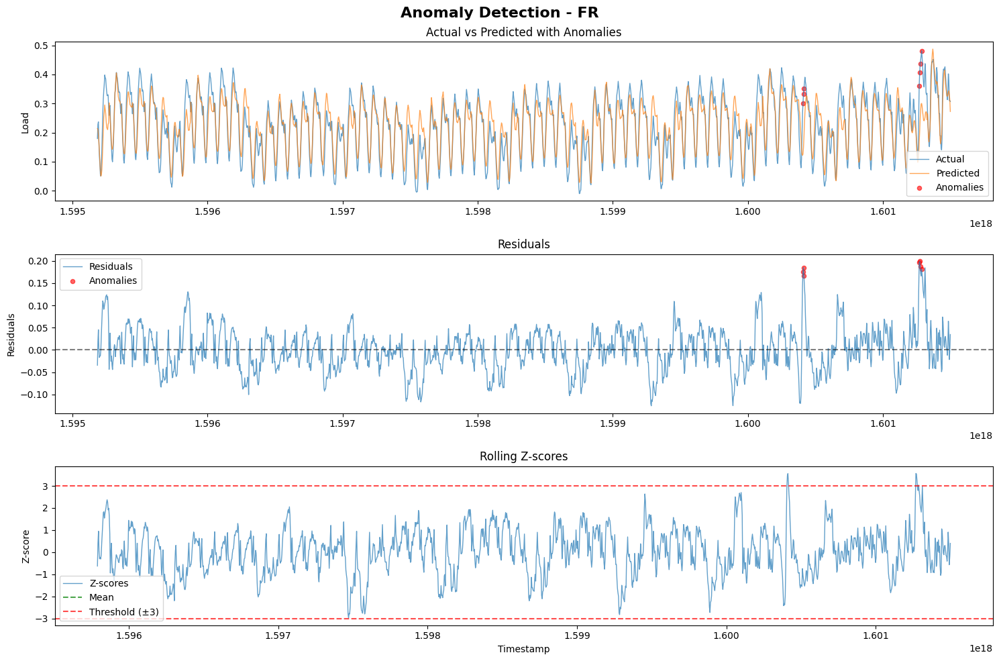

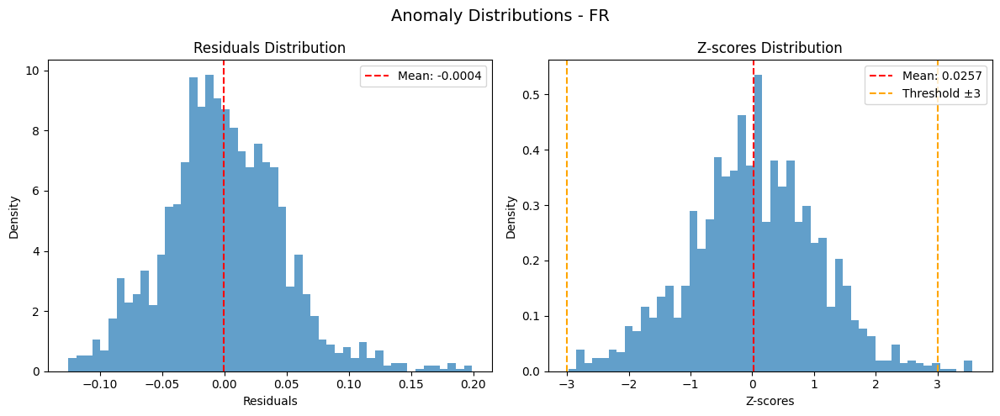

  Z-score anomalies: 7 (0.40%)

GRU ANOMALY DETECTION SUMMARY:
  Country  Total_Samples  Z_Anomalies  Z_Rate (%)
0      AT           1752           15      0.8562
1      CH           1752            8      0.4566
2      FR           1752            7      0.3995


In [41]:
def run_simple_anomaly_detection(backtest_results: Dict, model_type: str = 'LSTM'):

    print("=" * 60)
    print(f"ANOMALY DETECTION - {model_type} (Z-score only)")
    print("=" * 60)

    detector = SimpleAnomalyDetector(
        window=336,        # 14 days
        min_periods=168,   # 7 days
        z_threshold=3.0
    )

    visualizer = AnomalyVisualizer()

    os.makedirs('/content/outputs', exist_ok=True)

    for country in ['AT', 'CH', 'FR']:
        if country in backtest_results:
            print(f"\nProcessing {country}...")

            test_results = backtest_results[country]['test']

            anomaly_results = detector.detect_anomalies(
                country=country,
                timestamps=test_results['timestamps'],
                y_true=test_results['true'],
                y_pred=test_results['forecasts']
            )

            detector.save_anomaly_csv(country, '/content/outputs')

            plot_path = f'/content/outputs/{country}_{model_type}_anomalies_plot.png'
            visualizer.plot_anomaly_detection(country, anomaly_results, plot_path)
            visualizer.plot_anomaly_distribution(anomaly_results, country)

            stats = anomaly_results['anomaly_stats']
            print(f"  Z-score anomalies: {stats['z_anomaly_count']} ({stats['z_anomaly_rate']:.2f}%)")

    summary_df = detector.get_anomaly_summary()
    print(f"\n{model_type} ANOMALY DETECTION SUMMARY:")
    print(summary_df.round(4))

    summary_df.to_csv(f'/content/outputs/{model_type}_anomaly_summary.csv', index=False)

    return detector.results, summary_df

print("Running anomaly detection for LSTM models...")
lstm_anomaly_results, lstm_anomaly_summary = run_simple_anomaly_detection(lstm_backtest_results, 'LSTM')

print("\n" + "=" * 60)
print("Running anomaly detection for GRU models...")
gru_anomaly_results, gru_anomaly_summary = run_simple_anomaly_detection(gru_backtest_results, 'GRU')

ML based Anomaly Classifier



In [53]:
def create_silver_labels(timestamps: np.ndarray,
                        y_true: np.ndarray,
                        y_pred: np.ndarray,
                        z_scores: np.ndarray,
                        lo: Optional[np.ndarray] = None,
                        hi: Optional[np.ndarray] = None) -> np.ndarray:
    labels = np.full_like(z_scores, -1, dtype=int)  # -1 for unlabeled
    z_abs = np.abs(z_scores)
    pos_condition1 = z_abs >= 3.5

    if lo is not None and hi is not None:
        outside_interval = (y_true < lo) | (y_true > hi)
        pos_condition2 = outside_interval & (z_abs >= 2.5)
        pos_mask = pos_condition1 | pos_condition2

        neg_mask = (z_abs < 1.0) & (y_true >= lo) & (y_true <= hi)
    else:
        # If no prediction intervals, use only z-score condition
        pos_mask = pos_condition1
        neg_mask = z_abs < 1.0

    valid_mask = ~np.isnan(z_scores)
    pos_mask = pos_mask & valid_mask
    neg_mask = neg_mask & valid_mask

    labels[pos_mask] = 1
    labels[neg_mask] = 0

    return labels

In [52]:
def sample_for_verification(timestamps: np.ndarray,
                           labels: np.ndarray,
                           country: str,
                           n_positives: int = 50,
                           n_negatives: int = 50,
                           random_state: int = 42) -> pd.DataFrame:

    np.random.seed(random_state)
    pos_indices = np.where(labels == 1)[0]
    neg_indices = np.where(labels == 0)[0]

    n_pos_samples = min(n_positives, len(pos_indices))
    n_neg_samples = min(n_negatives, len(neg_indices))

    sampled_pos_indices = np.random.choice(pos_indices, n_pos_samples, replace=False)
    sampled_neg_indices = np.random.choice(neg_indices, n_neg_samples, replace=False)

    verification_samples = []

    for idx in sampled_pos_indices:
        verification_samples.append({
            'timestamp': timestamps[idx],
            'country': country,
            'silver_label': 1,
            'human_label': None,
            'notes': ''
        })

    for idx in sampled_neg_indices:
        verification_samples.append({
            'timestamp': timestamps[idx],
            'country': country,
            'silver_label': 0,
            'human_label': None,
            'notes': ''
        })

    return pd.DataFrame(verification_samples)

In [51]:
def create_ml_features(timestamps: pd.Series,
                      y_true: np.ndarray,
                      y_pred: np.ndarray,
                      residuals: np.ndarray,
                      z_scores: np.ndarray,
                      window_size: int = 48) -> pd.DataFrame:

    df = pd.DataFrame({
        'timestamp': timestamps,
        'y_true': y_true,
        'y_pred': y_pred,
        'residual': residuals,
        'z_score': z_scores
    })

    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df['hour'] = df['timestamp'].dt.hour
    df['day_of_week'] = df['timestamp'].dt.dayofweek
    df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)
    df['month'] = df['timestamp'].dt.month

    hour_dummies = pd.get_dummies(df['hour'], prefix='hour')
    dow_dummies = pd.get_dummies(df['day_of_week'], prefix='dow')
    month_dummies = pd.get_dummies(df['month'], prefix='month')

    for lag in [1, 2, 3, 6, 12, 24]:
        df[f'residual_lag_{lag}'] = df['residual'].shift(lag)
        df[f'z_score_lag_{lag}'] = df['z_score'].shift(lag)

    df['residual_roll_mean_24'] = df['residual'].rolling(window=24, min_periods=1).mean()
    df['residual_roll_std_24'] = df['residual'].rolling(window=24, min_periods=1).std()
    df['residual_roll_max_24'] = df['residual'].rolling(window=24, min_periods=1).max()
    df['residual_roll_min_24'] = df['residual'].rolling(window=24, min_periods=1).min()

    df['z_score_roll_mean_24'] = df['z_score'].rolling(window=24, min_periods=1).mean()
    df['z_score_roll_std_24'] = df['z_score'].rolling(window=24, min_periods=1).std()

    df['abs_error'] = np.abs(df['residual'])
    df['squared_error'] = df['residual'] ** 2
    df['error_rate'] = df['residual'] / (df['y_true'] + 1e-8)  # Avoid division by zero

    df['residual_trend_6h'] = df['residual'] - df['residual'].shift(6)
    df['z_score_trend_6h'] = df['z_score'] - df['z_score'].shift(6)

    feature_columns = [
        'y_true', 'y_pred', 'residual', 'z_score', 'hour', 'day_of_week', 'is_weekend', 'month',
        'abs_error', 'squared_error', 'error_rate',
        'residual_roll_mean_24', 'residual_roll_std_24', 'residual_roll_max_24', 'residual_roll_min_24',
        'z_score_roll_mean_24', 'z_score_roll_std_24',
        'residual_trend_6h', 'z_score_trend_6h'
    ]

    for lag in [1, 2, 3, 6, 12, 24]:
        feature_columns.extend([f'residual_lag_{lag}', f'z_score_lag_{lag}'])

    features_df = df[feature_columns].copy()
    features_df = pd.concat([features_df, hour_dummies, dow_dummies, month_dummies], axis=1)

    return features_df

In [50]:
def train_anomaly_classifier(features: pd.DataFrame,
                            labels: np.ndarray,
                            model_type: str = 'logistic',
                            test_size: float = 0.2,
                            random_state: int = 42) -> Tuple:

    valid_mask = (labels != -1) & (~features.isna().any(axis=1))
    X = features[valid_mask]
    y = labels[valid_mask]

    print(f"Training samples: {len(X)} (positives: {np.sum(y==1)}, negatives: {np.sum(y==0)})")

    if len(X) == 0:
        raise ValueError("No valid training samples available")

    if np.sum(y == 1) < 2:
        print(f"    Skipping {model_type} - insufficient positive samples ({np.sum(y==1)})")
        return None, None, {}, {}

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    if model_type == 'logistic':
        model = LogisticRegression(random_state=random_state, class_weight='balanced')
        model.fit(X_train_scaled, y_train)
    elif model_type == 'lightgbm':
        model = lgb.LGBMClassifier(
            random_state=random_state,
            class_weight='balanced',
            n_estimators=100,
            max_depth=6,
            verbosity=-1
        )
        model.fit(X_train_scaled, y_train)
    elif model_type == 'random_forest':
        model = RandomForestClassifier(
            random_state=random_state,
            class_weight='balanced',
            n_estimators=100,
            max_depth=6
        )
        model.fit(X_train_scaled, y_train)
    else:
        raise ValueError(f"Unknown model type: {model_type}")

    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
    pr_auc = auc(recall, precision)

    target_precision = 0.80
    precision_mask = precision >= target_precision
    if np.any(precision_mask):
        target_idx = np.where(precision_mask)[0][0]
        target_threshold = thresholds[target_idx]

        y_pred_at_target = (y_pred_proba >= target_threshold).astype(int)
        f1_at_target = f1_score(y_test, y_pred_at_target)
    else:
        target_threshold = 0.5
        y_pred_at_target = (y_pred_proba >= target_threshold).astype(int)
        f1_at_target = f1_score(y_test, y_pred_at_target)
        print(f"Warning: Could not achieve {target_precision} precision, using default threshold")

    if hasattr(model, 'feature_importances_'):
        feature_importance = dict(zip(X.columns, model.feature_importances_))
    elif hasattr(model, 'coef_'):
        feature_importance = dict(zip(X.columns, np.abs(model.coef_[0])))
    else:
        feature_importance = {}

    metrics = {
        'pr_auc': pr_auc,
        'f1_at_p80': f1_at_target,
        'target_precision': target_precision,
        'target_threshold': target_threshold,
        'test_samples': len(X_test),
        'positive_rate': np.mean(y_test)
    }

    return model, scaler, metrics, feature_importance

In [57]:
def save_ml_evaluation_metrics(all_results: Dict, output_dir: str):

    evaluation_metrics = {}

    for country, results in all_results.items():
        country_metrics = {}

        for model_type, model_data in results['model_results'].items():
            if model_data is None or not model_data.get('metrics'):
                continue

            metrics = model_data['metrics']
            serializable_metrics = {}

            for key, value in metrics.items():
                if hasattr(value, 'item'):
                    serializable_metrics[key] = value.item() if hasattr(value, 'item') else float(value)
                else:
                    serializable_metrics[key] = value

            country_metrics[model_type] = serializable_metrics

            feature_importance = model_data['feature_importance']
            if feature_importance:
                top_features = sorted(feature_importance.items(),
                                    key=lambda x: x[1], reverse=True)[:5]
                serializable_top_features = {}
                for feature, importance in top_features:
                    serializable_top_features[feature] = float(importance) if hasattr(importance, 'item') else importance

                country_metrics[model_type]['top_features'] = serializable_top_features

        evaluation_metrics[country] = country_metrics

    metrics_path = f"{output_dir}/anomaly_ml_eval.json"
    with open(metrics_path, 'w') as f:
        json.dump(evaluation_metrics, f, indent=2)

    print(f"\nSaved ML evaluation metrics to: {metrics_path}")

    print("\nML ANOMALY DETECTION SUMMARY:")
    print("-" * 50)
    for country, metrics in evaluation_metrics.items():
        print(f"\n{country}:")
        for model_type, model_metrics in metrics.items():
            print(f"  {model_type.upper()}:")
            pr_auc = model_metrics.get('pr_auc', 'N/A')
            f1_score = model_metrics.get('f1_at_p80', 'N/A')

            if pr_auc != 'N/A':
                print(f"    PR-AUC: {pr_auc:.4f}")
            else:
                print(f"    PR-AUC: {pr_auc}")

            if f1_score != 'N/A':
                print(f"    F1@P80: {f1_score:.4f}")
            else:
                print(f"    F1@P80: {f1_score}")

            if 'top_features' in model_metrics:
                print(f"    Top features: {list(model_metrics['top_features'].keys())}")

In [34]:
def run_ml_anomaly_detection(anomaly_results: Dict,
                            backtest_results: Dict,
                            countries: List[str] = ['AT', 'CH', 'FR'],
                            output_dir: str = '/content/outputs') -> Dict:

    print("=" * 60)
    print("ML-BASED ANOMALY CLASSIFICATION")
    print("=" * 60)

    os.makedirs(output_dir, exist_ok=True)
    all_results = {}

    for country in countries:
        print(f"\nProcessing {country}...")

        if country not in anomaly_results:
            print(f"  No anomaly results found for {country}, skipping...")
            continue

        anomaly_data = anomaly_results[country]
        backtest_data = backtest_results[country]['test']

        lo = backtest_data.get('lo', None)
        hi = backtest_data.get('hi', None)

        silver_labels = create_silver_labels(
            timestamps=anomaly_data['timestamps'],
            y_true=anomaly_data['y_true'],
            y_pred=anomaly_data['y_pred'],
            z_scores=anomaly_data['z_scores'],
            lo=lo,
            hi=hi
        )

        print(f"  Silver labels: {np.sum(silver_labels==1)} positives, "
              f"{np.sum(silver_labels==0)} negatives, "
              f"{np.sum(silver_labels==-1)} unlabeled")

        verification_df = sample_for_verification(
            timestamps=anomaly_data['timestamps'],
            labels=silver_labels,
            country=country
        )

        features_df = create_ml_features(
            timestamps=pd.Series(anomaly_data['timestamps']),
            y_true=anomaly_data['y_true'],
            y_pred=anomaly_data['y_pred'],
            residuals=anomaly_data['residuals'],
            z_scores=anomaly_data['z_scores']
        )

        model_results = {}

        for model_type in ['logistic', 'lightgbm']:
            print(f"  Training {model_type} classifier...")

            try:
                model, scaler, metrics, feature_importance = train_anomaly_classifier(
                    features=features_df,
                    labels=silver_labels,
                    model_type=model_type
                )

                if model is None:
                  model_results[model_type] = None
                  continue


                model_results[model_type] = {
                    'model': model,
                    'scaler': scaler,
                    'metrics': metrics,
                    'feature_importance': feature_importance
                }

                print(f"    PR-AUC: {metrics['pr_auc']:.4f}, "
                      f"F1@P{metrics['target_precision']:.0%}: {metrics['f1_at_p80']:.4f}")

            except Exception as e:
                print(f"    Error training {model_type}: {e}")

        all_results[country] = {
            'silver_labels': silver_labels,
            'verification_samples': verification_df,
            'features': features_df,
            'model_results': model_results
        }

        verification_path = f"{output_dir}/{country}_anomaly_labels_verified.csv"
        verification_df.to_csv(verification_path, index=False)
        print(f"  Saved verification samples to: {verification_path}")

    save_ml_evaluation_metrics(all_results, output_dir)

    return all_results

In [59]:
def run_complete_anomaly_detection(backtest_results: Dict, model_type: str = 'LSTM'):

    print("=" * 60)
    print(f"COMPLETE ANOMALY DETECTION - {model_type}")
    print("=" * 60)

    anomaly_results, anomaly_summary = run_simple_anomaly_detection(backtest_results, model_type)

    ml_results = run_ml_anomaly_detection(
        anomaly_results=anomaly_results,
        backtest_results=backtest_results)

    return anomaly_results, anomaly_summary, ml_results

Running complete anomaly detection for LSTM...
COMPLETE ANOMALY DETECTION - LSTM
ANOMALY DETECTION - LSTM (Z-score only)

Processing AT...
Detecting anomalies for AT...
  Valid samples: 1752/1752
Plot saved to: outputs/AT_LSTM_anomalies_plot.png


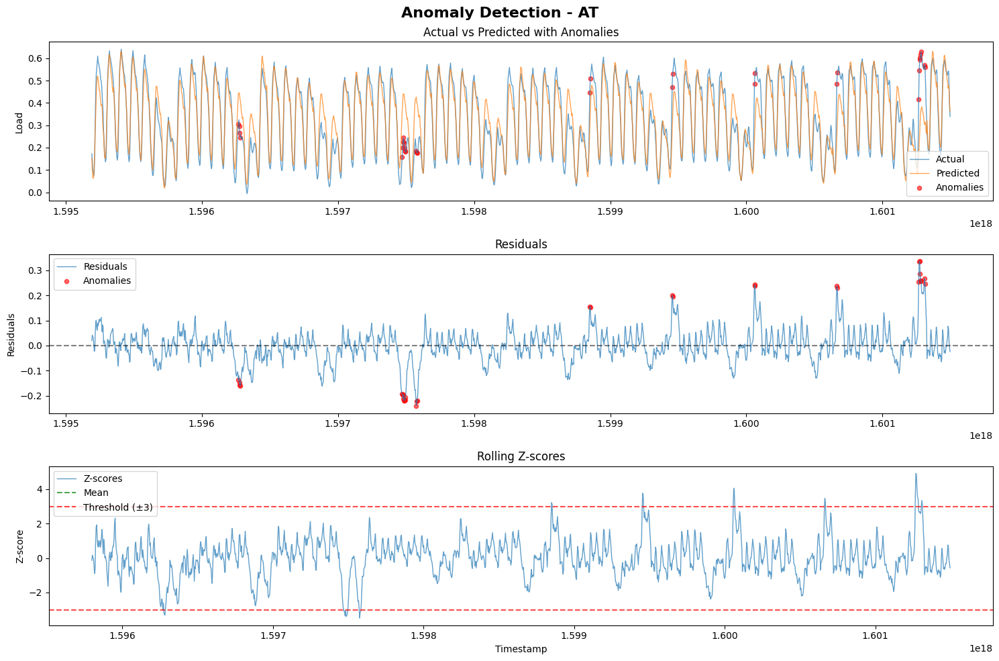

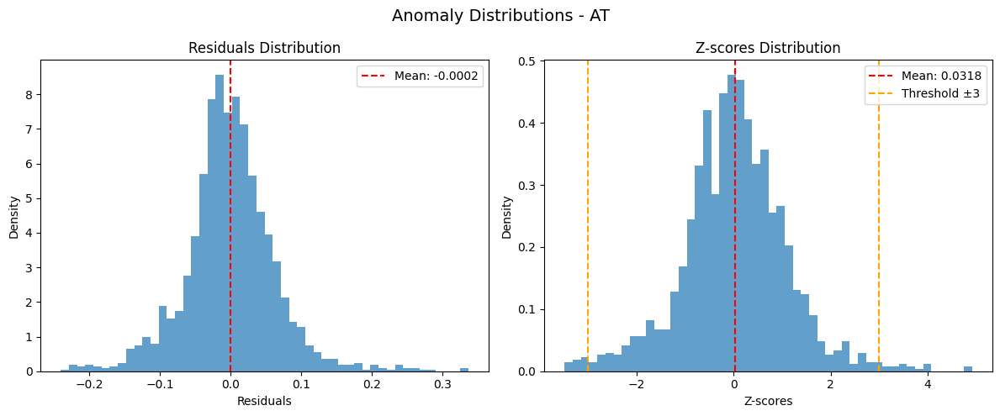

  Z-score anomalies: 31 (1.77%)

Processing CH...
Detecting anomalies for CH...
  Valid samples: 1752/1752
Plot saved to: outputs/CH_LSTM_anomalies_plot.png


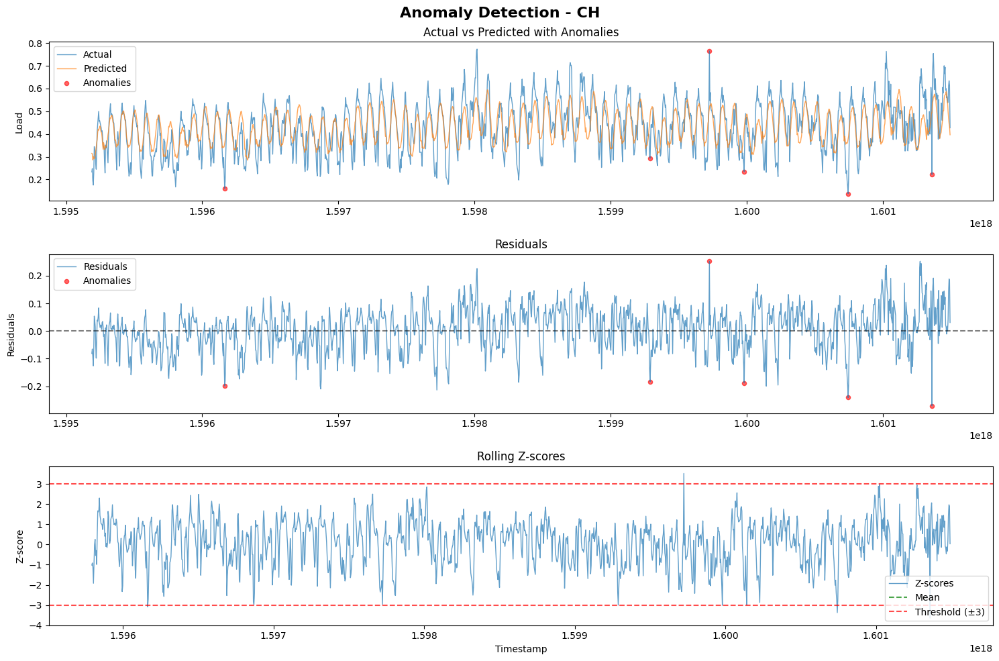

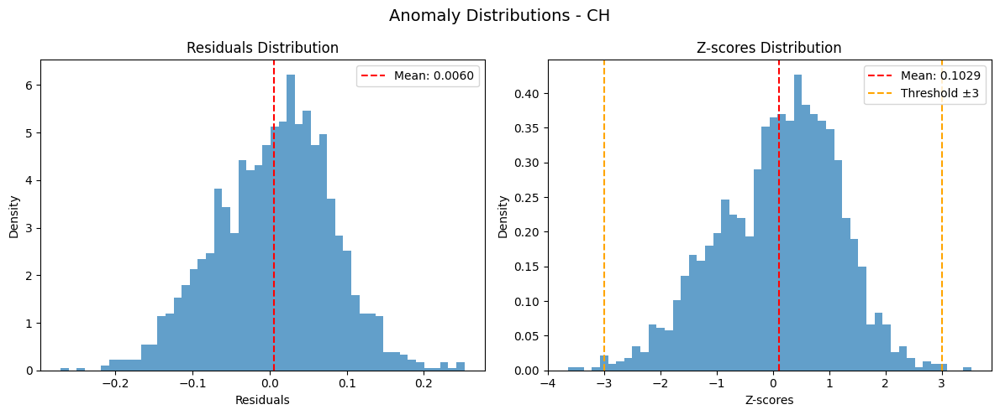

  Z-score anomalies: 6 (0.34%)

Processing FR...
Detecting anomalies for FR...
  Valid samples: 1752/1752
Plot saved to: outputs/FR_LSTM_anomalies_plot.png


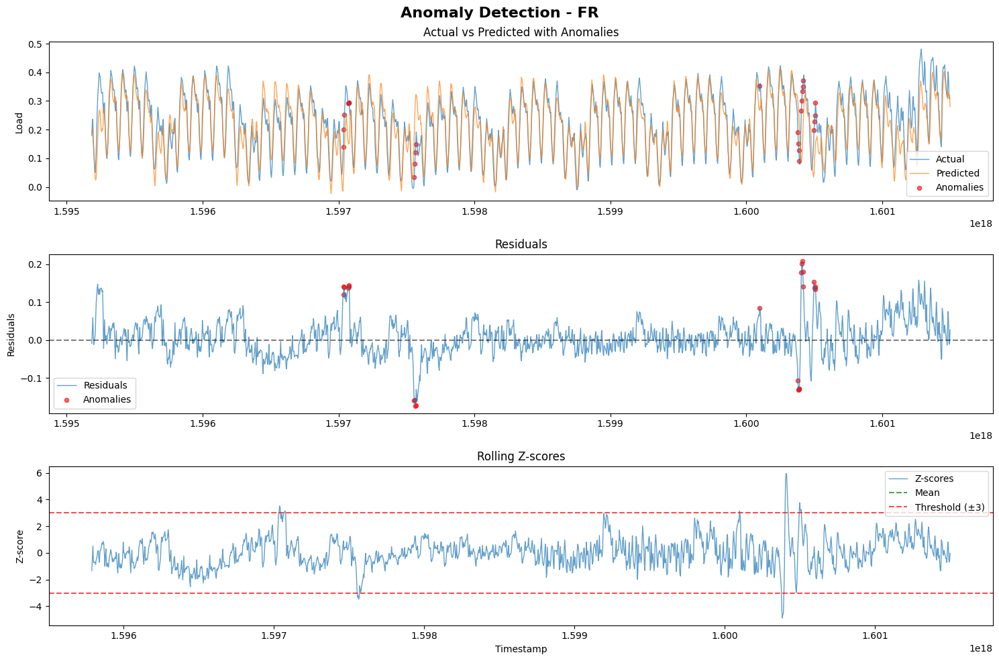

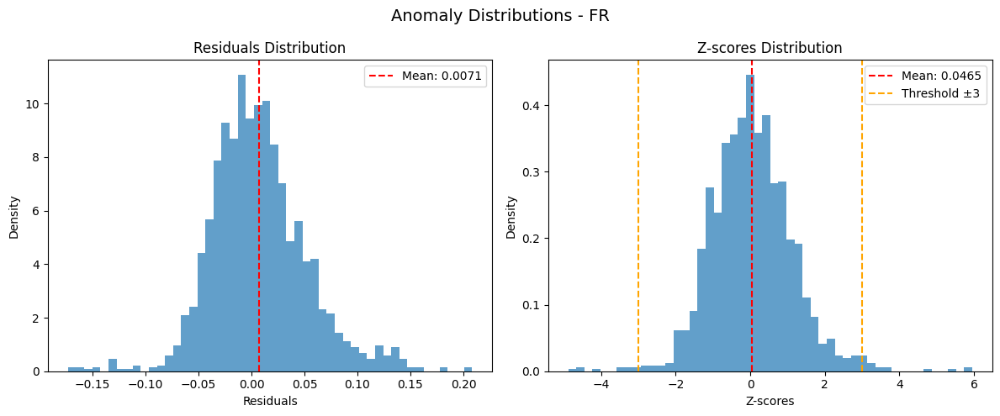

  Z-score anomalies: 24 (1.37%)

LSTM ANOMALY DETECTION SUMMARY:
  Country  Total_Samples  Z_Anomalies  Z_Rate (%)
0      AT           1752           31      1.7694
1      CH           1752            6      0.3425
2      FR           1752           24      1.3699
ML-BASED ANOMALY CLASSIFICATION

Processing AT...
  Silver labels: 9 positives, 1133 negatives, 610 unlabeled
  Training logistic classifier...
Training samples: 1126 (positives: 9, negatives: 1117)
    PR-AUC: 1.0000, F1@P80%: 1.0000
  Training lightgbm classifier...
Training samples: 1126 (positives: 9, negatives: 1117)
    PR-AUC: 1.0000, F1@P80%: 1.0000
  Saved verification samples to: outputs/AT_anomaly_labels_verified.csv

Processing CH...
  Silver labels: 2 positives, 1001 negatives, 749 unlabeled
  Training logistic classifier...
Training samples: 992 (positives: 2, negatives: 990)
    Error training logistic: index 199 is out of bounds for axis 0 with size 199
  Training lightgbm classifier...
Training samples: 992 (

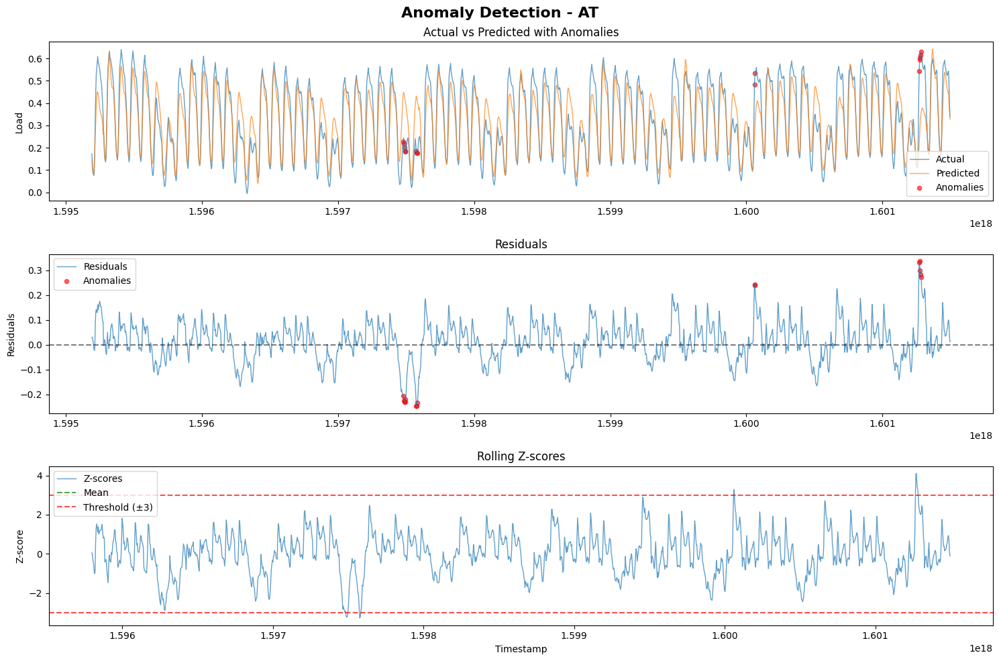

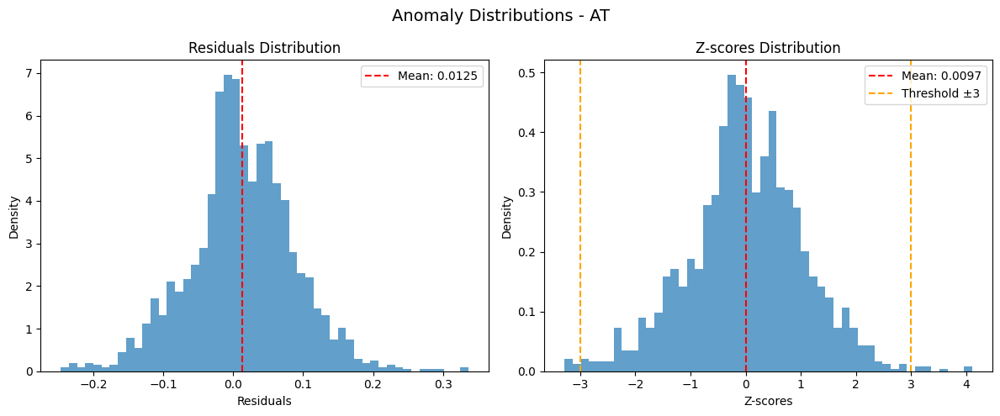

  Z-score anomalies: 15 (0.86%)

Processing CH...
Detecting anomalies for CH...
  Valid samples: 1752/1752
Plot saved to: outputs/CH_GRU_anomalies_plot.png


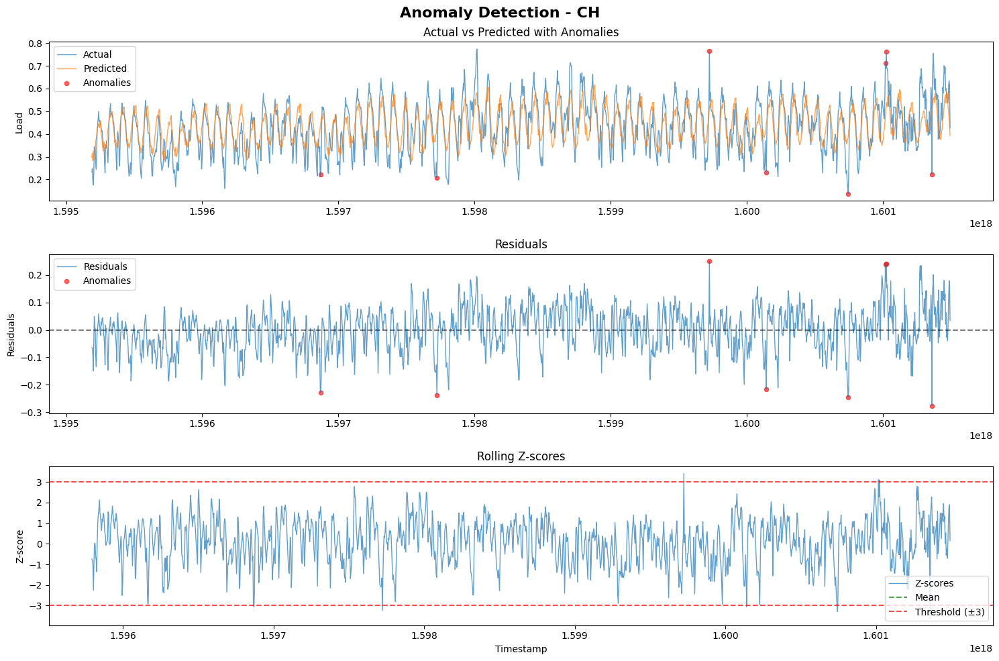

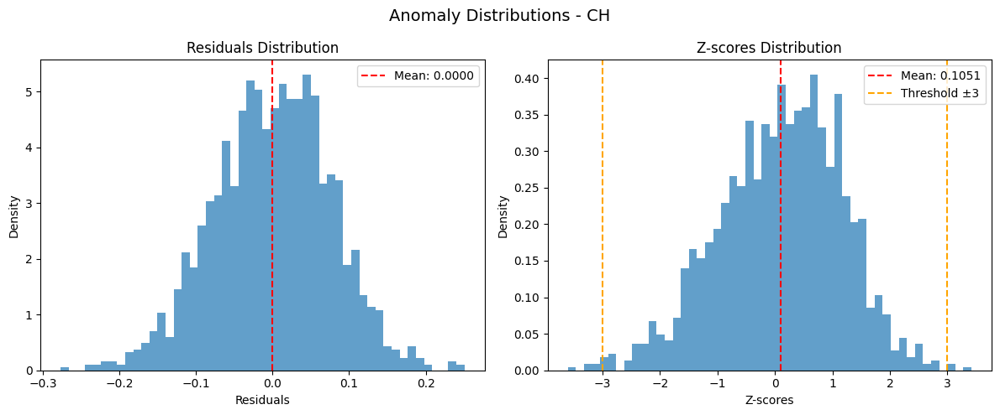

  Z-score anomalies: 8 (0.46%)

Processing FR...
Detecting anomalies for FR...
  Valid samples: 1752/1752
Plot saved to: outputs/FR_GRU_anomalies_plot.png


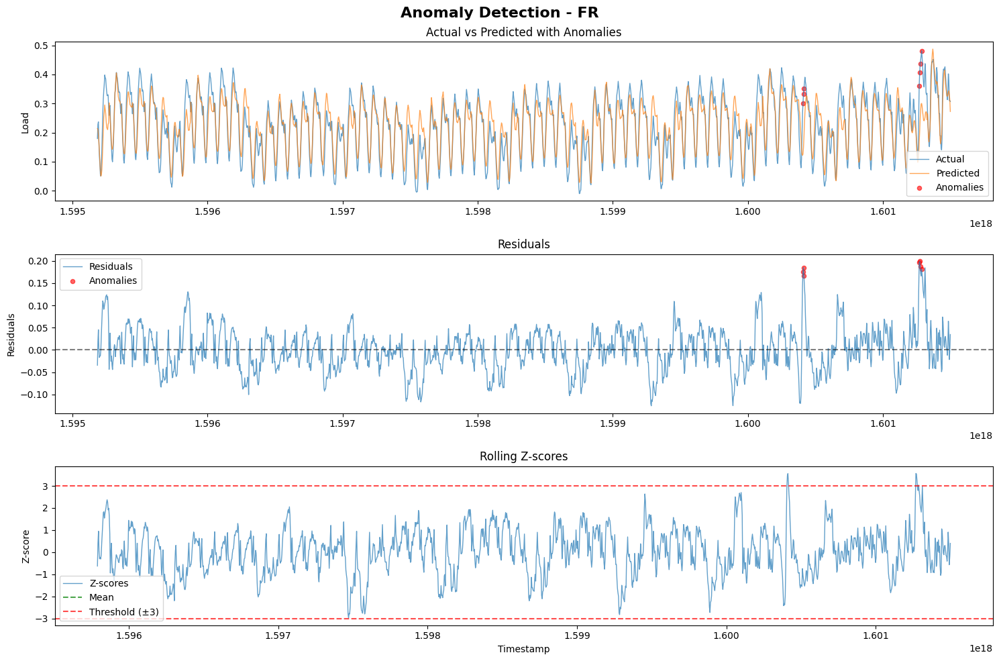

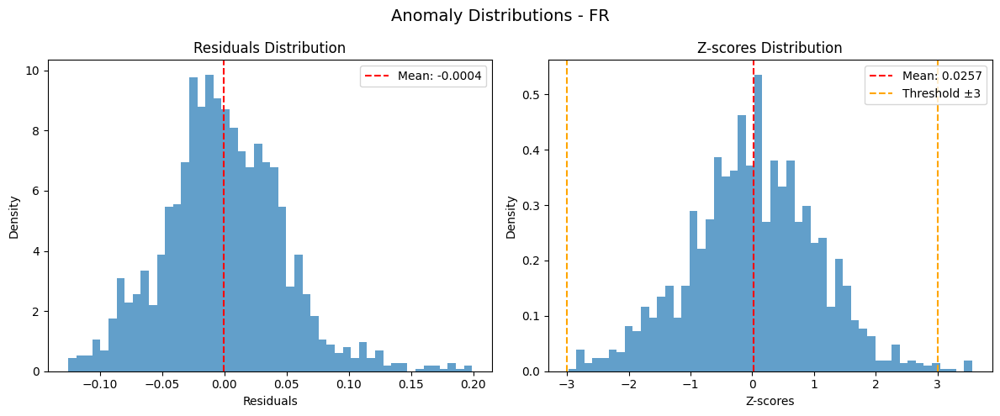

  Z-score anomalies: 7 (0.40%)

GRU ANOMALY DETECTION SUMMARY:
  Country  Total_Samples  Z_Anomalies  Z_Rate (%)
0      AT           1752           15      0.8562
1      CH           1752            8      0.4566
2      FR           1752            7      0.3995
ML-BASED ANOMALY CLASSIFICATION

Processing AT...
  Silver labels: 3 positives, 1099 negatives, 650 unlabeled
  Training logistic classifier...
Training samples: 1092 (positives: 3, negatives: 1089)
    PR-AUC: 1.0000, F1@P80%: 1.0000
  Training lightgbm classifier...
Training samples: 1092 (positives: 3, negatives: 1089)
    PR-AUC: 1.0000, F1@P80%: 1.0000
  Saved verification samples to: outputs/AT_anomaly_labels_verified.csv

Processing CH...
  Silver labels: 1 positives, 1005 negatives, 746 unlabeled
  Training logistic classifier...
Training samples: 996 (positives: 1, negatives: 995)
    Skipping logistic - insufficient positive samples (1)
  Training lightgbm classifier...
Training samples: 996 (positives: 1, negatives: 

In [60]:
print("Running complete anomaly detection for LSTM...")
lstm_anomaly, lstm_summary, lstm_ml = run_complete_anomaly_detection(lstm_backtest_results, 'LSTM')

print("\nRunning complete anomaly detection for GRU...")
gru_anomaly, gru_summary, gru_ml = run_complete_anomaly_detection(gru_backtest_results, 'GRU')

LIVE INGESTION + ONLINE ADAPTION
1. Doing tiny neural fine tune
2. Using FR and LSTM

In [70]:
class LiveNeuralAdapter:

    def __init__(self,
                 country: str,
                 model_type: str,
                 test_data: Dict,
                 history_days: int = 90,
                 adaptation_strategy: str = 'tiny_neural_fine_tune'):

        self.country = country
        self.model_type = model_type
        self.adaptation_strategy = adaptation_strategy

        self.history_data = {
            'timestamps': [],
            'y_true': [],
            'y_pred': [],
            'residuals': [],
            'z_scores': []
        }

        self.model = None
        self.adaptation_log = []
        self.drift_history = []
        self.update_count = 0
        self.last_adaptation_time = None

        self.history_days = history_days
        self.fine_tune_days = 14
        self.fine_tune_interval = 6
        self.drift_window = 30 * 24
        self.ewma_alpha = 0.1

        self._initialize_history(test_data)
        self._load_pretrained_model()

        print(f"Live adapter initialized for {country} ({model_type})")
        print(f"Strategy: {adaptation_strategy}")
        print(f"Initial history: {len(self.history_data['y_true'])} hours")

    def _initialize_history(self, test_data: Dict):
        n_history = min(self.history_days * 24, len(test_data['timestamps']))

        if hasattr(test_data['timestamps'], 'tolist'):
            timestamps = test_data['timestamps'][:n_history].tolist()
            y_true = test_data['true'][:n_history].tolist()
            y_pred = test_data['forecasts'][:n_history].tolist()
        else:
            timestamps = test_data['timestamps'][:n_history]
            y_true = test_data['true'][:n_history]
            y_pred = test_data['forecasts'][:n_history]

        self.history_data['timestamps'] = timestamps
        self.history_data['y_true'] = y_true
        self.history_data['y_pred'] = y_pred

        residuals = []
        for i in range(len(y_true)):
            residuals.append(y_true[i] - y_pred[i])
        self.history_data['residuals'] = residuals

        self.history_data['z_scores'] = [np.nan] * len(residuals)

    def _load_pretrained_model(self):
        try:
            if self.model_type == 'LSTM':
                config = country_configs_lstm[self.country]
                self.model = build_lstm_model(
                    sequence_length=config['sequence_length'],
                    lstm_units=config['lstm_units'],
                    dropout_rate=config['dropout_rate'],
                    learning_rate=config['learning_rate']
                )

                if hasattr(lstm_model_manager, 'trained_models'):
                    for model_info in lstm_model_manager.trained_models:
                        if model_info['country'] == self.country:
                            self.model.set_weights(model_info['weights'])
                            break

            else:  #for GRU
                config = country_configs[self.country]
                self.model = build_gru_model(
                    sequence_length=config['sequence_length'],
                    gru_units=config['gru_units'],
                    dropout_rate=config['dropout_rate'],
                    learning_rate=config['learning_rate']
                )

                if hasattr(model_manager, 'trained_models'):
                    for model_info in model_manager.trained_models:
                        if model_info['country'] == self.country:
                            self.model.set_weights(model_info['weights'])
                            break

            print(f"  Loaded pre-trained {self.model_type} model for {self.country}")

        except Exception as e:
            print(f"  Warning: Could not load pre-trained model: {e}")
            print("  Using default initialized model")

    def _calculate_rolling_zscore(self, new_residual: float) -> float:
        if len(self.history_data['residuals']) < 168:
            return 0.0

        window_size = 336
        start_idx = max(0, len(self.history_data['residuals']) - window_size)
        recent_residuals = self.history_data['residuals'][start_idx:]

        if len(recent_residuals) < 168:
            return 0.0

        mean_val = np.mean(recent_residuals)
        std_val = np.std(recent_residuals)

        if std_val > 0:
            return (new_residual - mean_val) / std_val
        return 0.0

    def _check_drift_trigger(self) -> bool:
        if len(self.drift_history) < 24:
            return False

        z_abs = [abs(z) for z in self.drift_history if not np.isnan(z)]
        if len(z_abs) < 24:
            return False

        ewma = z_abs[0]
        for z_val in z_abs[1:]:
            ewma = self.ewma_alpha * z_val + (1 - self.ewma_alpha) * ewma

        recent_z = z_abs[-min(len(z_abs), self.drift_window):]
        if len(recent_z) == 0:
            return False

        percentile_95 = np.percentile(recent_z, 95)

        trigger = ewma > percentile_95
        if trigger:
            print(f"  Drift detected! EWMA: {ewma:.3f} > 95th percentile: {percentile_95:.3f}")

        return trigger

    def _tiny_neural_fine_tune(self, reason: str) -> float:
        start_time = time.time()

        try:
            fine_tune_hours = self.fine_tune_days * 24
            if len(self.history_data['y_true']) < fine_tune_hours:
                fine_tune_hours = len(self.history_data['y_true'])

            recent_true = self.history_data['y_true'][-fine_tune_hours:]
            sequences, targets = create_sequences(recent_true, 168, 24)

            if len(sequences) > 0:
                sequences = sequences.reshape((sequences.shape[0], 168, 1))

                original_weights = self.model.get_weights()

                fine_tune_optimizer = Adam(learning_rate=1e-4)
                self.model.compile(optimizer=fine_tune_optimizer, loss='mse')

                self.model.fit(
                    sequences, targets,
                    epochs=1,
                    batch_size=32,
                    verbose=0
                )

                print(f"  Neural fine-tune completed ({reason}) - {len(sequences)} sequences")

            duration = time.time() - start_time
            return duration

        except Exception as e:
            print(f"  Fine-tuning failed: {e}")
            if 'original_weights' in locals():
                self.model.set_weights(original_weights)
            return time.time() - start_time

    def forecast_next_24h(self) -> np.ndarray:
        if self.model is None or len(self.history_data['y_true']) < 168:
            return np.full(24, np.nan)

        try:
            input_sequence = np.array(self.history_data['y_true'][-168:])
            input_sequence = input_sequence.reshape((1, 168, 1))

            forecast = self.model.predict(input_sequence, verbose=0)[0]
            return forecast

        except Exception as e:
            print(f"  Forecast error: {e}")
            return np.full(24, np.nan)

    def ingest_hourly_data(self,
                          timestamp: str,
                          y_true: float,
                          y_pred: float) -> Dict:

        residual = y_true - y_pred
        z_score = self._calculate_rolling_zscore(residual)

        self.history_data['timestamps'].append(timestamp)
        self.history_data['y_true'].append(y_true)
        self.history_data['y_pred'].append(y_pred)
        self.history_data['residuals'].append(residual)
        self.history_data['z_scores'].append(z_score)

        if not np.isnan(z_score):
            self.drift_history.append(z_score)
            if len(self.drift_history) > self.drift_window * 2:
                self.drift_history = self.drift_history[-self.drift_window:]

        adaptation_reason = None
        adaptation_duration = 0.0

        current_time = pd.to_datetime(timestamp)
        current_hour = current_time.hour

        if current_hour % self.fine_tune_interval == 0:
            if self.last_adaptation_time is None or (current_time - self.last_adaptation_time).total_seconds() >= 6 * 3600:
                adaptation_reason = 'scheduled'

        elif self._check_drift_trigger():
            adaptation_reason = 'drift'

        if adaptation_reason:
            adaptation_duration = self._tiny_neural_fine_tune(adaptation_reason)
            self.update_count += 1
            self.last_adaptation_time = current_time

            self.adaptation_log.append({
                'timestamp': timestamp,
                'strategy': self.adaptation_strategy,
                'reason': adaptation_reason,
                'duration_s': adaptation_duration
            })

        return {
            'timestamp': timestamp,
            'y_true': y_true,
            'y_pred': y_pred,
            'residual': residual,
            'z_score': z_score,
            'adaptation_triggered': adaptation_reason is not None,
            'adaptation_reason': adaptation_reason,
            'adaptation_duration': adaptation_duration
        }

    def get_rolling_metrics(self, window_days: int = 7) -> Dict:
        window_hours = window_days * 24
        if len(self.history_data['y_true']) < window_hours:
            return {}

        recent_true = self.history_data['y_true'][-window_hours:]
        recent_pred = self.history_data['y_pred'][-window_hours:]
        recent_z = [z for z in self.history_data['z_scores'][-window_hours:] if not np.isnan(z)]

        errors = np.abs(np.array(recent_true) - np.array(recent_pred))
        if len(errors) > 0 and np.std(recent_true) > 0:
            mase = np.mean(errors) / np.std(recent_true)
        else:
            mase = 0.0

        anomaly_count = sum(1 for z in recent_z if abs(z) >= 3.0)

        today_anomalies = sum(1 for z in self.history_data['z_scores'][-24:] if not np.isnan(z) and abs(z) >= 3.0)

        return {
            'rolling_7d_mase': mase,
            'anomaly_hours_today': today_anomalies,
            'anomaly_hours_7d': anomaly_count,
            'total_adaptations': self.update_count,
            'history_hours': len(self.history_data['y_true'])
        }

    def save_adaptation_log(self, output_dir: str = '/content/outputs'):

        os.makedirs(output_dir, exist_ok=True)

        if self.adaptation_log:
            log_df = pd.DataFrame(self.adaptation_log)
            output_path = f"{output_dir}/{self.country}_{self.model_type}_online_updates.csv"
            log_df.to_csv(output_path, index=False)
            print(f"Adaptation log saved to: {output_path}")
            return output_path
        else:
            print("No adaptation events to log")
            return None

In [71]:
def run_live_simulation(backtest_results: Dict,
                       country: str = 'FR',
                       model_type: str = 'LSTM',
                       simulation_hours: int = 2000,
                       output_dir: str = '/content/outputs') -> Dict:

    print("=" * 60)
    print(f"LIVE INGESTION SIMULATION - {country} ({model_type})")
    print("=" * 60)

    if country not in backtest_results:
        raise ValueError(f"Country {country} not found in backtest results")

    test_data = backtest_results[country]['test']

    history_hours = 90 * 24
    total_needed = history_hours + simulation_hours
    available = len(test_data['timestamps'])

    print(f"Data availability check:")
    print(f"  Test data: {available} hours")
    print(f"  History needed: {history_hours} hours")
    print(f"  Simulation requested: {simulation_hours} hours")
    print(f"  Total needed: {total_needed} hours")

    if available < total_needed:
        simulation_hours = available - history_hours
        print(f"  Adjusting simulation to: {simulation_hours} hours")

    if simulation_hours <= 0:
        print(" ERROR: Not enough test data for simulation!")
        return {}

    print(f" Final plan: {history_hours}h history + {simulation_hours}h simulation")
    print(f"Initializing live adapter for {country}...")

    test_data_lists = {}
    for key in ['timestamps', 'true', 'forecasts']:
        if key in test_data:
            if hasattr(test_data[key], 'tolist'):
                test_data_lists[key] = test_data[key].tolist()
            else:
                test_data_lists[key] = test_data[key]

    adapter = LiveNeuralAdapter(
        country=country,
        model_type=model_type,
        test_data=test_data_lists,
        adaptation_strategy='tiny_neural_fine_tune'
    )

    print(f"Starting simulation for {simulation_hours} hours...")

    simulation_results = []
    metrics_history = []
    forecast_history = []

    start_idx = history_hours

    for hour in range(simulation_hours):
        current_idx = start_idx + hour

        if current_idx >= len(test_data['timestamps']):
            print(f"Reached end of test data at hour {hour}")
            break

        timestamp = test_data['timestamps'][current_idx]
        y_true = test_data['true'][current_idx]

        current_time = pd.to_datetime(timestamp)
        if current_time.hour == 0:  # 00:00 UTC
            forecast = adapter.forecast_next_24h()
            for i, pred in enumerate(forecast):
                forecast_idx = current_idx + i
                if forecast_idx < len(test_data['timestamps']):
                    forecast_timestamp = test_data['timestamps'][forecast_idx]
                    forecast_history.append({
                        'timestamp': forecast_timestamp,
                        'yhat': pred,
                        'horizon': i + 1,
                        'forecast_time': timestamp
                    })

        current_forecast = None
        for fc in forecast_history:
            if fc['timestamp'] == timestamp:
                current_forecast = fc['yhat']
                break

        if current_forecast is None:
            current_forecast = test_data['forecasts'][current_idx]

        result = adapter.ingest_hourly_data(timestamp, y_true, current_forecast)
        simulation_results.append(result)

        if hour % 24 == 0:
            metrics = adapter.get_rolling_metrics(window_days=7)
            if metrics:
                metrics['timestamp'] = timestamp
                metrics_history.append(metrics)

        # Progress reporting
        if hour % 200 == 0 and hour > 0:
            metrics = adapter.get_rolling_metrics(window_days=7)
            mase = metrics.get('rolling_7d_mase', 0) if metrics else 0
            print(f"  Processed {hour}/{simulation_hours} hours - MASE: {mase:.3f}, Adaptations: {adapter.update_count}")

    log_path = adapter.save_adaptation_log(output_dir)

    print(f"\nSimulation completed for {len(simulation_results)} hours")
    print(f"Total adaptations: {adapter.update_count}")
    print(f"Final history size: {len(adapter.history_data['y_true'])} hours")

    if adapter.adaptation_log:
        log_df = pd.DataFrame(adapter.adaptation_log)
        reasons = log_df['reason'].value_counts()
        print("Adaptation reasons:")
        for reason, count in reasons.items():
            print(f"  {reason}: {count} times")
    else:
        print("No adaptation events occurred during simulation")

    # Save metrics history
    if metrics_history:
        metrics_df = pd.DataFrame(metrics_history)
        metrics_path = f"{output_dir}/{country}_{model_type}_live_metrics.csv"
        metrics_df.to_csv(metrics_path, index=False)
        print(f"Metrics history saved to: {metrics_path}")
    else:
        metrics_path = None
        print("No metrics history to save")

    return {
        'adapter': adapter,
        'simulation_results': simulation_results,
        'metrics_history': metrics_history,
        'log_path': log_path,
        'metrics_path': metrics_path
    }

In [72]:
def combine_val_test_data(backtest_results: Dict, country: str) -> Dict:
    if country not in backtest_results:
        return {}

    val_data = backtest_results[country]['val']
    test_data = backtest_results[country]['test']

    combined_data = {}
    for key in ['timestamps', 'true', 'forecasts']:
        if key in val_data and key in test_data:
            if hasattr(val_data[key], 'tolist'):
                val_values = val_data[key].tolist()
            else:
                val_values = val_data[key]

            if hasattr(test_data[key], 'tolist'):
                test_values = test_data[key].tolist()
            else:
                test_values = test_data[key]

            combined_data[key] = val_values + test_values

    print(f"Combined data for {country}:")
    print(f"  Validation: {len(val_data['timestamps'])} hours")
    print(f"  Test: {len(test_data['timestamps'])} hours")
    print(f"  Total: {len(combined_data['timestamps'])} hours")

    return combined_data

def run_live_simulation_with_combined_data(backtest_results: Dict,
                                         country: str = 'FR',
                                         model_type: str = 'LSTM',
                                         history_days: int = 90,
                                         simulation_hours: int = 2000,
                                         output_dir: str = '/content/outputs') -> Dict:

    print("=" * 60)
    print(f"LIVE INGESTION SIMULATION - {country} ({model_type})")
    print(f"Using VALIDATION + TEST data combined")
    print("=" * 60)

    combined_data = combine_val_test_data(backtest_results, country)

    if not combined_data:
        print(" ERROR: Could not combine data")
        return {}

    history_hours = history_days * 24
    total_needed = history_hours + simulation_hours
    available = len(combined_data['timestamps'])

    print(f"\nData Availability:")
    print(f"  Combined data: {available} hours")
    print(f"  History needed: {history_hours} hours ({history_days} days)")
    print(f"  Simulation requested: {simulation_hours} hours")
    print(f"  Total needed: {total_needed} hours")

    if available < total_needed:
        simulation_hours = available - history_hours
        print(f"  Adjusting simulation to: {simulation_hours} hours")

    if simulation_hours <= 0:
        print(" ERROR: Still not enough data even after combining!")
        history_days = 60
        history_hours = history_days * 24
        simulation_hours = available - history_hours
        print(f"  Trying with {history_days} days history: {simulation_hours} hours simulation")

        if simulation_hours <= 0:
            return {}

    print(f" Final plan: {history_hours}h history + {simulation_hours}h simulation")

    print("Initializing live adapter...")

    adapter = LiveNeuralAdapter(
        country=country,
        model_type=model_type,
        test_data=combined_data,
        history_days=history_days,
        adaptation_strategy='tiny_neural_fine_tune'
    )

    print(f"Starting simulation for {simulation_hours} hours...")

    simulation_results = []
    metrics_history = []
    forecast_history = []

    start_idx = history_hours

    for hour in range(simulation_hours):
        current_idx = start_idx + hour

        if current_idx >= len(combined_data['timestamps']):
            print(f"Reached end of data at hour {hour}")
            break

        timestamp = combined_data['timestamps'][current_idx]
        y_true = combined_data['true'][current_idx]

        # Generate forecast at 00:00 UTC each day
        current_time = pd.to_datetime(timestamp)
        if current_time.hour == 0:  # 00:00 UTC
            forecast = adapter.forecast_next_24h()
            for i, pred in enumerate(forecast):
                forecast_idx = current_idx + i
                if forecast_idx < len(combined_data['timestamps']):
                    forecast_timestamp = combined_data['timestamps'][forecast_idx]
                    forecast_history.append({
                        'timestamp': forecast_timestamp,
                        'yhat': pred,
                        'horizon': i + 1,
                        'forecast_time': timestamp
                    })

        current_forecast = None
        for fc in forecast_history:
            if fc['timestamp'] == timestamp:
                current_forecast = fc['yhat']
                break

        if current_forecast is None:
            current_forecast = combined_data['forecasts'][current_idx]

        result = adapter.ingest_hourly_data(timestamp, y_true, current_forecast)
        simulation_results.append(result)

        # Track metrics periodically
        if hour % 24 == 0:
            metrics = adapter.get_rolling_metrics(window_days=7)
            if metrics:
                metrics['timestamp'] = timestamp
                metrics_history.append(metrics)

        # Progress reporting
        if hour % 200 == 0 and hour > 0:
            metrics = adapter.get_rolling_metrics(window_days=7)
            mase = metrics.get('rolling_7d_mase', 0) if metrics else 0
            print(f"  Processed {hour}/{simulation_hours} hours - MASE: {mase:.3f}, Adaptations: {adapter.update_count}")

    log_path = adapter.save_adaptation_log(output_dir)

    print(f"\nSimulation completed for {len(simulation_results)} hours")
    print(f"Total adaptations: {adapter.update_count}")
    print(f"Final history size: {len(adapter.history_data['y_true'])} hours")

    if adapter.adaptation_log:
        log_df = pd.DataFrame(adapter.adaptation_log)
        reasons = log_df['reason'].value_counts()
        print("Adaptation reasons:")
        for reason, count in reasons.items():
            print(f"  {reason}: {count} times")
    else:
        print("No adaptation events occurred during simulation")

    if metrics_history:
        metrics_df = pd.DataFrame(metrics_history)
        metrics_path = f"{output_dir}/{country}_{model_type}_live_metrics.csv"
        metrics_df.to_csv(metrics_path, index=False)
        print(f"Metrics history saved to: {metrics_path}")
    else:
        metrics_path = None
        print("No metrics history to save")

    return {
        'adapter': adapter,
        'simulation_results': simulation_results,
        'metrics_history': metrics_history,
        'log_path': log_path,
        'metrics_path': metrics_path
    }

In [75]:
live_results = run_live_simulation_with_combined_data(
    backtest_results=lstm_backtest_results,
    country='FR',
    model_type='LSTM'
)

LIVE INGESTION SIMULATION - FR (LSTM)
Using VALIDATION + TEST data combined
Combined data for FR:
  Validation: 1752 hours
  Test: 1752 hours
  Total: 3504 hours

Data Availability:
  Combined data: 3504 hours
  History needed: 2160 hours (90 days)
  Simulation requested: 2000 hours
  Total needed: 4160 hours
⚠️  Adjusting simulation to: 1344 hours
✅ Final plan: 2160h history + 1344h simulation
Initializing live adapter...
  Loaded pre-trained LSTM model for FR
Live adapter initialized for FR (LSTM)
Strategy: tiny_neural_fine_tune
Initial history: 2160 hours
Starting simulation for 1344 hours...
  Neural fine-tune completed (scheduled) - 145 sequences
  Neural fine-tune completed (scheduled) - 145 sequences
  Neural fine-tune completed (scheduled) - 145 sequences
  Neural fine-tune completed (scheduled) - 145 sequences
  Neural fine-tune completed (scheduled) - 145 sequences
  Neural fine-tune completed (scheduled) - 145 sequences
  Neural fine-tune completed (scheduled) - 145 sequence

=== UPDATE ANALYSIS SUMMARY ===
Total updates: 233
Time period: 2020-08-06 00:00:00+00:00 to 2020-09-30 18:00:00+00:00
Duration stats - Mean: 5.76s, Median: 5.52s
Min: 4.68s, Max: 14.58s

Update reasons:
reason
scheduled    218
drift         15
Name: count, dtype: int64


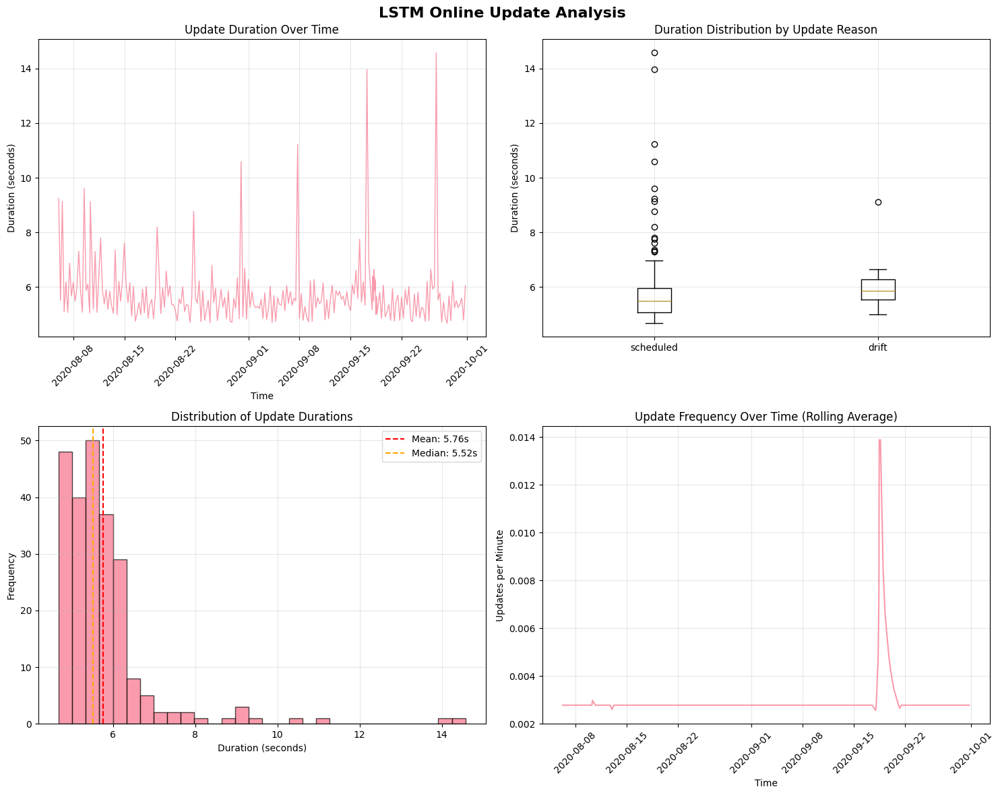

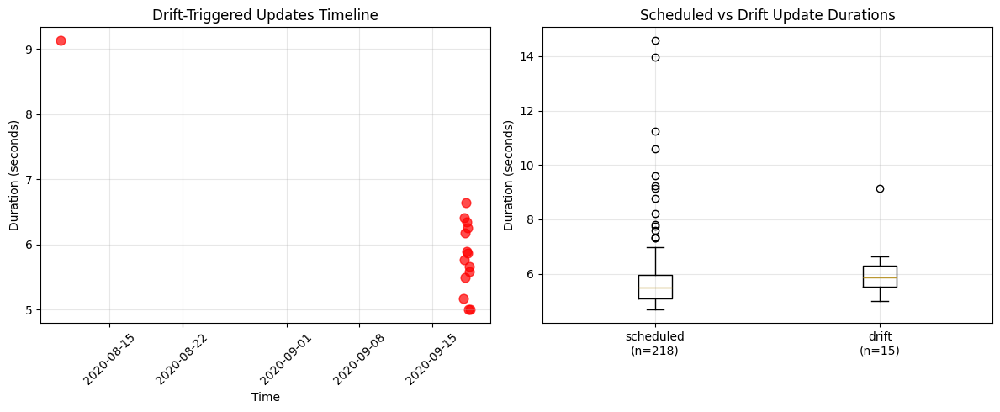

In [77]:
def plot_update_analysis(df):

    plt.style.use('default')
    sns.set_palette("husl")

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('LSTM Online Update Analysis', fontsize=16, fontweight='bold')

    df['datetime'] = pd.to_datetime(df['timestamp'], utc=True)

    # Plot 1: Duration over time
    axes[0, 0].plot(df['datetime'], df['duration_s'], alpha=0.7, linewidth=1)
    axes[0, 0].set_title('Update Duration Over Time')
    axes[0, 0].set_ylabel('Duration (seconds)')
    axes[0, 0].set_xlabel('Time')
    axes[0, 0].tick_params(axis='x', rotation=45)
    axes[0, 0].grid(True, alpha=0.3)

    # Plot 2: Duration distribution by reason
    reasons = df['reason'].unique()
    box_data = [df[df['reason'] == reason]['duration_s'] for reason in reasons]
    axes[0, 1].boxplot(box_data, labels=reasons)
    axes[0, 1].set_title('Duration Distribution by Update Reason')
    axes[0, 1].set_ylabel('Duration (seconds)')
    axes[0, 1].grid(True, alpha=0.3)

    # Plot 3: Histogram of durations
    axes[1, 0].hist(df['duration_s'], bins=30, alpha=0.7, edgecolor='black')
    axes[1, 0].set_title('Distribution of Update Durations')
    axes[1, 0].set_xlabel('Duration (seconds)')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].axvline(df['duration_s'].mean(), color='red', linestyle='--',
                      label=f'Mean: {df["duration_s"].mean():.2f}s')
    axes[1, 0].axvline(df['duration_s'].median(), color='orange', linestyle='--',
                      label=f'Median: {df["duration_s"].median():.2f}s')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Plot 4: Update frequency over time (rolling window)
    df_sorted = df.sort_values('datetime')
    df_sorted['time_diff'] = df_sorted['datetime'].diff().dt.total_seconds() / 60
    rolling_freq = 1 / df_sorted['time_diff'].rolling(window=10, min_periods=1).mean()

    axes[1, 1].plot(df_sorted['datetime'], rolling_freq, alpha=0.7)
    axes[1, 1].set_title('Update Frequency Over Time (Rolling Average)')
    axes[1, 1].set_ylabel('Updates per Minute')
    axes[1, 1].set_xlabel('Time')
    axes[1, 1].tick_params(axis='x', rotation=45)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    return fig

def plot_detailed_drift_analysis(df):

    drift_updates = df[df['reason'] == 'drift']
    if len(drift_updates) == 0:
        print("No drift-triggered updates found in the data.")
        return None

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    drift_updates = drift_updates.copy()
    drift_updates['datetime'] = pd.to_datetime(drift_updates['timestamp'], utc=True)

    # Plot 1: Drift events timeline
    axes[0].scatter(drift_updates['datetime'], drift_updates['duration_s'],
                   alpha=0.7, s=60, color='red')
    axes[0].set_title('Drift-Triggered Updates Timeline')
    axes[0].set_ylabel('Duration (seconds)')
    axes[0].set_xlabel('Time')
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].grid(True, alpha=0.3)

    # Plot 2: Compare scheduled vs drift durations
    comparison_data = []
    labels = []
    for reason in df['reason'].unique():
        comparison_data.append(df[df['reason'] == reason]['duration_s'])
        labels.append(f'{reason}\n(n={len(comparison_data[-1])})')

    axes[1].boxplot(comparison_data, labels=labels)
    axes[1].set_title('Scheduled vs Drift Update Durations')
    axes[1].set_ylabel('Duration (seconds)')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    return fig

def analyze_and_plot_updates(csv_path):

    df = pd.read_csv(csv_path)

    print("=== UPDATE ANALYSIS SUMMARY ===")
    print(f"Total updates: {len(df)}")
    print(f"Time period: {pd.to_datetime(df['timestamp'].min(), utc=True)} to {pd.to_datetime(df['timestamp'].max(), utc=True)}")
    print(f"Duration stats - Mean: {df['duration_s'].mean():.2f}s, Median: {df['duration_s'].median():.2f}s")
    print(f"Min: {df['duration_s'].min():.2f}s, Max: {df['duration_s'].max():.2f}s")
    print("\nUpdate reasons:")
    print(df['reason'].value_counts())

    fig1 = plot_update_analysis(df)
    fig2 = plot_detailed_drift_analysis(df)

    return df, fig1, fig2

df, fig1, fig2 = analyze_and_plot_updates('/content/outputs/FR_LSTM_online_updates.csv')

plt.show()

fig1.savefig('/content/outputs/update_analysis_overview.png', dpi=300, bbox_inches='tight')
if fig2:
   fig2.savefig('/content/outputs/drift_analysis.png', dpi=300, bbox_inches='tight')

INLINE PLOTS/DASHBOARD

 OPSD POWERDESK - DASHBOARD
 Live Country: FR
 Data loaded successfully

 KPI TILES (Last 7 Days)
----------------------------------------
•  Rolling 7-day MASE: 1.339
•  80% PI Coverage: 83.3%
•  Anomaly Hours: 3
•  Last Update: 2020-09-30 18:00:00
•  Update Reason: scheduled

 LIVE MONITORING - Last 14 Days + Next 24h Forecast
--------------------------------------------------

 ONLINE ADAPTATION STATUS
------------------------------
• Total updates: 233
• Drift-triggered: 15
• Scheduled: 218
• Last update: 2020-09-30 18:00:00
• Last reason: scheduled


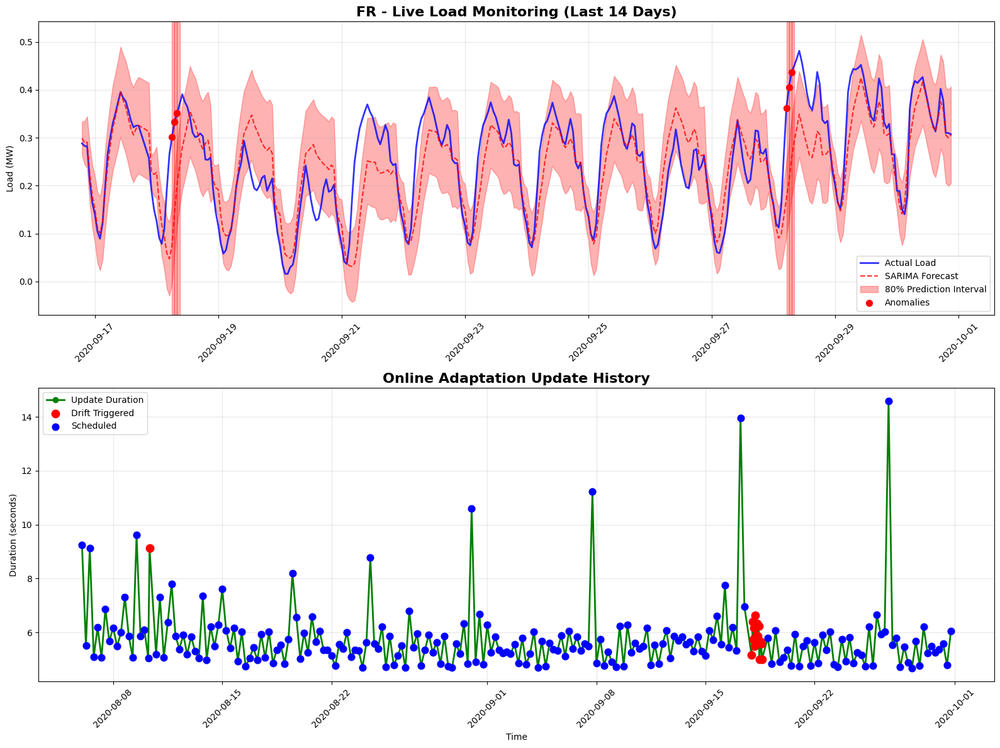


 ANOMALY BREAKDOWN
------------------------------
• Total anomalies detected: 6
• Anomaly rate: 0.34%
• Recent anomalies (last 5):
  - 2020-09-18 07:00:00
  - 2020-09-18 08:00:00
  - 2020-09-28 05:00:00
  - 2020-09-28 06:00:00
  - 2020-09-28 07:00:00



In [43]:
print(" OPSD POWERDESK - DASHBOARD")
print("=" * 60)

live_country = 'FR'
print(f" Live Country: {live_country}")

try:
    forecasts = pd.read_csv(f'/content/outputs/{live_country}_SARIMA_forecasts_test.csv')
    anomalies = pd.read_csv(f'/content/outputs/{live_country}_anomalies.csv')
    online_updates = pd.read_csv(f'/content/outputs/{live_country}_LSTM_online_updates.csv')

    for df in [forecasts, anomalies, online_updates]:
        df['timestamp'] = pd.to_datetime(df['timestamp'])

    print(" Data loaded successfully")

except Exception as e:
    print(f" Error loading files: {e}")

print("\n KPI TILES (Last 7 Days)")
print("-" * 40)

recent_data = forecasts.tail(168).copy()
recent_anomalies = anomalies.tail(168).copy()

if len(recent_data) > 0:
    mase_denominator = np.mean(np.abs(np.diff(recent_data['y_true'])))
    if mase_denominator > 0:
        mase = np.mean(np.abs(recent_data['y_true'] - recent_data['yhat'])) / mase_denominator
    else:
        mase = np.nan

    if all(col in recent_data.columns for col in ['lo', 'hi']):
        coverage = np.mean((recent_data['y_true'] >= recent_data['lo']) &
                          (recent_data['y_true'] <= recent_data['hi']))
    else:
        coverage = np.nan

    anomaly_hours = recent_anomalies['flag_z'].sum() if 'flag_z' in recent_anomalies.columns else 0

    if len(online_updates) > 0:
        last_update = online_updates.iloc[-1]
        last_update_time = last_update['timestamp']
        last_update_reason = last_update['reason']
    else:
        last_update_time = "N/A"
        last_update_reason = "N/A"

    print(f"•  Rolling 7-day MASE: {mase:.3f}" if not np.isnan(mase) else "•  Rolling 7-day MASE: N/A")
    print(f"•  80% PI Coverage: {coverage:.1%}" if not np.isnan(coverage) else "•  80% PI Coverage: N/A")
    print(f"•  Anomaly Hours: {anomaly_hours}")
    print(f"•  Last Update: {last_update_time}")
    print(f"•  Update Reason: {last_update_reason}")

# LIVE SERIES & FORECAST CONE
print("\n LIVE MONITORING - Last 14 Days + Next 24h Forecast")
print("-" * 50)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 12))

# Plot 1: Live series (last 14 days) with forecast cone
last_14_days = forecasts.tail(336)  # 14 days * 24 hours

# Actual vs Forecast
ax1.plot(last_14_days['timestamp'], last_14_days['y_true'],
         label='Actual Load', color='blue', linewidth=2, alpha=0.8)
ax1.plot(last_14_days['timestamp'], last_14_days['yhat'],
         label='SARIMA Forecast', color='red', linewidth=1.5, linestyle='--', alpha=0.8)

# Forecast cone (80% PI) - if available
if all(col in last_14_days.columns for col in ['lo', 'hi']):
    ax1.fill_between(last_14_days['timestamp'], last_14_days['lo'], last_14_days['hi'],
                    alpha=0.3, color='red', label='80% Prediction Interval')

# ANOMALY TAPE: Highlight hours with flag_z=1
anomaly_mask = anomalies['flag_z'] == 1
anomaly_times = anomalies[anomaly_mask]['timestamp']
if not anomaly_times.empty:
    for anomaly_time in anomaly_times:
        if anomaly_time in last_14_days['timestamp'].values:
            ax1.axvspan(anomaly_time, anomaly_time + pd.Timedelta(hours=1),
                       alpha=0.3, color='red', label='_nolegend_')

    anomaly_points = last_14_days[last_14_days['timestamp'].isin(anomaly_times)]
    if not anomaly_points.empty:
        ax1.scatter(anomaly_points['timestamp'], anomaly_points['y_true'],
                   color='red', s=50, zorder=5, label='Anomalies')

ax1.set_title(f'{live_country} - Live Load Monitoring (Last 14 Days)', fontsize=16, fontweight='bold')
ax1.set_ylabel('Load (MW)')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='x', rotation=45)

# Plot 2: Online Adaptation Updates
print("\n ONLINE ADAPTATION STATUS")
print("-" * 30)

if len(online_updates) > 0:
    # Update timeline
    ax2.plot(online_updates['timestamp'], online_updates['duration_s'],
             marker='o', linewidth=2, label='Update Duration', color='green')

    drift_updates = online_updates[online_updates['reason'] == 'drift']
    if not drift_updates.empty:
        ax2.scatter(drift_updates['timestamp'], drift_updates['duration_s'],
                   color='red', s=80, zorder=5, label='Drift Triggered')

    scheduled_updates = online_updates[online_updates['reason'] == 'scheduled']
    if not scheduled_updates.empty:
        ax2.scatter(scheduled_updates['timestamp'], scheduled_updates['duration_s'],
                   color='blue', s=60, zorder=5, label='Scheduled')

    ax2.set_title('Online Adaptation Update History', fontsize=16, fontweight='bold')
    ax2.set_ylabel('Duration (seconds)')
    ax2.set_xlabel('Time')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='x', rotation=45)

    total_updates = len(online_updates)
    drift_count = len(drift_updates)
    scheduled_count = len(scheduled_updates)

    print(f"• Total updates: {total_updates}")
    print(f"• Drift-triggered: {drift_count}")
    print(f"• Scheduled: {scheduled_count}")
    print(f"• Last update: {last_update_time}")
    print(f"• Last reason: {last_update_reason}")

else:
    ax2.text(0.5, 0.5, 'No online adaptation data available',
             ha='center', va='center', transform=ax2.transAxes, fontsize=14)
    ax2.set_title('Online Adaptation Updates', fontsize=16, fontweight='bold')
    print("• No online adaptation data available")

plt.tight_layout()
plt.savefig('/content/outputs/live_dashboard_complete.png', dpi=300, bbox_inches='tight')
plt.show()

# ANOMALY DETAILS
print("\n ANOMALY BREAKDOWN")
print("-" * 30)

if 'flag_z' in anomalies.columns:
    total_anomalies = anomalies['flag_z'].sum()
    anomaly_rate = (total_anomalies / len(anomalies)) * 100

    # Recent anomalies (last 5)
    recent_anoms = anomalies[anomalies['flag_z'] == 1].tail(5)

    print(f"• Total anomalies detected: {total_anomalies}")
    print(f"• Anomaly rate: {anomaly_rate:.2f}%")

    if not recent_anoms.empty:
        print("• Recent anomalies (last 5):")
        for _, row in recent_anoms.iterrows():
            print(f"  - {row['timestamp']}")

print("\n" + "=" * 60)


```
 OPSD POWERDESK - DASHBOARD
============================================================
 Live Country: FR
 Data loaded successfully

 KPI TILES (Last 7 Days)
----------------------------------------
•  Rolling 7-day MASE: 1.339
•  80% PI Coverage: 83.3%
•  Anomaly Hours: 3
•  Last Update: 2020-09-30 18:00:00
•  Update Reason: scheduled

 LIVE MONITORING - Last 14 Days + Next 24h Forecast
--------------------------------------------------

 ONLINE ADAPTATION STATUS
------------------------------
• Total updates: 233
• Drift-triggered: 15
• Scheduled: 218
• Last update: 2020-09-30 18:00:00
• Last reason: scheduled


 ANOMALY BREAKDOWN
------------------------------
• Total anomalies detected: 6
• Anomaly rate: 0.34%
• Recent anomalies (last 5):
  - 2020-09-18 07:00:00
  - 2020-09-18 08:00:00
  - 2020-09-28 05:00:00
  - 2020-09-28 06:00:00
  - 2020-09-28 07:00:00

============================================================
```

Packing outputs

In [44]:
# =====================
# PACK ALL OUTPUTS FOR SUBMISSION
# =====================

print(" PACKAGING ALL OUTPUTS FOR SUBMISSION")
print("=" * 60)

print("Step 1: Creating zip file...")
!zip -r opsd_powerdesk_submission.zip /content/outputs/

print("\nStep 2: Package Contents:")
print("-" * 40)
!find /content/outputs -type f -name "*.csv" -o -name "*.json" -o -name "*.png" | sort

print("\nStep 3: Package Statistics:")
print("-" * 40)
!find /content/outputs -type f | wc -l
print("files total")
!du -sh /content/outputs/
!du -sh opsd_powerdesk_submission.zip

print("\nStep 4: Creating submission summary...")
import datetime
import json

submission_info = {
    "submission_date": str(datetime.datetime.now()),
    "countries": ["AT", "CH", "FR"],
    "live_country": "FR",
    "models": ["SARIMA", "LSTM", "GRU"],
    "anomaly_methods": ["Z-score", "ML Classifier"],
    "online_adaptation": "LSTM tiny neural fine-tune",
    "artifacts_included": {
        "forecasts": ["SARIMA", "LSTM", "GRU forecasts for all countries"],
        "anomalies": ["Z-score detection", "ML classification results"],
        "online_adaptation": ["Update logs", "Drift detection"],
        "analysis_plots": ["STL decomposition", "ACF/PACF", "Dashboard views"],
        "metrics": ["MASE", "sMAPE", "RMSE", "MAPE", "80% PI coverage"]
    }
}

with open('/content/outputs/submission_info.json', 'w') as f:
    json.dump(submission_info, f, indent=2)

readme_content = f"""
OPSD POWERDESK - COMPLETE SUBMISSION PACKAGE
============================================

Generated: {datetime.datetime.now()}

CONTENTS:
---------
 Forecasts: SARIMA, LSTM, GRU models (test sets)
 Anomalies: Z-score detection + ML classification
 Online Adaptation: Live updates & drift detection
 Analysis: STL decomposition, ACF/PACF, model comparisons
 Metrics: Comprehensive performance evaluation

COUNTRIES: AT, CH, FR
LIVE COUNTRY: FR
ADAPTATION STRATEGY: LSTM tiny neural fine-tune

KEY FILES:
----------
- FR_SARIMA_forecasts_test.csv: Main forecasts
- FR_anomalies.csv: Z-score anomaly detection
- FR_LSTM_online_updates.csv: Online adaptation log
- live_dashboard_complete.png: Main dashboard view
- FR_comprehensive_forecast_anomalies.png: Model comparison
- anomaly_ml_eval.json: ML classifier performance

SUBMISSION:
-----------
1. This zip file contains ALL outputs
2. Colab notebook contains ALL code
3. See outputs/ folder for organized results
4. Refer to the one drive (link given at the beginning of this colab) for an organized and easy access to files and images.

Total files: {len([f for f in os.listdir('/content/outputs') if os.path.isfile(os.path.join('/content/outputs', f))])}
"""

with open('/content/outputs/SUBMISSION_README.txt', 'w') as f:
    f.write(readme_content)

print(" Created submission documentation")

print("\nStep 5: Final Verification")
print("-" * 40)

critical_files = [
    'FR_SARIMA_forecasts_test.csv',
    'FR_anomalies.csv',
    'FR_LSTM_online_updates.csv',
    'live_dashboard_complete.png',
    'FR_comprehensive_forecast_anomalies.png'
]

print("Critical files check:")
for file in critical_files:
    path = f'/content/outputs/{file}'
    if os.path.exists(path):
        print(f"   {file}")
    else:
        print(f"   {file} - MISSING")


 PACKAGING ALL OUTPUTS FOR SUBMISSION
Step 1: Creating zip file...
  adding: content/outputs/ (stored 0%)
  adding: content/outputs/CH_GRU_anomalies_plot.png (deflated 4%)
  adding: content/outputs/CH_LSTM_forecasts_test.csv (deflated 70%)
  adding: content/outputs/CH_GRU_forecasts_test.csv (deflated 70%)
  adding: content/outputs/CH_ACF_D-1.png (deflated 6%)
  adding: content/outputs/FR_LSTM_forecasts_test.csv (deflated 75%)
  adding: content/outputs/FR_LSTM_online_updates.csv (deflated 79%)
  adding: content/outputs/ACF_AT_D=1.png (deflated 4%)
  adding: content/outputs/FR_STL.png (deflated 4%)
  adding: content/outputs/GRU_direct_forecast_summary.csv (deflated 43%)
  adding: content/outputs/first_last_14_days_load_vs_timestamp.png (deflated 5%)
  adding: content/outputs/FR_ACF_Original.png (deflated 6%)
  adding: content/outputs/AT_GRU_anomalies_plot.png (deflated 3%)
  adding: content/outputs/CH_STL.png (deflated 4%)
  adding: content/outputs/AT_anomaly_labels_verified.csv (deflate

In [47]:

print("\n" + "=" * 60)
print(" DOWNLOAD INSTRUCTIONS:")
print("=" * 60)
print("1. The file 'opsd_powerdesk_submission.zip' is ready!")
print("2. Run the cell below to download it")
print("3. Submit this zip file + your Colab link")
print("4. File size shown above")

from google.colab import files
files.download('opsd_powerdesk_submission.zip')

print("\n SUBMISSION PACKAGE COMPLETE!")
print("=" * 60)
print("You now have:")
print(" Complete zip file with ALL outputs")
print(" Professional documentation")
print(" All required dashboard elements")
print(" Ready for submission!")


 DOWNLOAD INSTRUCTIONS:
1. The file 'opsd_powerdesk_submission.zip' is ready!
2. Run the cell below to download it
3. Submit this zip file + your Colab link
4. File size shown above

 SUBMISSION PACKAGE COMPLETE!
You now have:
 Complete zip file with ALL outputs
 Professional documentation
 All required dashboard elements
 Ready for submission!
